# Notebook demonstrating the use of Timeseriesai for generating predictions
https://github.com/timeseriesAI/timeseriesAI

## The below is done using the tutorial data set (one state, one season) and is a very small dataset so the results are only intended for use on how to use this, not necessarily what the ML capability is

### uses env timeseriesai

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from tsai.all import *
from joblib import Parallel, delayed
from openavalancheproject.tsai_utilities import *
import numpy as np
import zarr
from fastai.callback.tracker import EarlyStoppingCallback

In [3]:
#set_seed(42,False)

In [4]:
data_root = 'D:/OAPMLData/'

ml_path = data_root + '/4.MLData/'
num_features = 82 
interpolation = 1
label = 'Day1DangerAboveTreeline'
file_label = 'ca_co_day1above_3h_84d_small'

In [5]:
X = zarr.open(ml_path + 'X_' + file_label + '.zarr', mode='r')

In [6]:
X.shape

(48000, 82, 673)

In [7]:
utils = TSAIUtilities(X, label)

In [8]:
feature_names = pd.read_csv(ml_path + 'FeatureLabels_' + file_label + '.csv')
feature_names = feature_names['0'].sort_values().values

In [9]:
#read in the corresponding label files and concat them
#can get the right values here based on the contents of hte ml_path directory


num_train_files = 20 
file_list = []
for i in range(num_train_files):
    file_list.append(pd.read_parquet(ml_path + '/y_train_batch_' + str(i) + '_' + file_label + '.parquet'))

    
num_test_files = 4
for i in range(num_test_files):
    file_list.append(pd.read_parquet(ml_path + '/y_test_batch_' + str(i + num_train_files) + '_' + file_label + '.parquet'))
    
y_df = pd.concat(file_list).reset_index(drop=True)

In [10]:
y_df.shape

(48000, 304)

In [11]:
utils = TSAIUtilities(X, 'Day1DangerAboveTreeline')

In [12]:
#y_df = y_df[y_df['Day1DangerAboveTreelineWithTrend'].notna()].copy()
y_df = y_df[y_df['Day1DangerAboveTreeline'].notna()].copy()

In [12]:
y_df['season'].value_counts()

season
17-18    9093
18-19    8702
19-20    8297
20-21    8000
16-17    6993
15-16    6915
Name: count, dtype: int64

In [13]:
#y_df['Day1DangerAboveTreelineWithTrend'].value_counts()
y_df['Day1DangerAboveTreeline'].value_counts()

Day1DangerAboveTreeline
Considerable    12000
Moderate        12000
High            12000
Low             12000
Name: count, dtype: int64

In [15]:
y_df.reset_index(inplace=True, drop=True)

In [14]:
X.shape

(48000, 82, 673)

In [15]:
train_test_seperator = len(y_df[y_df['season'] != '20-21'])

In [35]:
calc_min_train = True 
if calc_min_train == True:
    feature_mins, feature_maxs = utils.calc_min_max(X, 0, train_test_seperator)

on 0
on 10
on 20
on 30
on 40
on 50
on 60
on 70
on 80


In [36]:
#save feature_mins and feature_maxes to disk
np.save(ml_path + 'feature_mins_' + file_label + '.npy', feature_mins)
np.save(ml_path + 'feature_maxs_' + file_label + '.npy', feature_maxs)

In [16]:
feature_mins = np.load(ml_path + 'feature_mins_' + file_label + '.npy')
feature_maxs = np.load(ml_path + 'feature_maxs_' + file_label + '.npy')

In [17]:
y, cat_dict = utils.get_y_as_cat(y_df)
cat_dict

{0: 'Low', 1: 'Moderate', 2: 'Considerable', 3: 'High'}

In [18]:
y.shape

(48000,)

In [19]:
splits2 = (L(list(y_df[y_df['season']!='20-21'].index.values)).shuffle(), L(list(y_df[y_df['season']=='20-21'].index.values)).shuffle())

In [40]:
splits, dls = utils.create_dls(X, y, feature_mins=np.asarray(feature_mins), feature_maxs=np.asarray(feature_maxs), splits=splits2, sample_frac=1)#, num_test_files=12)
splits

((#40000) [33838,16984,24795,39057,36203,16939,29266,26014,19394,38511...],
 (#8000) [42545,41634,46508,42214,40234,44687,45845,42871,43253,45580...])

CPU times: total: 3.17 s
Wall time: 3.73 s


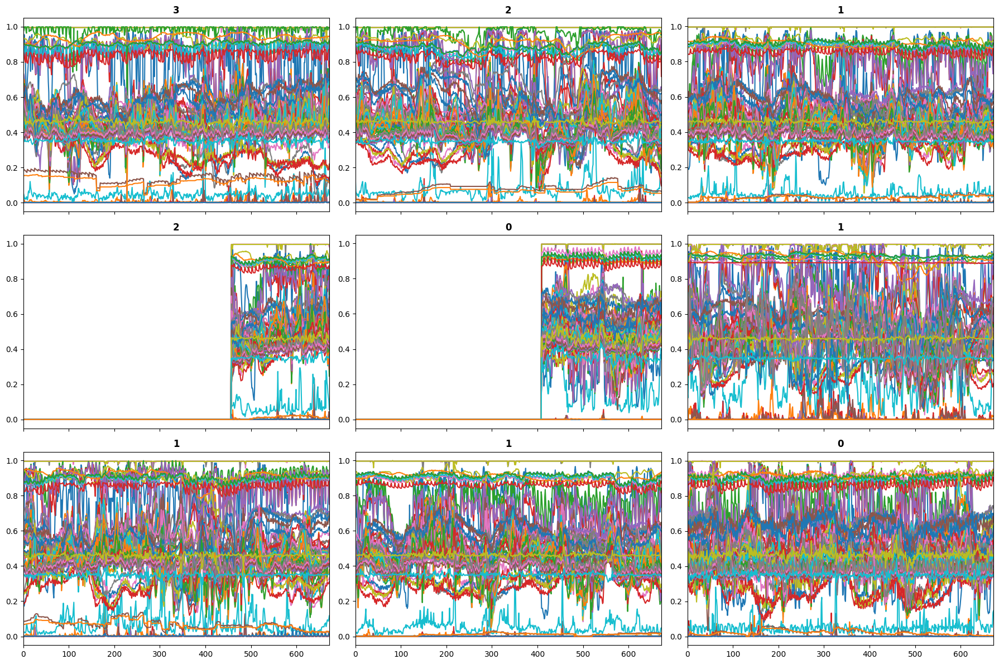

In [41]:
%%time
dls.show_batch()

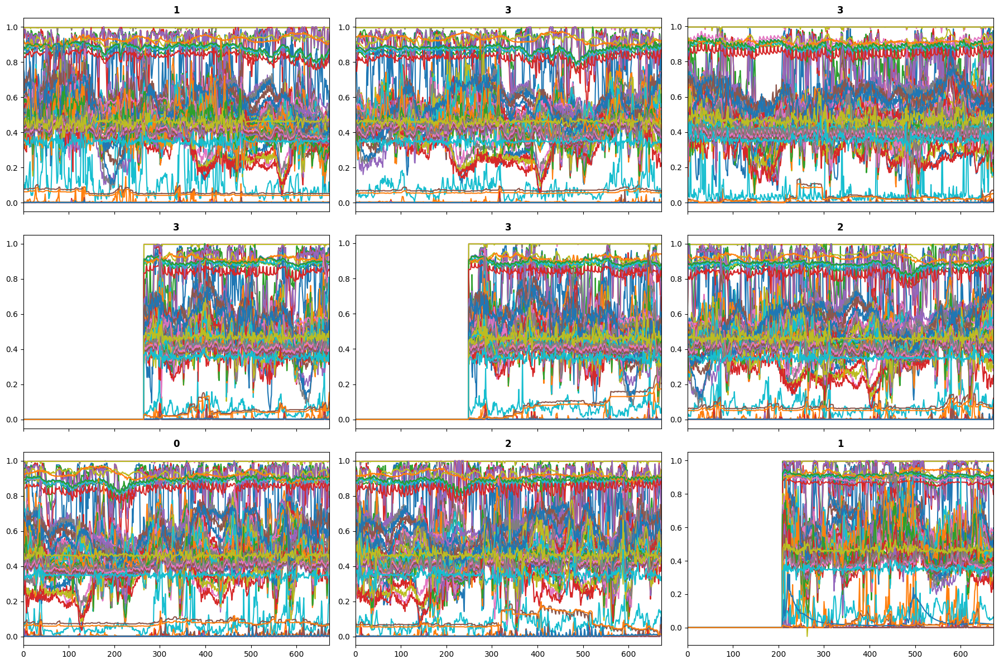

In [42]:
dls.valid.show_batch()

In [20]:
import optuna
from optuna.integration import FastAIPruningCallback
from matplotlib.pyplot import plot, show
import gc
import joblib
from os.path import exists

In [21]:

def objective(trial:optuna.Trial):
  
    
    num_days = trial.suggest_int('num_days', 7, 84, step=7)
    X_sub = X[:, :, -num_days*8:]
    s_frac = trial.suggest_float('sample_frac', .1, 1, step=.1)
    batch_size = trial.suggest_int('batch_size', 4, 128, step=32)
    splits, dls = utils.create_dls(X_sub, y, feature_mins=np.asarray(feature_mins), 
                                   feature_maxs=np.asarray(feature_maxs), 
                                   splits=splits2, sample_frac=s_frac, batch_size=batch_size)
    #fp = trial.suggest_categorical('fp', [16, 32])
    
    model_type = trial.suggest_categorical('model', ['InceptionTimePlus', 'TST', 'XCM', 
                                                     'LSTM', 'FCN', 'LSTM_FCNPlus', 'TCN',
                                                     'ResNetPlus', 'OmniScaleCNN','TSiTPlus', 'XceptionTimePlus'] )
    #model_type = 'InceptionTimePlus'
    learn = None
    if model_type == 'InceptionTimePlus':
        # Define search space here. More info here https://optuna.readthedocs.io/en/stable/tutorial/10_key_features/002_configurations.html
        itp_nf = trial.suggest_categorical('itp_num_filters', [32, 64, 96]) # search through all categorical values in the provided list
        itp_depth = 12 #trial.suggest_int('itp_depth', 3, 13, step=3) # search through all integer values between 3 and 9 with 3 increment steps
        itp_dropout_rate = trial.suggest_float("itp_dropout_rate", 0.0, 0.8, step=.2) 
        itp_fc_dropout_rate = trial.suggest_float("itp_fc_dropout_rate", 0.0, 0.8, step=.2) 
        itp_ks = trial.suggest_int('itp_ks', 20, 60, step=10 )
        # search through all float values between 0.0 and 0.5 in log increment steps
        model = InceptionTimePlus(dls.vars, dls.c, seq_len = num_days * 8, depth=itp_depth, conv_dropout=itp_dropout_rate, fc_dropout=itp_fc_dropout_rate)
    elif model_type == 'TST':
        d_model = trial.suggest_int('d_model', 64, 256, step=64)
        n_heads = trial.suggest_categorical('n_heads', [1,8,16,32])
        d_k = trial.suggest_int('d_k', 16, 64, step=32)
        d_v = trial.suggest_int('d_v', 16, 64, step=32)
        d_ff = trial.suggest_int('d_ff', 128, 512, step=256)
        tst_dropout = trial.suggest_float("tst_dropout", 0.0, 0.8, step=.2)
        n_layers = trial.suggest_int('n_layers', 1, 13, step=2)
        tst_attn_dropout = trial.suggest_float("tst_fc_dropout", 0.0, 0.8, step=.2)
        store_attn = trial.suggest_categorical('store_attn', [True, False])
        model = TSTPlus(dls.vars, dls.c, dls.len, d_model=d_model, n_heads=n_heads, d_k=d_k, d_v=d_v, d_ff=d_ff, store_attn=store_attn, dropout=tst_dropout, n_layers=n_layers, attn_dropout=tst_attn_dropout)
    elif model_type == 'XCM':       
        window_perc = trial.suggest_float('window_perc', .2, 1, step=.2)
        xcm_nf = trial.suggest_int('xcm_nf', 64, 256, step=64)
        xcm_fc_dropout = trial.suggest_float("xcm_fc_dropout", 0.0, 0.8, step=.2)
        model = XCMPlus(dls.vars, dls.c, dls.len, window_perc=window_perc, nf=xcm_nf, fc_dropout=xcm_fc_dropout)
    elif model_type == 'LSTM':        
        hidden_size = trial.suggest_int('hidden_size', 100, 250, step=50)
        lstm_n_layers = trial.suggest_int('lstm_n_layers', 1, 10, step=2)
        rnn_dropout = trial.suggest_float('rnn_dropout', 0, .8, step=.2)
        bidirectional = trial.suggest_categorical('bidirectional', [True, False])
        lstm_fc_dropout = trial.suggest_float('lstm_fc_dropout', 0, .8, step=.2)
        cell_type = trial.suggest_categorical('lstm_cell_type', ['LSTM', 'RNN', 'GRU'])
        if cell_type == 'LSTM':
            model = LSTMPlus(dls.vars, dls.c, hidden_size=hidden_size, n_layers=lstm_n_layers, rnn_dropout=rnn_dropout, bidirectional=bidirectional, fc_dropout=lstm_fc_dropout)
        elif cell_type == 'RNN':
            model = RNNPlus(dls.vars, dls.c, hidden_size=hidden_size, n_layers=lstm_n_layers, rnn_dropout=rnn_dropout, bidirectional=bidirectional, fc_dropout=lstm_fc_dropout)
        elif cell_type == 'GRU':
            model = GRUPlus(dls.vars, dls.c, hidden_size=hidden_size, n_layers=lstm_n_layers, rnn_dropout=rnn_dropout, bidirectional=bidirectional, fc_dropout=lstm_fc_dropout)
    elif model_type =='FCN':
        fcn_fc_dropout = trial.suggest_float('fcn_fc_dropout', 0, .8, step=.2)
        model = FCNPlus(dls.vars, dls.c, fc_dropout=fcn_fc_dropout)
    elif model_type == 'OmniScaleCNN':
        model = TSTPlus(dls.vars, dls.c, dls.len)
    elif model_type == 'LSTM_FCNPlus':
        lstm_fcn_hidden_size = trial.suggest_int('lstm_fcn_hidden_size', 100, 250, step=50)
        lstm_fcn_n_layers = trial.suggest_int('lstm_fcn_n_layers', 1, 10, step=2)        
        lstm_fcn_rnn_dropout = trial.suggest_float('lstm_fcn_rnn_dropout', 0, .8, step=.2)
        lstm_fcn_bidirectional = trial.suggest_categorical('lstm_fcn_bidirectional', [True, False])        
        lstm_fcn_cell_dropout = trial.suggest_float('lstm_fcn_cell_dropout', 0, .8, step=.2)
        lstm_fcn_cell_type = trial.suggest_categorical('lstm_fcn_cell_type', ['LSTM', 'RNN', 'GRU'])
        if lstm_fcn_cell_type == 'LSTM':
            model = LSTM_FCNPlus(dls.vars, dls.c, dls.len, hidden_size=lstm_fcn_hidden_size, rnn_layers=lstm_fcn_n_layers, rnn_dropout=lstm_fcn_rnn_dropout, bidirectional=lstm_fcn_bidirectional, cell_dropout=lstm_fcn_cell_dropout)
        elif lstm_fcn_cell_type == 'RNN':
            model = RNN_FCNPlus(dls.vars, dls.c, dls.len, hidden_size=lstm_fcn_hidden_size, rnn_layers=lstm_fcn_n_layers, rnn_dropout=lstm_fcn_rnn_dropout, bidirectional=lstm_fcn_bidirectional, cell_dropout=lstm_fcn_cell_dropout)
        elif lstm_fcn_cell_type == 'GRU':
            model = GRU_FCNPlus(dls.vars, dls.c, dls.len, hidden_size=lstm_fcn_hidden_size, rnn_layers=lstm_fcn_n_layers, rnn_dropout=lstm_fcn_rnn_dropout, bidirectional=lstm_fcn_bidirectional, cell_dropout=lstm_fcn_cell_dropout)
    elif model_type=='ResNetPlus':
        resnetplus_fc_dropout = trial.suggest_float('resnetplus_fc_dropout', 0, .8, step=.2)
        model = ResNetPlus(dls.vars, dls.c, fc_dropout=resnetplus_fc_dropout)
    elif model_type=='TCN':
        TCN_fc_dropout = trial.suggest_float('TCN_fc_dropout', 0, .8, step=.2)
        TCN_conv_dropout = trial.suggest_float('TCN_conv_dropout', 0, .8, step=.2)
        model = TCN(dls.vars, dls.c, conv_dropout=TCN_conv_dropout, fc_dropout=TCN_fc_dropout)
    elif model_type=='TSiTPlus':
        TSiTPlus_attn_dropout = trial.suggest_float('TSiTPlus_attn_dropout', 0, .8, step=.2)
        TSiTPlus_dropout = trial.suggest_float('TSiTPlus_dropout', 0, .8, step=.2)
        model = TSiTPlus(dls.vars, dls.c, dls.len, attn_dropout=TSiTPlus_dropout, dropout=TSiTPlus_dropout)
    elif model_type=='XceptionTimePlus':       
        model = XceptionTimePlus(dls.vars, dls.c)
        
    loss_func = trial.suggest_categorical('loss_func', ['LabelSmoothingCrossEntropy', 'LabelSmoothingCrossEntropyFlat', 'None'])
    actual_loss_func = None
    if loss_func == 'LabelSmoothingCrossEntropy':
         actual_loss_func = LabelSmoothingCrossEntropy()
    elif loss_func == 'LabelSmoothingCrossEntropyFlat':
         actual_loss_func = LabelSmoothingCrossEntropyFlat()
    
    learning_rate = 10 ** trial.suggest_int("learning_rate", -5, -2, step=1)
    actual_learner_callback = None
    learner_callback = trial.suggest_categorical('learner_callback', ['None', 'CutMix1d', 'IntraClassCutMix1d'])
    actual_learner_callback = None
    if learner_callback == 'CutMix1d':
        actual_learner_callback = CutMix1d()
    elif learner_callback == 'IntraClassCutMix1d':
        actual_learner_callback = IntraClassCutMix1d()
    
    optimizer = trial.suggest_categorical('optimizer', ['AdamWD', 'AdamNoWD'])
    actual_optimizer = None 
    actual_optimizer = partial(Adam, decouple_wd=True)
    if optimizer == 'AdamWD':
        actual_optimizer = partial(Adam, decouple_wd=True)
    elif optimizer == 'AdamNoWD':
        actual_optimizer = partial(Adam, decouple_wd=False)
        
    #if fp == 32:
    learn = Learner(dls, model, metrics=[accuracy, BalancedAccuracy()], opt_func=actual_optimizer, loss_func=actual_loss_func, cbs=actual_learner_callback)
    #learn = Learner(dls, model, metrics=[accuracy, BalancedAccuracy()])
    #else:
    #    learn = Learner(dls, model, metrics=[accuracy, BalancedAccuracy()], loss_func=actual_loss_func).to_fp16()
    
    print(str(trial.params))
    try:
        learn.fit_one_cycle(200, learning_rate, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.001, patience=7)])
    except RuntimeError as e:
        print('Runtime error ' + str(e))
        
        del(model)
        del(learn)
        gc.collect()
        torch.cuda.empty_cache()
        
        return 0
    objective = max([x[2] for x in learn.recorder.values]) #returns the accuracy store #was best balanced accuracy acheived
    
    learn.recorder.plot_metrics()    
    
    try:        
        interp = ClassificationInterpretation.from_learner(learn)
        conf_matrix = interp.plot_confusion_matrix(normalize=True)
        show(block=False)
    except BaseException as e:
        print('Error showing stats' + str(e))
        #learn = learn.to_native_fp32()
        #interp = ClassificationInterpretation.from_learner(learn)
        #conf_matrix = interp.plot_confusion_matrix(normalize=True)
        #show(block=False)
    
    #clean up
    del(model)
    del(learn)
    gc.collect()
    torch.cuda.empty_cache()
    
    joblib.dump(study, "study.pkl")
    return objective
    

[I 2023-10-22 08:19:15,021] A new study created in memory with name: no-name-887a8b30-e7a0-4800-b68d-cd76728e5184


{'num_days': 84, 'sample_frac': 0.30000000000000004, 'batch_size': 100, 'model': 'ResNetPlus', 'resnetplus_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.468015,1.395068,0.283333,0.281157,00:12
1,1.438049,1.359974,0.360417,0.358117,00:10
2,1.416934,1.333309,0.400000,0.398491,00:10
3,1.400914,1.314661,0.415000,0.414236,00:10
4,1.391275,1.298988,0.419167,0.418718,00:10
5,1.372981,1.289485,0.412083,0.411731,00:10
6,1.374630,1.281796,0.413333,0.412928,00:10
7,1.363526,1.277920,0.407917,0.407671,00:10
8,1.354588,1.275633,0.418750,0.418707,00:10
9,1.351387,1.272556,0.415000,0.414862,00:10


No improvement since epoch 36: early stopping


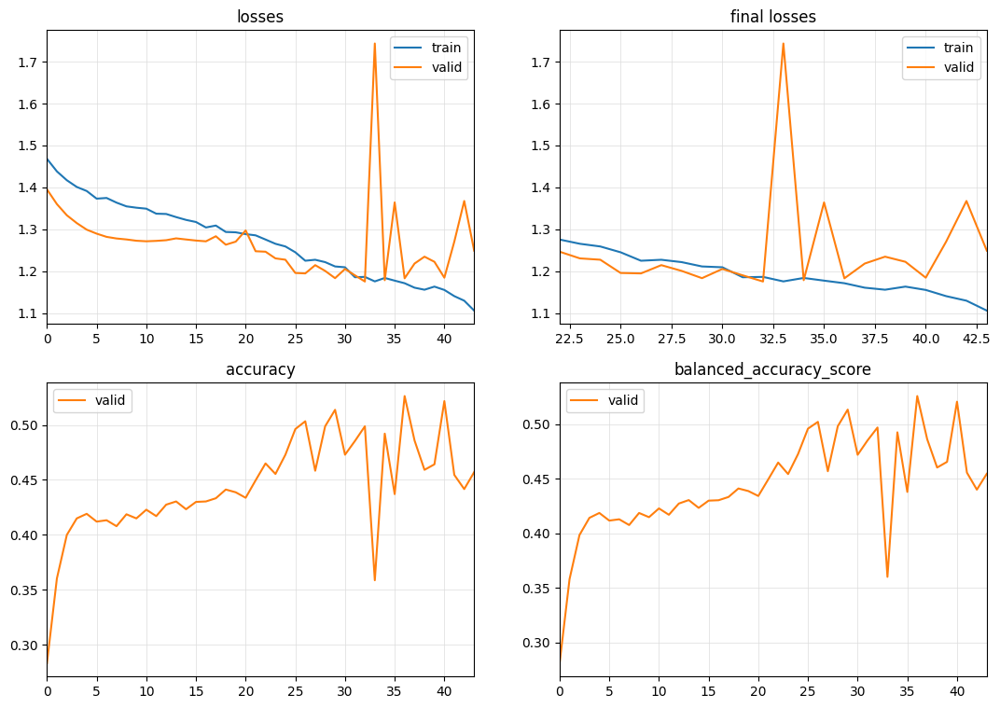

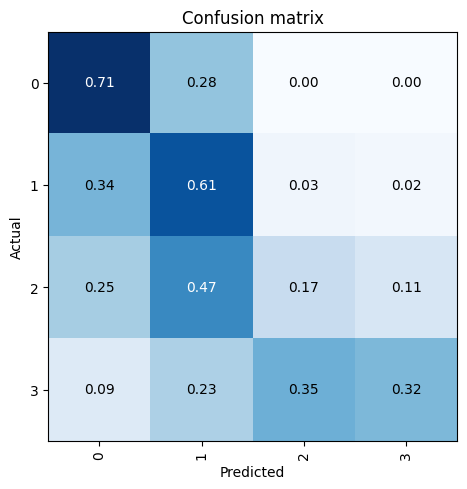

[I 2023-10-22 08:27:05,250] Trial 0 finished with value: 0.5262500047683716 and parameters: {'num_days': 84, 'sample_frac': 0.30000000000000004, 'batch_size': 100, 'model': 'ResNetPlus', 'resnetplus_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}. Best is trial 0 with value: 0.5262500047683716.


{'num_days': 49, 'sample_frac': 0.8, 'batch_size': 4, 'model': 'ResNetPlus', 'resnetplus_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -3, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.154408,1.164289,0.501719,0.499959,02:17
1,1.006176,1.153456,0.514687,0.513540,02:33
2,0.969890,1.140427,0.503750,0.503298,02:23
3,0.978327,1.273898,0.434844,0.433573,02:15
4,0.950306,1.196447,0.505313,0.504166,02:15
5,0.898682,1.183102,0.505156,0.504504,02:15
6,0.929229,1.201862,0.507656,0.507395,02:14
7,0.913240,1.356114,0.463906,0.462401,02:24
8,0.960611,1.263725,0.461406,0.460332,02:34


No improvement since epoch 1: early stopping


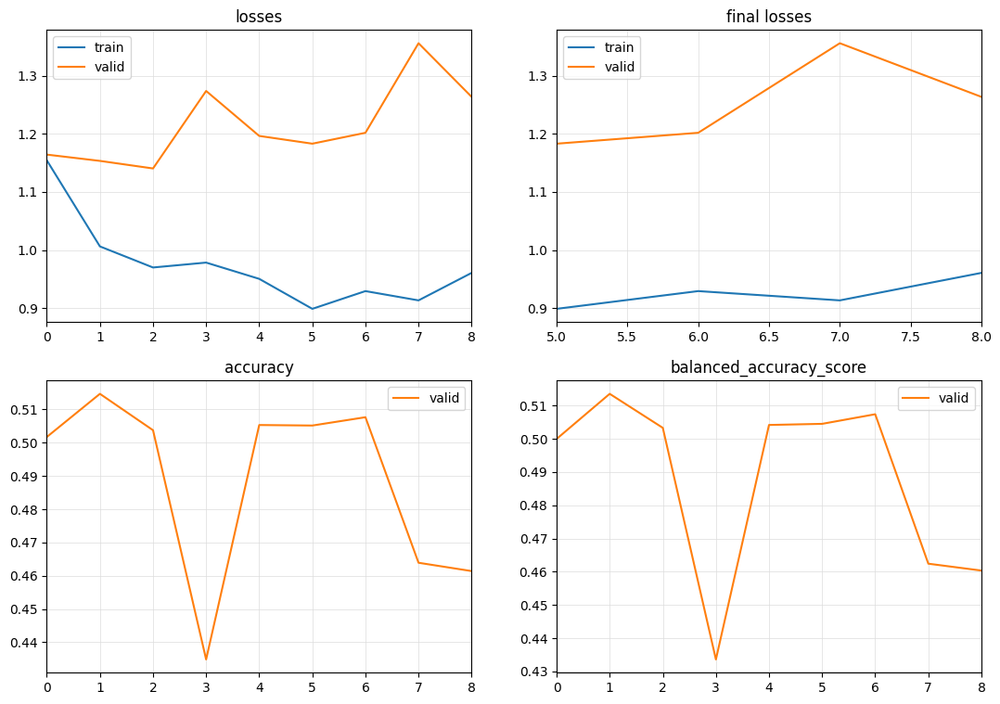

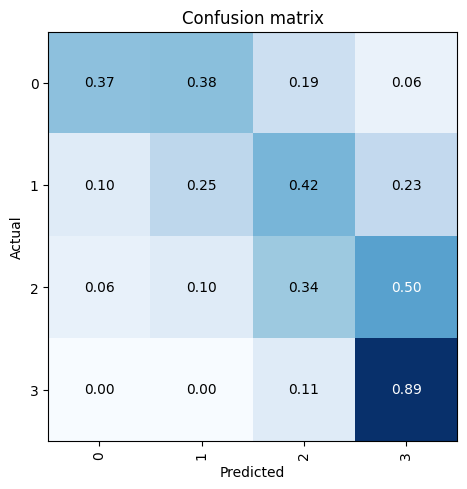

[I 2023-10-22 08:49:07,330] Trial 1 finished with value: 0.5146874785423279 and parameters: {'num_days': 49, 'sample_frac': 0.8, 'batch_size': 4, 'model': 'ResNetPlus', 'resnetplus_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -3, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}. Best is trial 0 with value: 0.5262500047683716.


{'num_days': 56, 'sample_frac': 0.9, 'batch_size': 36, 'model': 'TCN', 'TCN_fc_dropout': 0.4, 'TCN_conv_dropout': 0.0, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.394009,1.394344,0.251111,0.250000,00:34
1,1.388267,1.390797,0.251111,0.250000,00:33
2,1.388016,1.389311,0.251111,0.250000,00:33
3,1.387110,1.388621,0.251111,0.250000,00:33
4,1.386820,1.387966,0.237083,0.238471,00:33
5,1.384593,1.386200,0.272361,0.271949,00:33
6,1.380540,1.380904,0.286806,0.286066,00:33
7,1.365147,1.356647,0.329583,0.332123,00:33
8,1.334147,1.310008,0.354306,0.357218,00:33
9,1.313318,1.296452,0.356528,0.358153,00:33


No improvement since epoch 12: early stopping


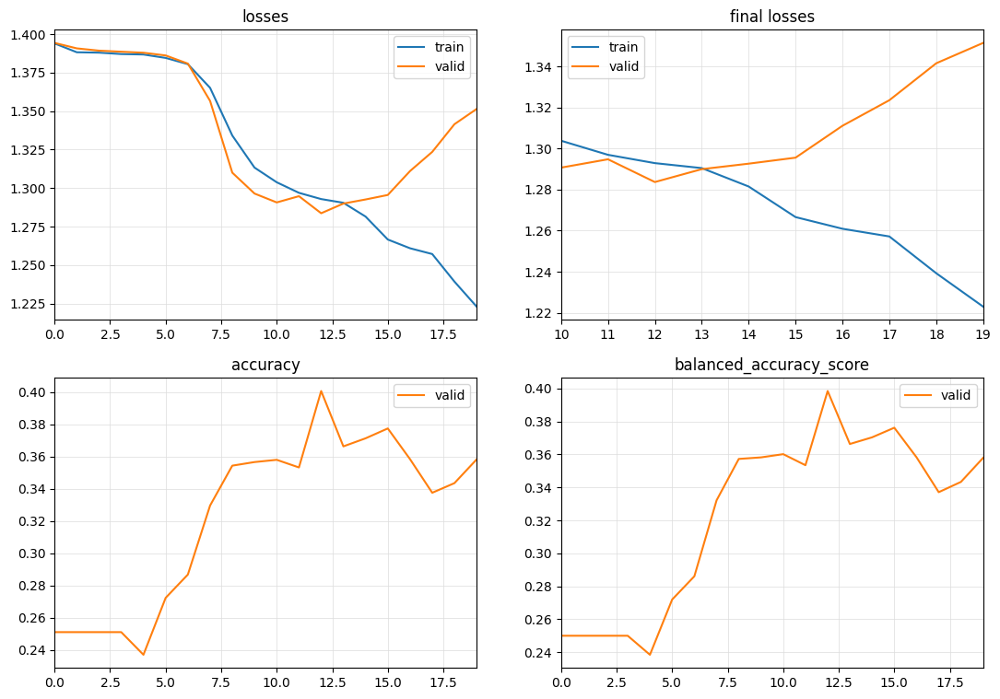

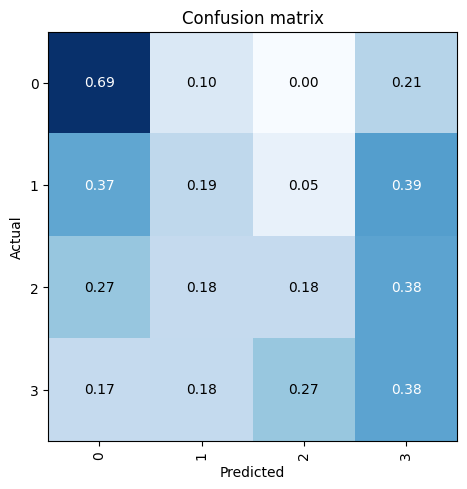

[I 2023-10-22 09:00:51,551] Trial 2 finished with value: 0.4005555510520935 and parameters: {'num_days': 56, 'sample_frac': 0.9, 'batch_size': 36, 'model': 'TCN', 'TCN_fc_dropout': 0.4, 'TCN_conv_dropout': 0.0, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamWD'}. Best is trial 0 with value: 0.5262500047683716.


{'num_days': 84, 'sample_frac': 0.6, 'batch_size': 36, 'model': 'XCM', 'window_perc': 0.2, 'xcm_nf': 192, 'xcm_fc_dropout': 0.6000000000000001, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.247519,1.305423,0.360417,0.361453,02:55
1,1.218647,1.148452,0.505625,0.505108,02:54
2,1.211348,1.834713,0.273750,0.271813,02:55
3,1.188243,1.171948,0.457917,0.458707,02:55
4,1.201614,1.335902,0.391875,0.390859,02:54
5,1.186918,1.452679,0.377917,0.378682,02:55
6,1.176085,1.214069,0.450625,0.451573,02:54
7,1.175702,1.173568,0.456458,0.457386,02:54
8,1.145046,1.132449,0.490417,0.490861,02:55


No improvement since epoch 1: early stopping


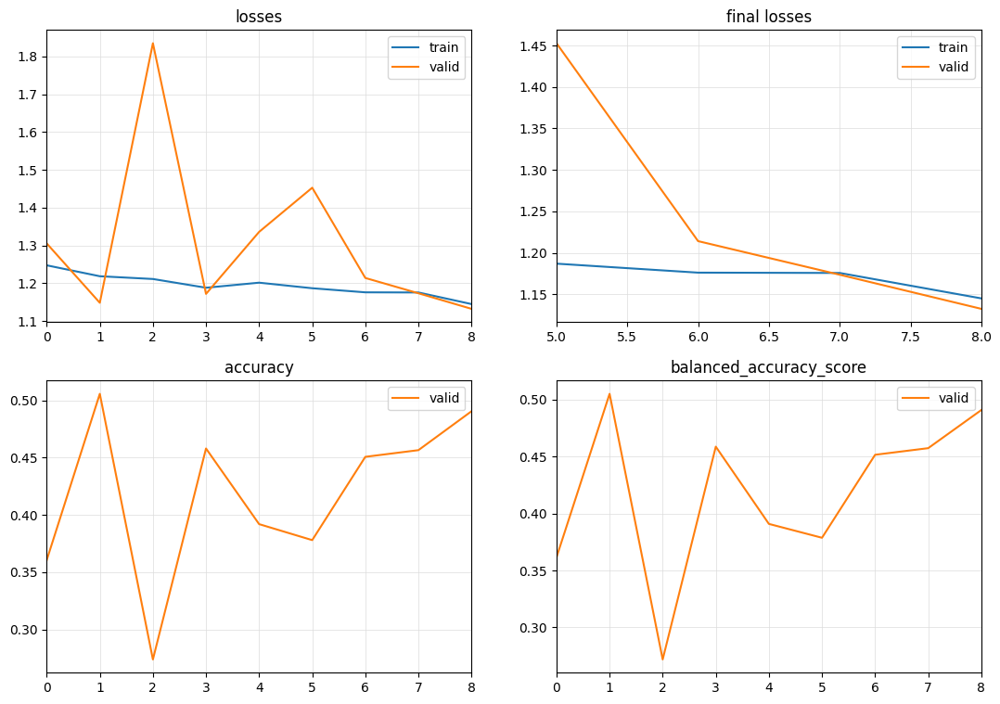

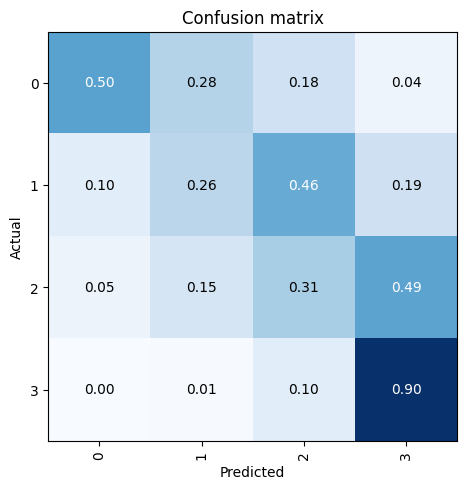

[I 2023-10-22 09:27:45,248] Trial 3 finished with value: 0.5056250095367432 and parameters: {'num_days': 84, 'sample_frac': 0.6, 'batch_size': 36, 'model': 'XCM', 'window_perc': 0.2, 'xcm_nf': 192, 'xcm_fc_dropout': 0.6000000000000001, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}. Best is trial 0 with value: 0.5262500047683716.


{'num_days': 7, 'sample_frac': 0.6, 'batch_size': 68, 'model': 'TCN', 'TCN_fc_dropout': 0.8, 'TCN_conv_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -4, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.393005,1.391514,0.250208,0.250000,00:14
1,1.391881,1.390871,0.250208,0.250000,00:13
2,1.389230,1.390189,0.250208,0.250000,00:13
3,1.388809,1.389433,0.250208,0.250000,00:13
4,1.389707,1.388677,0.250208,0.250000,00:13
5,1.387619,1.387636,0.250208,0.250000,00:13
6,1.387162,1.386392,0.250208,0.250000,00:13
7,1.386156,1.384971,0.256875,0.256623,00:13
8,1.385337,1.383462,0.412917,0.411134,00:13
9,1.381415,1.381022,0.317917,0.316196,00:13


No improvement since epoch 16: early stopping


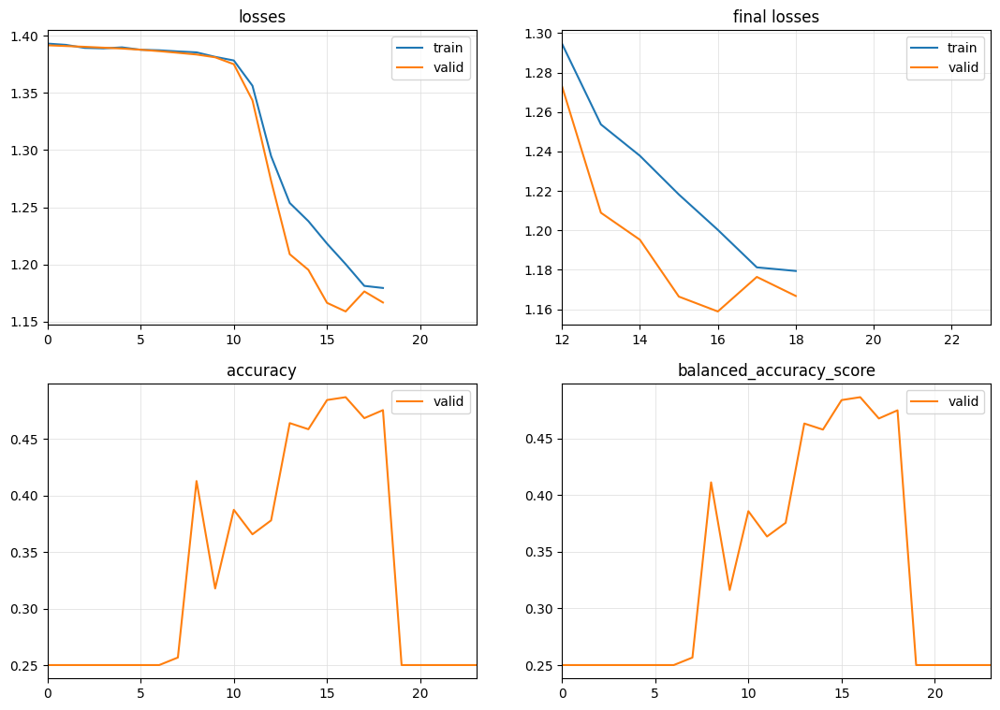

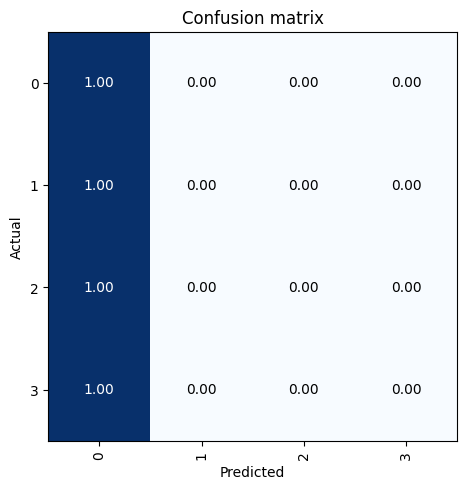

[I 2023-10-22 09:33:27,895] Trial 4 finished with value: 0.4870833456516266 and parameters: {'num_days': 7, 'sample_frac': 0.6, 'batch_size': 68, 'model': 'TCN', 'TCN_fc_dropout': 0.8, 'TCN_conv_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -4, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamNoWD'}. Best is trial 0 with value: 0.5262500047683716.


{'num_days': 70, 'sample_frac': 1.0, 'batch_size': 68, 'model': 'LSTM_FCNPlus', 'lstm_fcn_hidden_size': 250, 'lstm_fcn_n_layers': 9, 'lstm_fcn_rnn_dropout': 0.6000000000000001, 'lstm_fcn_bidirectional': True, 'lstm_fcn_cell_dropout': 0.8, 'lstm_fcn_cell_type': 'RNN', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.462075,1.338359,0.346125,0.346125,00:56
1,1.420302,1.313659,0.365625,0.365625,00:57
2,1.425768,1.299527,0.379125,0.379125,00:56
3,1.404485,1.288804,0.389375,0.389375,00:56
4,1.392923,1.284127,0.384750,0.384750,00:56
5,1.362031,1.280961,0.389000,0.389000,00:56
6,1.343419,1.280762,0.402250,0.402250,00:57
7,1.330262,1.285645,0.393250,0.393250,00:56
8,1.300101,1.291544,0.407875,0.407875,00:57
9,1.300764,1.296955,0.418750,0.418750,01:05


No improvement since epoch 19: early stopping


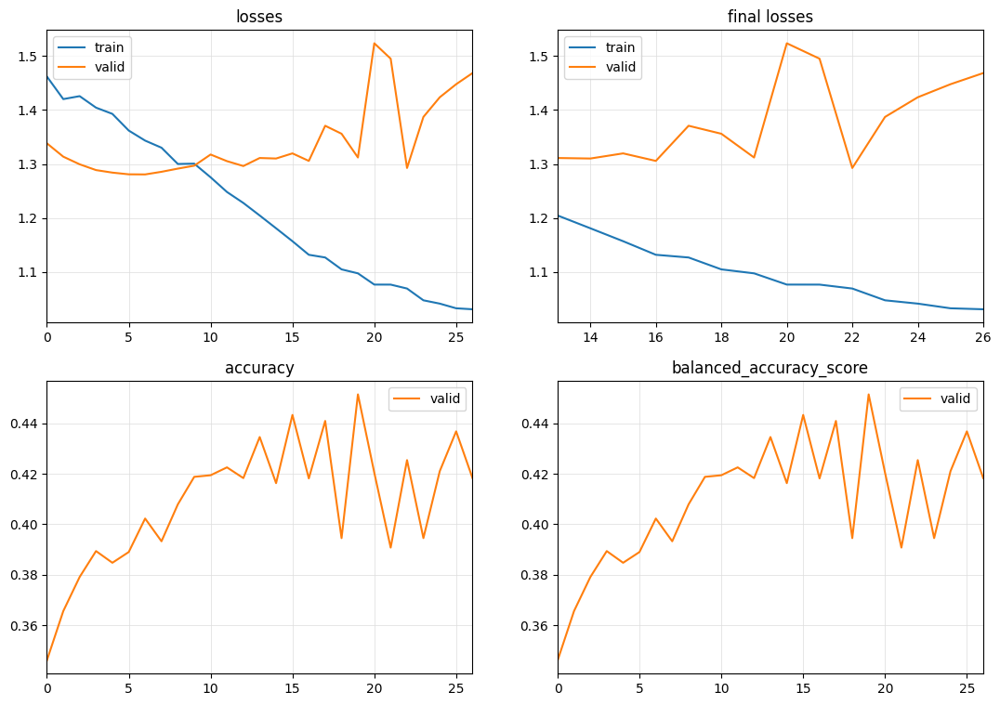

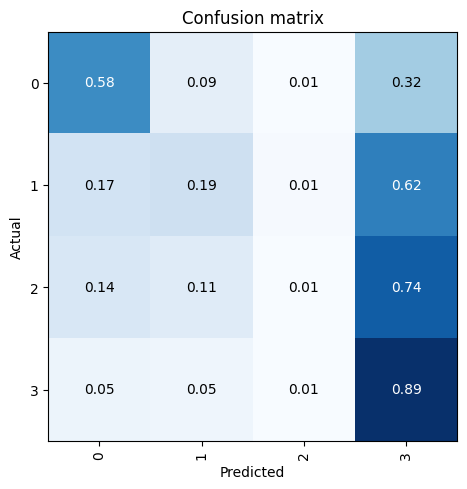

[I 2023-10-22 10:01:03,941] Trial 5 finished with value: 0.45137500762939453 and parameters: {'num_days': 70, 'sample_frac': 1.0, 'batch_size': 68, 'model': 'LSTM_FCNPlus', 'lstm_fcn_hidden_size': 250, 'lstm_fcn_n_layers': 9, 'lstm_fcn_rnn_dropout': 0.6000000000000001, 'lstm_fcn_bidirectional': True, 'lstm_fcn_cell_dropout': 0.8, 'lstm_fcn_cell_type': 'RNN', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}. Best is trial 0 with value: 0.5262500047683716.


{'num_days': 77, 'sample_frac': 0.1, 'batch_size': 4, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.8, 'TSiTPlus_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.441781,1.543224,0.245000,0.250000,01:22
1,1.388419,1.558850,0.245000,0.250000,01:21
2,1.383479,1.563204,0.245000,0.250000,01:25
3,1.390815,1.560143,0.245000,0.250000,01:28
4,1.393259,1.562222,0.245000,0.250000,01:21
5,1.394755,1.559006,0.245000,0.250000,01:22
6,1.376493,1.538820,0.245000,0.250000,01:22
7,1.380224,1.553718,0.245000,0.250000,01:22


No improvement since epoch 0: early stopping


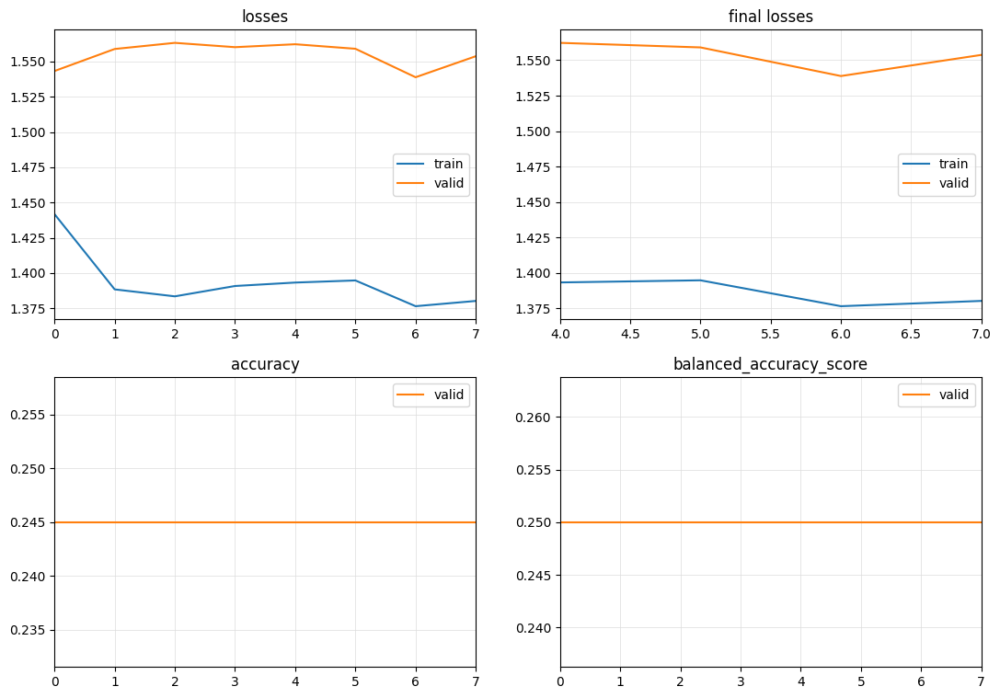

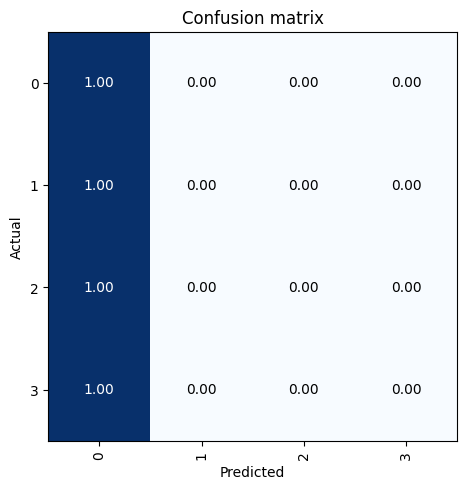

[I 2023-10-22 10:12:42,435] Trial 6 finished with value: 0.24500000476837158 and parameters: {'num_days': 77, 'sample_frac': 0.1, 'batch_size': 4, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.8, 'TSiTPlus_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}. Best is trial 0 with value: 0.5262500047683716.


{'num_days': 77, 'sample_frac': 0.2, 'batch_size': 100, 'model': 'FCN', 'fcn_fc_dropout': 0.2, 'loss_func': 'None', 'learning_rate': -2, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.213664,1.354606,0.328125,0.330243,00:04
1,1.162692,2.030039,0.331875,0.334574,00:04
2,1.129071,1.986170,0.378125,0.381944,00:04
3,1.107883,1.279812,0.431250,0.436185,00:04
4,1.101102,1.660024,0.403750,0.407828,00:04
5,1.088386,1.436513,0.363750,0.360712,00:04
6,1.067952,2.865871,0.266875,0.269697,00:04
7,1.050250,1.846319,0.331875,0.335171,00:04
8,1.043793,2.027203,0.355000,0.358586,00:04
9,1.050273,1.534510,0.376875,0.381069,00:04


No improvement since epoch 3: early stopping


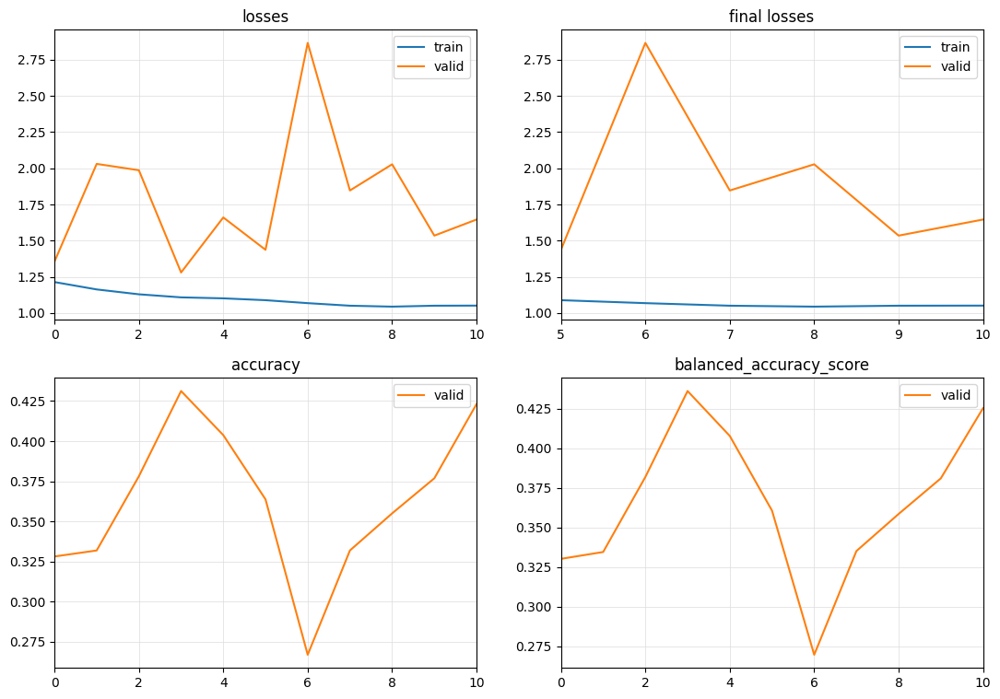

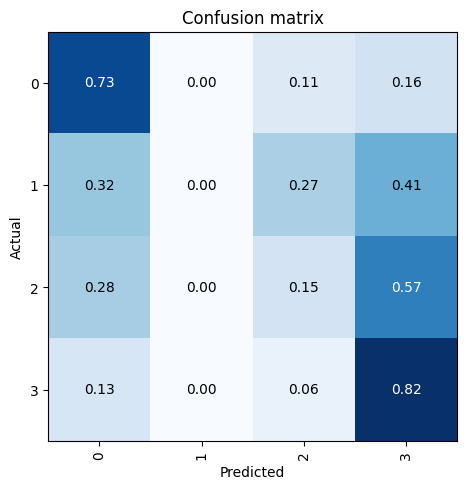

[I 2023-10-22 10:13:49,324] Trial 7 finished with value: 0.4312500059604645 and parameters: {'num_days': 77, 'sample_frac': 0.2, 'batch_size': 100, 'model': 'FCN', 'fcn_fc_dropout': 0.2, 'loss_func': 'None', 'learning_rate': -2, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}. Best is trial 0 with value: 0.5262500047683716.


{'num_days': 63, 'sample_frac': 0.1, 'batch_size': 4, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.2, 'TSiTPlus_dropout': 0.2, 'loss_func': 'None', 'learning_rate': -3, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.356211,1.341422,0.370000,0.367242,01:07
1,1.262747,1.304271,0.387500,0.383905,01:08
2,1.272232,1.283487,0.375000,0.370047,01:08
3,1.285602,1.361392,0.396250,0.390529,01:08
4,1.271043,1.256812,0.416250,0.410771,01:06
5,1.269885,1.255819,0.422500,0.418033,01:08
6,1.289207,1.231308,0.413750,0.409237,01:08
7,1.254433,1.254830,0.403750,0.397326,01:02
8,1.294145,1.213326,0.428750,0.424781,01:02
9,1.252048,1.218210,0.425000,0.418359,01:02


No improvement since epoch 20: early stopping


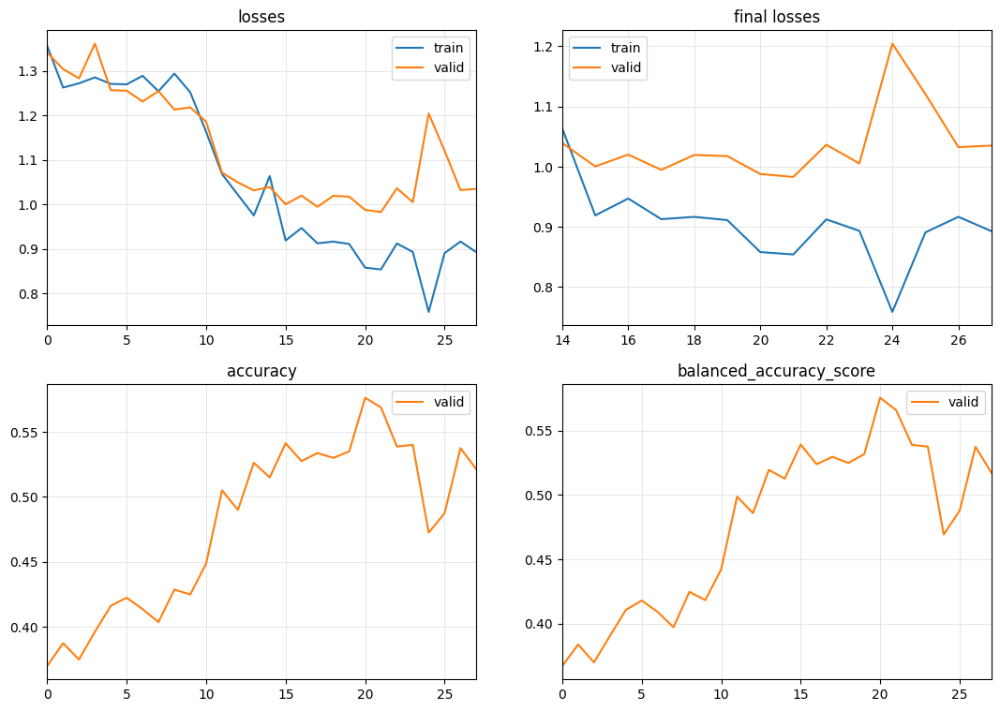

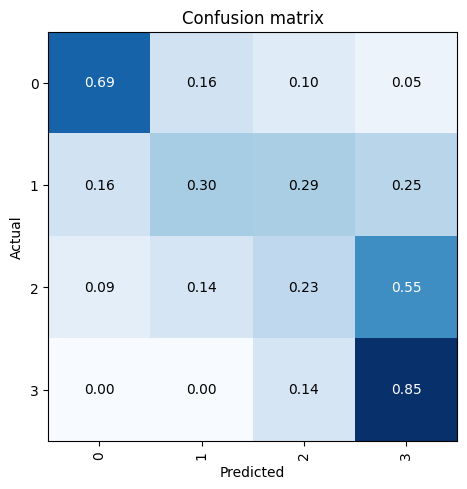

[I 2023-10-22 10:44:19,418] Trial 8 finished with value: 0.5762500166893005 and parameters: {'num_days': 63, 'sample_frac': 0.1, 'batch_size': 4, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.2, 'TSiTPlus_dropout': 0.2, 'loss_func': 'None', 'learning_rate': -3, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamNoWD'}. Best is trial 8 with value: 0.5762500166893005.


{'num_days': 7, 'sample_frac': 0.6, 'batch_size': 36, 'model': 'XceptionTimePlus', 'loss_func': 'None', 'learning_rate': -3, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.213324,1.177058,0.486875,0.488489,00:19
1,1.187024,1.177663,0.478542,0.480526,00:20
2,1.158347,1.190885,0.476250,0.478060,00:20
3,1.140848,1.191035,0.489583,0.491051,00:20
4,1.119770,1.199909,0.463125,0.464847,00:20
5,1.090345,1.188940,0.455625,0.457720,00:20
6,1.107527,1.199614,0.476042,0.476792,00:19
7,1.082042,1.183992,0.459583,0.461311,00:20
8,1.059545,1.179369,0.459167,0.461016,00:20
9,1.057162,1.168746,0.469792,0.470862,00:20


No improvement since epoch 3: early stopping


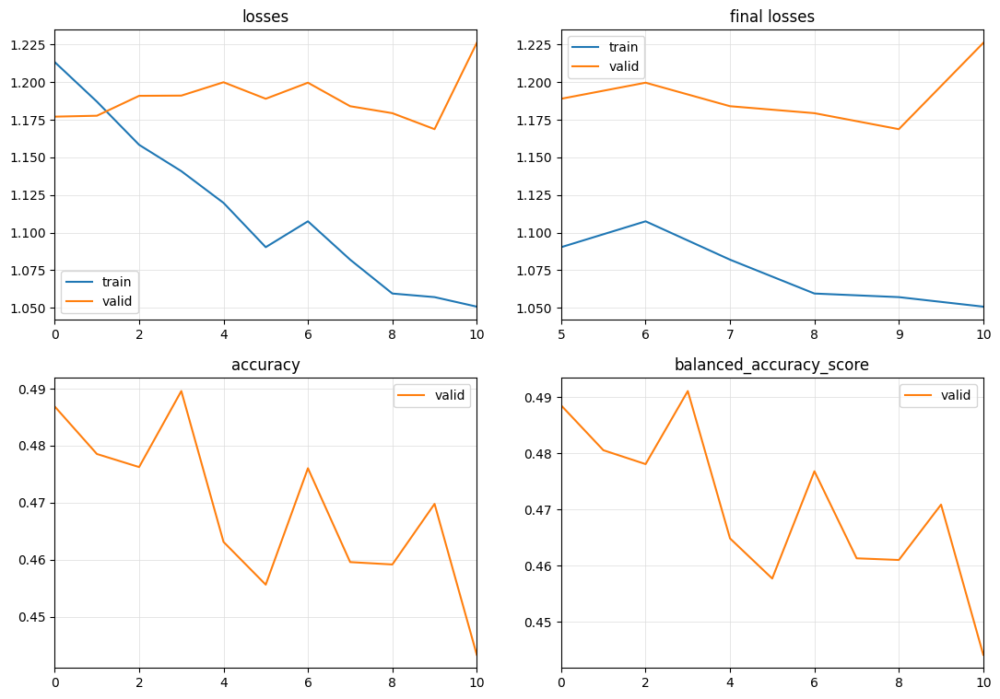

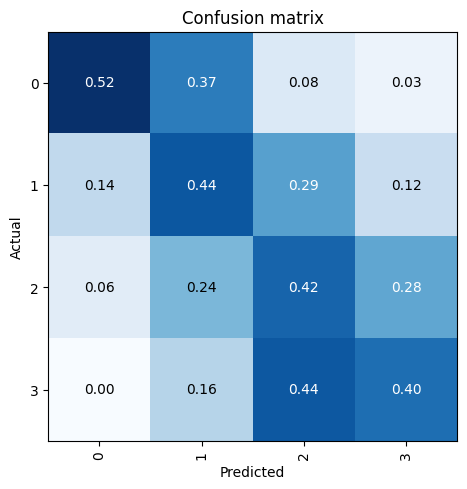

[I 2023-10-22 10:48:23,788] Trial 9 finished with value: 0.4895833432674408 and parameters: {'num_days': 7, 'sample_frac': 0.6, 'batch_size': 36, 'model': 'XceptionTimePlus', 'loss_func': 'None', 'learning_rate': -3, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}. Best is trial 8 with value: 0.5762500166893005.


{'num_days': 14, 'sample_frac': 0.9, 'batch_size': 36, 'model': 'TST', 'd_model': 64, 'n_heads': 32, 'd_k': 16, 'd_v': 48, 'd_ff': 384, 'tst_dropout': 0.2, 'n_layers': 5, 'tst_fc_dropout': 0.0, 'store_attn': True, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -2, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.071292,1.230357,0.480694,0.480699,01:12
1,1.022680,1.415099,0.460000,0.460029,01:12
2,1.029564,1.243798,0.442222,0.442115,01:13
3,0.999145,1.213782,0.543056,0.543223,01:12
4,0.988610,1.196571,0.497778,0.497587,01:15
5,0.981351,1.187856,0.508056,0.508171,01:15
6,1.000032,1.138644,0.572361,0.572442,01:13
7,0.989323,1.113056,0.554722,0.554800,01:12
8,1.072636,1.311254,0.386528,0.386998,01:12
9,1.343965,1.344053,0.327361,0.327477,01:17


No improvement since epoch 6: early stopping


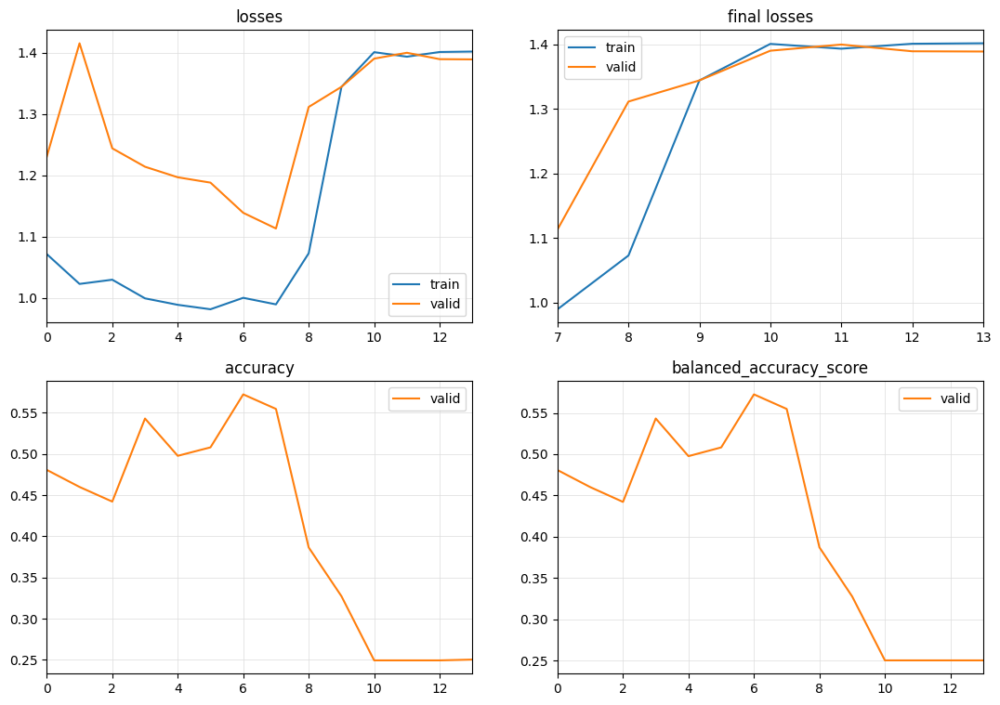

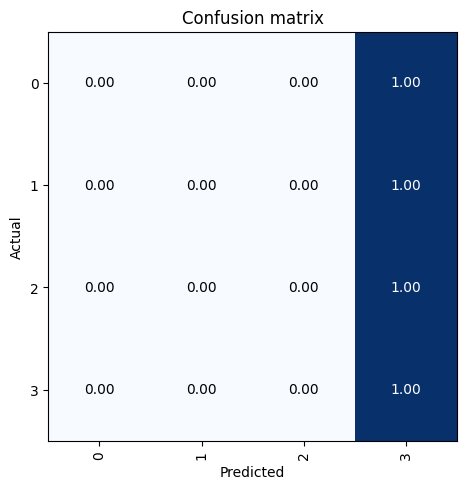

[I 2023-10-22 11:06:11,681] Trial 10 finished with value: 0.5723611116409302 and parameters: {'num_days': 14, 'sample_frac': 0.9, 'batch_size': 36, 'model': 'TST', 'd_model': 64, 'n_heads': 32, 'd_k': 16, 'd_v': 48, 'd_ff': 384, 'tst_dropout': 0.2, 'n_layers': 5, 'tst_fc_dropout': 0.0, 'store_attn': True, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -2, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}. Best is trial 8 with value: 0.5762500166893005.


{'num_days': 70, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'TST', 'd_model': 256, 'n_heads': 32, 'd_k': 16, 'd_v': 48, 'd_ff': 384, 'tst_dropout': 0.6000000000000001, 'n_layers': 7, 'tst_fc_dropout': 0.6000000000000001, 'store_attn': False, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-10-22 11:09:04,952] Trial 11 finished with value: 0.0 and parameters: {'num_days': 70, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'TST', 'd_model': 256, 'n_heads': 32, 'd_k': 16, 'd_v': 48, 'd_ff': 384, 'tst_dropout': 0.6000000000000001, 'n_layers': 7, 'tst_fc_dropout': 0.6000000000000001, 'store_attn': False, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}. Best is trial 8 with value: 0.5762500166893005.


Runtime error CUDA out of memory. Tried to allocate 2.12 GiB (GPU 0; 11.00 GiB total capacity; 8.31 GiB already allocated; 0 bytes free; 8.40 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
{'num_days': 14, 'sample_frac': 0.4, 'batch_size': 36, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.6000000000000001, 'TSiTPlus_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -3, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.161170,1.223893,0.459375,0.462145,00:23
1,1.131159,1.197166,0.467813,0.471388,00:24
2,1.097346,1.149257,0.491562,0.494251,00:26
3,1.040448,1.130175,0.509375,0.512658,00:24
4,1.010983,1.114063,0.549375,0.548929,00:28
5,0.963776,1.121963,0.550313,0.552001,00:29
6,0.950843,1.156765,0.534688,0.537184,00:25
7,0.937982,1.094099,0.543125,0.544990,00:24
8,0.902147,1.184423,0.513750,0.514974,00:23
9,0.882383,1.114406,0.570000,0.571373,00:23


No improvement since epoch 10: early stopping


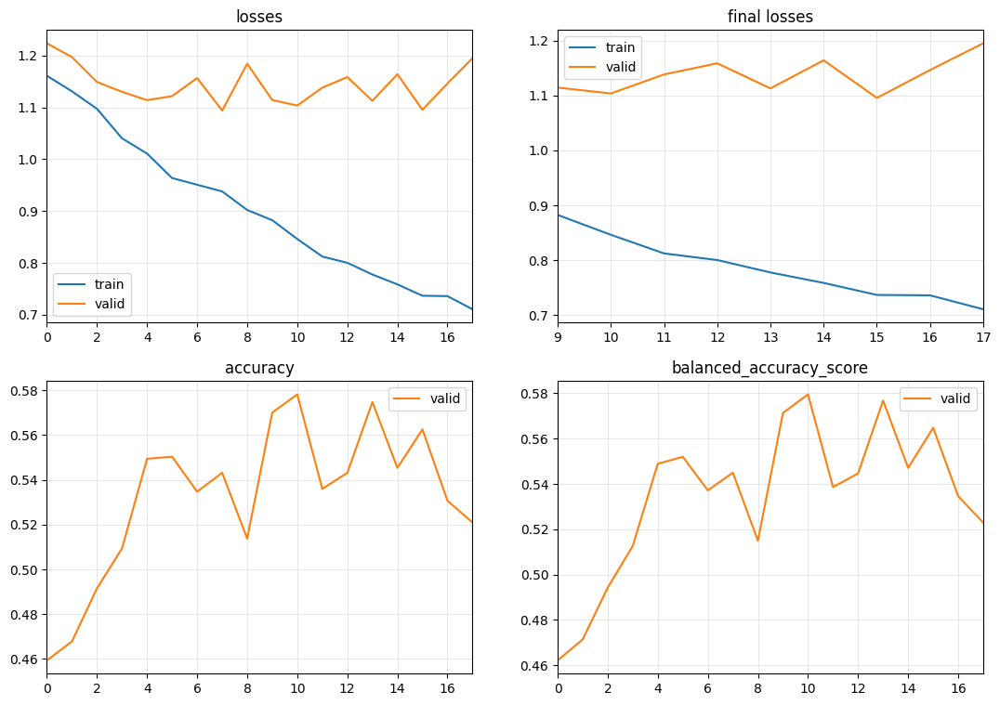

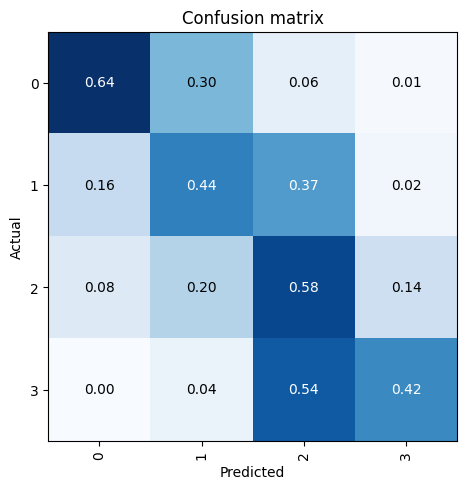

[I 2023-10-22 11:17:08,780] Trial 12 finished with value: 0.578125 and parameters: {'num_days': 14, 'sample_frac': 0.4, 'batch_size': 36, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.6000000000000001, 'TSiTPlus_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -3, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 70, 'sample_frac': 0.5, 'batch_size': 100, 'model': 'XceptionTimePlus', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -2, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.298904,1.303872,0.395500,0.394105,00:21
1,1.268628,1.276263,0.431250,0.433239,00:22
2,1.236419,1.309262,0.388000,0.385168,00:21
3,1.210852,1.266945,0.442750,0.443961,00:21
4,1.193239,1.228511,0.489250,0.488517,00:20
5,1.164279,1.210642,0.479500,0.474984,00:20
6,1.155327,1.168338,0.545000,0.542171,00:21
7,1.145221,1.325299,0.348000,0.349846,00:20
8,1.124451,1.309294,0.370750,0.375651,00:20
9,1.101225,1.222996,0.517750,0.516613,00:20


No improvement since epoch 6: early stopping


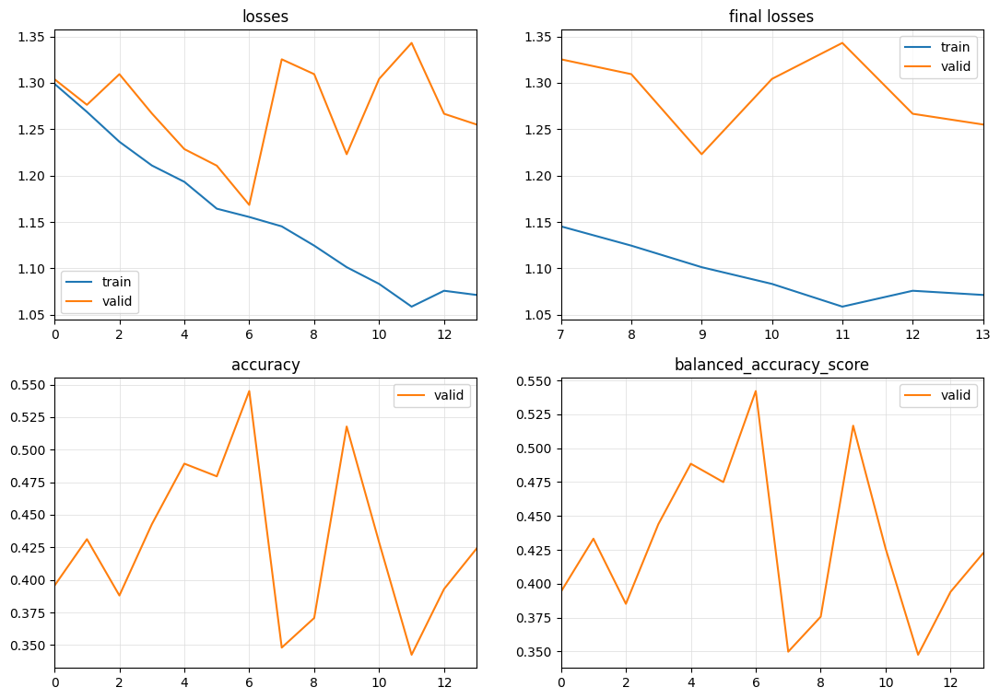

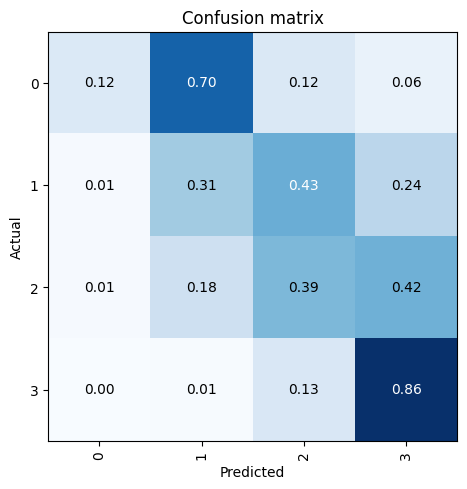

[I 2023-10-22 11:22:25,522] Trial 13 finished with value: 0.5450000166893005 and parameters: {'num_days': 70, 'sample_frac': 0.5, 'batch_size': 100, 'model': 'XceptionTimePlus', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -2, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 28, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'LSTM', 'hidden_size': 100, 'lstm_n_layers': 5, 'rnn_dropout': 0.0, 'bidirectional': True, 'lstm_fc_dropout': 0.8, 'lstm_cell_type': 'GRU', 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -3, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.297930,1.191608,0.471406,0.468887,00:25
1,1.278569,1.157212,0.522969,0.520891,00:25
2,1.263767,1.127428,0.549062,0.547502,00:25
3,1.252411,1.120215,0.542813,0.541085,00:25
4,1.236448,1.102256,0.546719,0.546118,00:25
5,1.247461,1.100045,0.550937,0.549915,00:25
6,1.236370,1.107481,0.564687,0.564334,00:25
7,1.217870,1.086665,0.549531,0.547930,00:25
8,1.221682,1.082186,0.567344,0.565921,00:25
9,1.207086,1.084527,0.576406,0.576252,00:25


No improvement since epoch 9: early stopping


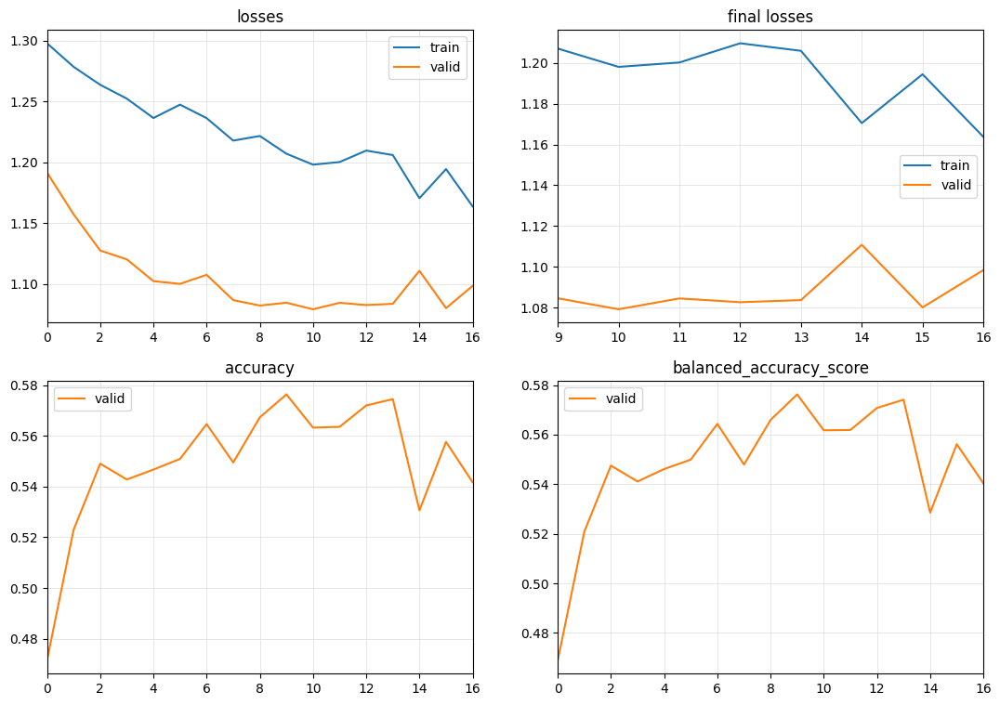

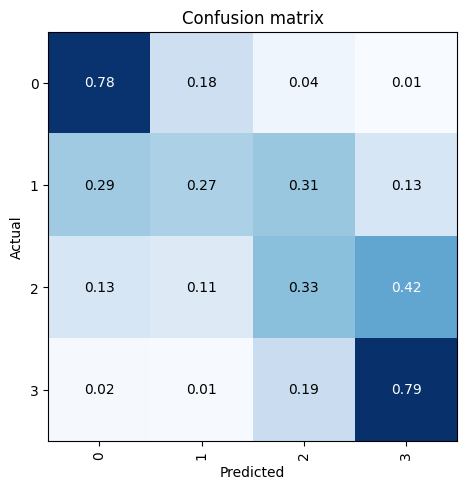

[I 2023-10-22 11:29:58,838] Trial 14 finished with value: 0.5764062404632568 and parameters: {'num_days': 28, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'LSTM', 'hidden_size': 100, 'lstm_n_layers': 5, 'rnn_dropout': 0.0, 'bidirectional': True, 'lstm_fc_dropout': 0.8, 'lstm_cell_type': 'GRU', 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -3, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 56, 'sample_frac': 0.1, 'batch_size': 68, 'model': 'XCM', 'window_perc': 1.0, 'xcm_nf': 256, 'xcm_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-10-22 11:30:19,719] Trial 15 finished with value: 0.0 and parameters: {'num_days': 56, 'sample_frac': 0.1, 'batch_size': 68, 'model': 'XCM', 'window_perc': 1.0, 'xcm_nf': 256, 'xcm_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


Runtime error CUDA out of memory. Tried to allocate 2.38 GiB (GPU 0; 11.00 GiB total capacity; 7.35 GiB already allocated; 0 bytes free; 9.68 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
{'num_days': 7, 'sample_frac': 0.2, 'batch_size': 36, 'model': 'OmniScaleCNN', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.418662,1.425282,0.235625,0.235093,00:07
1,1.387678,1.377611,0.315625,0.314967,00:06
2,1.364910,1.337429,0.378750,0.378140,00:07
3,1.340688,1.301466,0.410625,0.409598,00:06
4,1.321441,1.268393,0.433750,0.432562,00:06
5,1.297043,1.240790,0.446875,0.445583,00:06
6,1.281993,1.215528,0.456250,0.454818,00:06
7,1.261503,1.195757,0.461875,0.460499,00:06
8,1.250420,1.181440,0.468750,0.467105,00:07
9,1.247298,1.168196,0.479375,0.478025,00:06


No improvement since epoch 30: early stopping


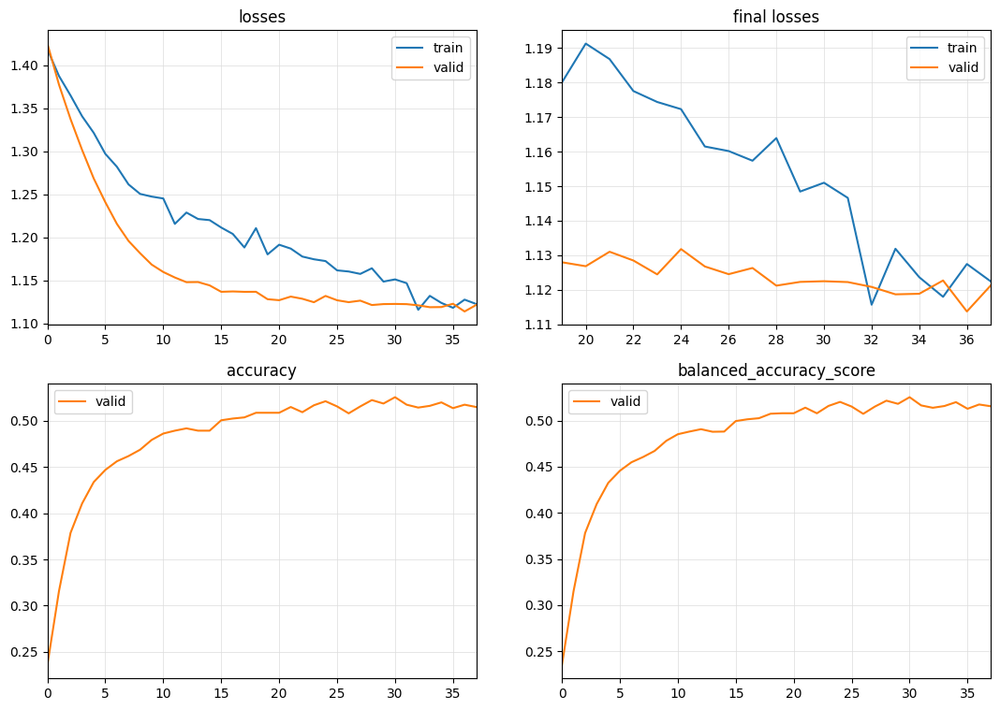

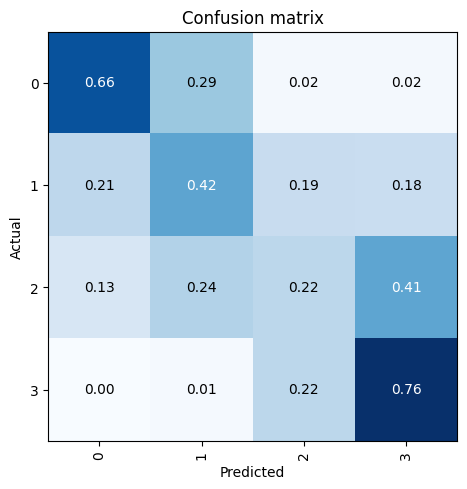

[I 2023-10-22 11:35:05,370] Trial 16 finished with value: 0.5256249904632568 and parameters: {'num_days': 7, 'sample_frac': 0.2, 'batch_size': 36, 'model': 'OmniScaleCNN', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 42, 'sample_frac': 0.1, 'batch_size': 4, 'model': 'OmniScaleCNN', 'loss_func': 'None', 'learning_rate': -2, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.389576,1.693827,0.355000,0.377423,00:24
1,0.902007,1.418102,0.425000,0.430738,00:24
2,0.922368,1.130047,0.515000,0.501786,00:23
3,0.943674,1.293378,0.496250,0.493994,00:24
4,0.895575,1.656389,0.475000,0.467813,00:24
5,0.951563,1.283336,0.478750,0.469905,00:24
6,0.979865,1.503467,0.462500,0.454889,00:24
7,1.306555,1.808565,0.417500,0.416347,00:24
8,1.246169,1.589194,0.370000,0.380386,00:24
9,1.835677,1.343590,0.386250,0.391292,00:24


No improvement since epoch 2: early stopping


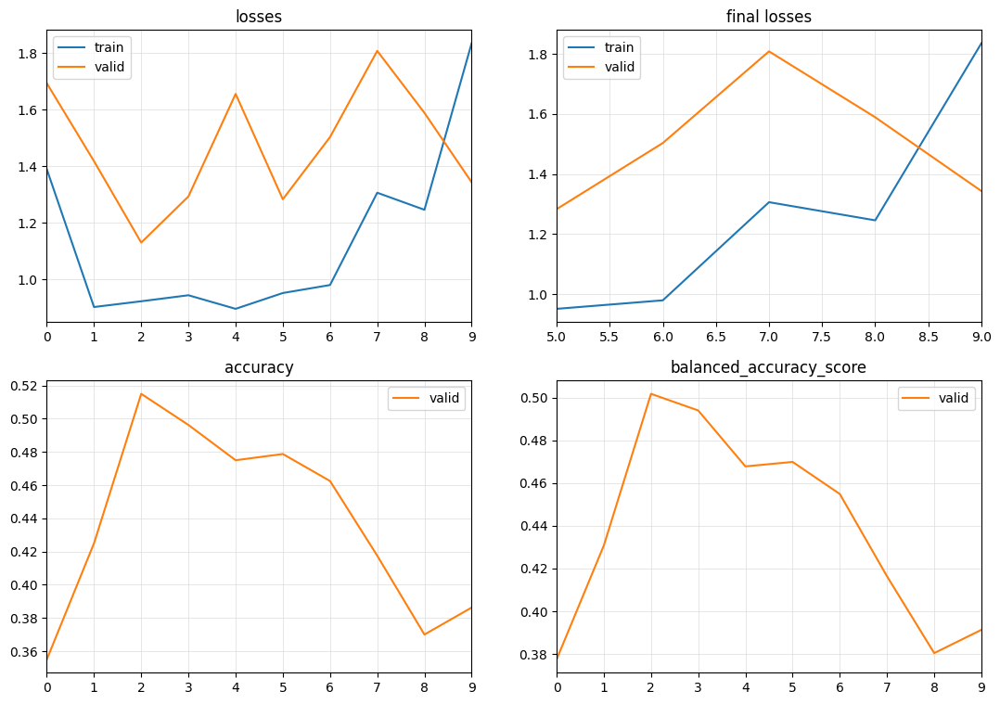

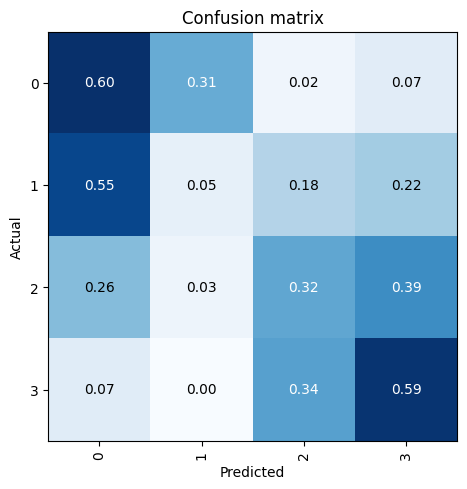

[I 2023-10-22 11:39:29,048] Trial 17 finished with value: 0.5149999856948853 and parameters: {'num_days': 42, 'sample_frac': 0.1, 'batch_size': 4, 'model': 'OmniScaleCNN', 'loss_func': 'None', 'learning_rate': -2, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 77, 'sample_frac': 0.2, 'batch_size': 4, 'model': 'LSTM', 'hidden_size': 150, 'lstm_n_layers': 7, 'rnn_dropout': 0.2, 'bidirectional': False, 'lstm_fc_dropout': 0.2, 'lstm_cell_type': 'RNN', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -2, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.417451,1.406961,0.229375,0.250000,00:42
1,1.402522,1.413838,0.229375,0.250000,00:42
2,1.404223,1.394468,0.260625,0.250000,00:42
3,1.404790,1.407796,0.229375,0.250000,00:42
4,1.395318,1.426014,0.233125,0.250000,00:42
5,1.432723,1.394212,0.229375,0.250000,00:42
6,1.402490,1.395269,0.260625,0.250000,00:42
7,1.442578,1.404392,0.276875,0.250000,00:42
8,1.415576,1.465263,0.276875,0.250000,00:41
9,1.428670,1.422673,0.233125,0.250000,00:41


No improvement since epoch 7: early stopping


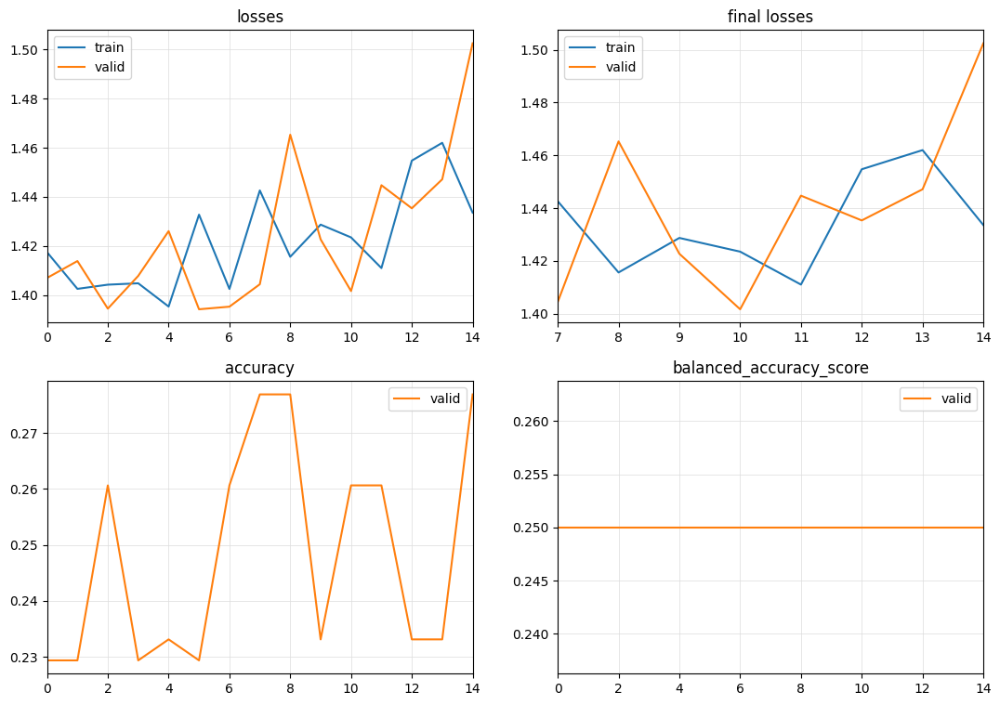

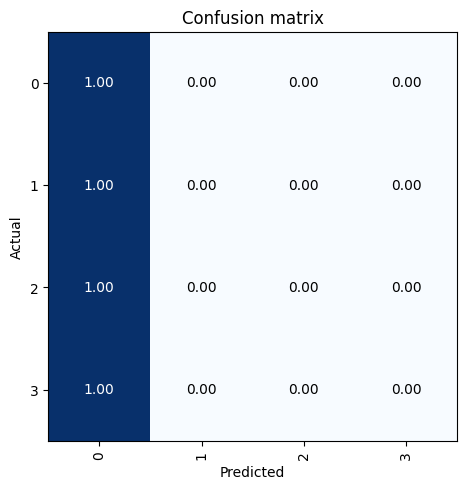

[I 2023-10-22 11:50:29,334] Trial 18 finished with value: 0.27687498927116394 and parameters: {'num_days': 77, 'sample_frac': 0.2, 'batch_size': 4, 'model': 'LSTM', 'hidden_size': 150, 'lstm_n_layers': 7, 'rnn_dropout': 0.2, 'bidirectional': False, 'lstm_fc_dropout': 0.2, 'lstm_cell_type': 'RNN', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -2, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 49, 'sample_frac': 0.6, 'batch_size': 36, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.0, 'TSiTPlus_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -3, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.286329,1.320349,0.360208,0.362363,02:45
1,1.255430,1.333850,0.388750,0.390665,02:43
2,1.228655,1.331765,0.403542,0.405992,02:39
3,1.231435,1.406955,0.388125,0.389929,02:39
4,1.200194,1.432648,0.419583,0.421087,02:38
5,1.139732,1.543604,0.429375,0.430337,02:38
6,1.052011,1.423362,0.440833,0.441311,02:39
7,1.011394,1.383694,0.456875,0.456667,02:52
8,0.997089,1.294710,0.463750,0.464572,02:46
9,0.964033,1.210427,0.509375,0.509674,02:41


No improvement since epoch 20: early stopping


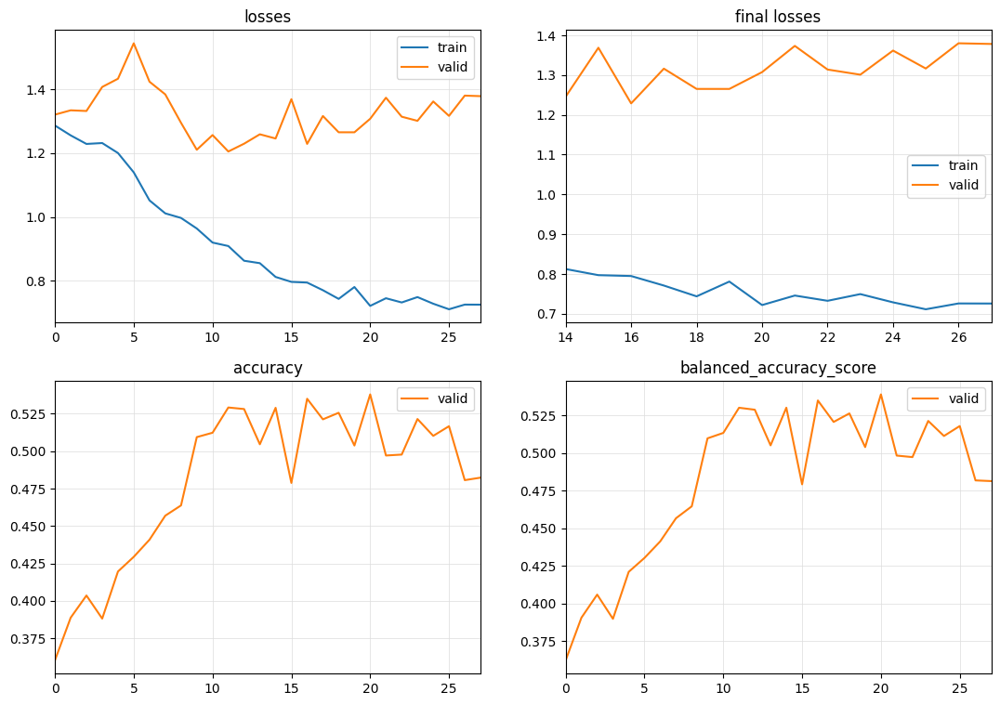

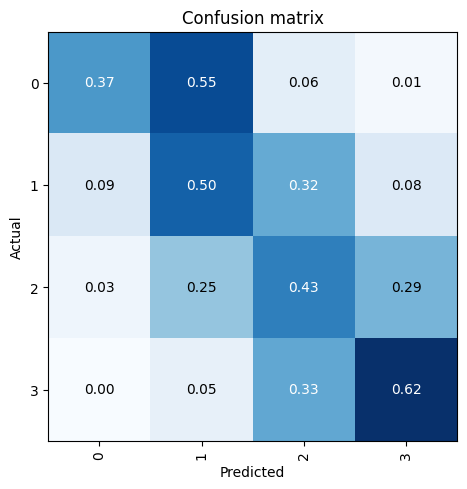

[I 2023-10-22 13:05:56,823] Trial 19 finished with value: 0.5379166603088379 and parameters: {'num_days': 49, 'sample_frac': 0.6, 'batch_size': 36, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.0, 'TSiTPlus_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -3, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 84, 'sample_frac': 0.5, 'batch_size': 100, 'model': 'FCN', 'fcn_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.433007,1.406588,0.283750,0.283220,00:11
1,1.429828,1.398852,0.297000,0.296264,00:11
2,1.424475,1.391419,0.291000,0.290133,00:10
3,1.421702,1.384986,0.337750,0.337126,00:09
4,1.417258,1.378176,0.345000,0.344604,00:09
5,1.408089,1.370945,0.332250,0.331963,00:10
6,1.405096,1.364293,0.328750,0.328509,00:09
7,1.394942,1.357479,0.332250,0.331994,00:09
8,1.387853,1.349888,0.334250,0.333993,00:09
9,1.381978,1.343392,0.332750,0.332513,00:10


No improvement since epoch 4: early stopping


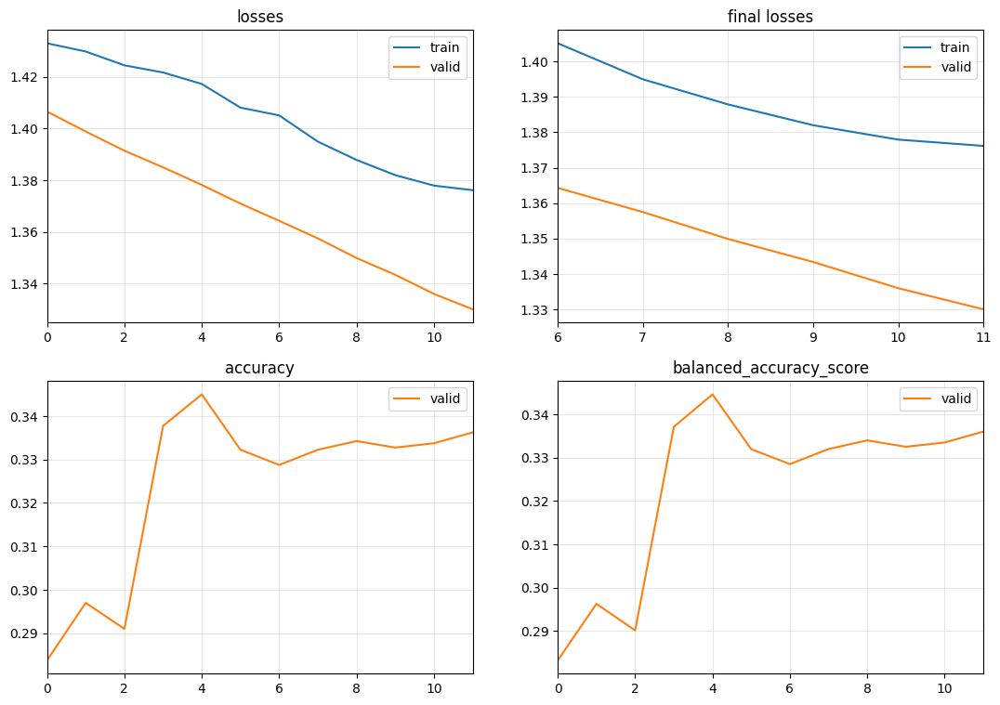

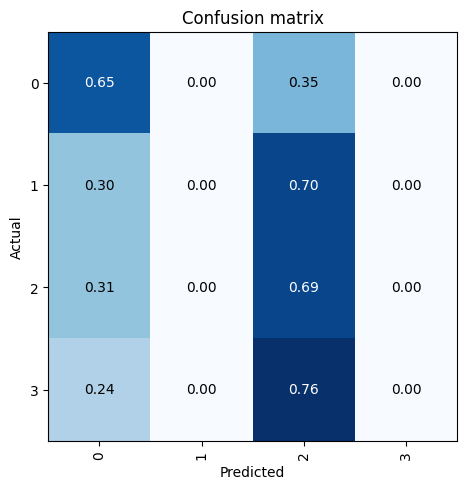

[I 2023-10-22 13:08:21,234] Trial 20 finished with value: 0.3449999988079071 and parameters: {'num_days': 84, 'sample_frac': 0.5, 'batch_size': 100, 'model': 'FCN', 'fcn_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 35, 'sample_frac': 0.1, 'batch_size': 68, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.0, 'TSiTPlus_dropout': 0.4, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.439860,1.539596,0.272500,0.253968,00:13
1,1.399279,1.591798,0.255000,0.267442,00:13
2,1.386456,1.583287,0.262500,0.274419,00:13
3,1.383198,1.573414,0.267500,0.279070,00:13
4,1.380215,1.580393,0.267500,0.279070,00:13
5,1.377763,1.566925,0.268750,0.280233,00:13
6,1.374115,1.543972,0.272500,0.283721,00:13
7,1.370184,1.549084,0.285000,0.295349,00:13
8,1.364974,1.539444,0.341250,0.347514,00:13
9,1.360403,1.528281,0.327500,0.334884,00:13


No improvement since epoch 24: early stopping


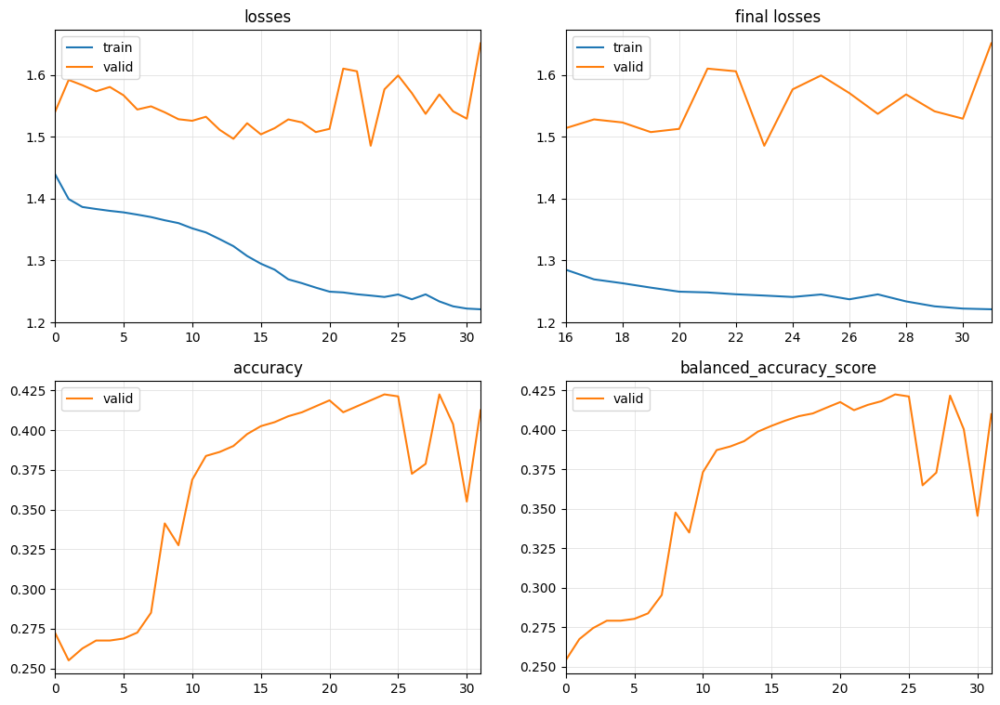

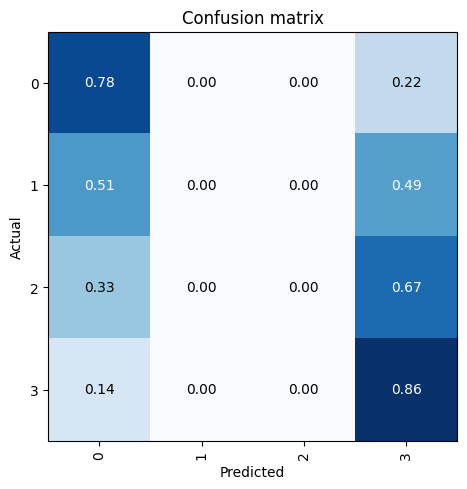

[I 2023-10-22 13:16:12,167] Trial 21 finished with value: 0.42250001430511475 and parameters: {'num_days': 35, 'sample_frac': 0.1, 'batch_size': 68, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.0, 'TSiTPlus_dropout': 0.4, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 21, 'sample_frac': 0.6, 'batch_size': 4, 'model': 'LSTM', 'hidden_size': 100, 'lstm_n_layers': 7, 'rnn_dropout': 0.4, 'bidirectional': False, 'lstm_fc_dropout': 0.4, 'lstm_cell_type': 'LSTM', 'loss_func': 'None', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.387526,1.385796,0.250208,0.250000,01:45
1,1.385547,1.382805,0.250208,0.250000,01:45
2,1.379405,1.371766,0.337917,0.334455,01:45
3,1.334895,1.305041,0.457083,0.448786,01:45
4,1.304761,1.216885,0.452292,0.444136,01:45
5,1.291628,1.188905,0.458750,0.450608,01:46
6,1.251959,1.179242,0.459583,0.451783,01:46
7,1.296700,1.164099,0.469792,0.462020,01:46
8,1.226206,1.148033,0.483958,0.476502,01:46
9,1.231188,1.139336,0.483750,0.476789,01:46


No improvement since epoch 18: early stopping


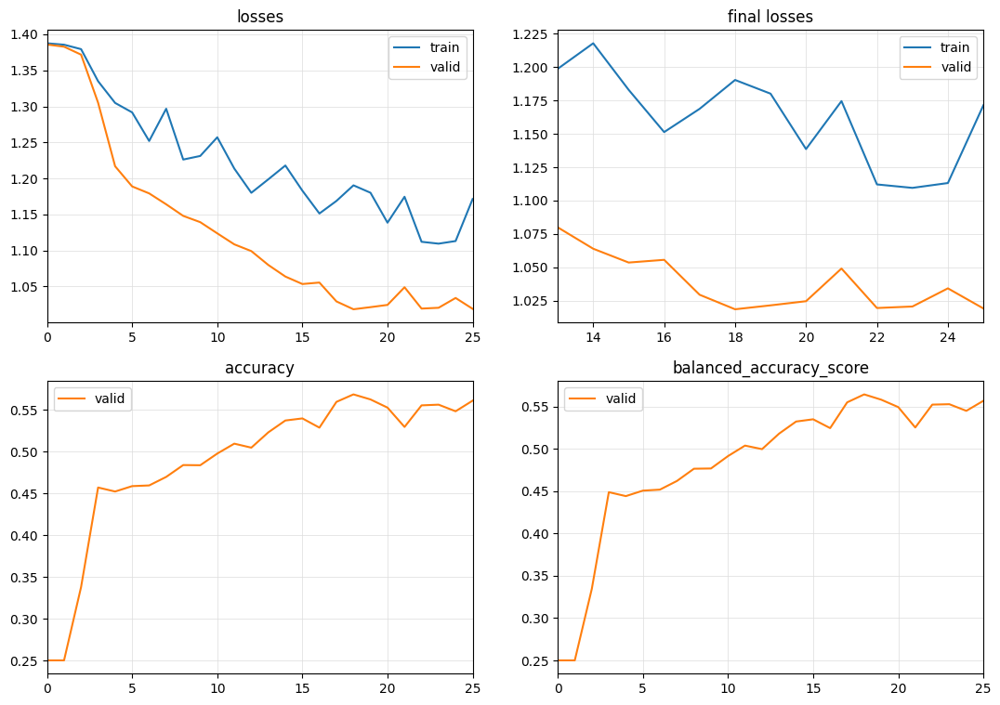

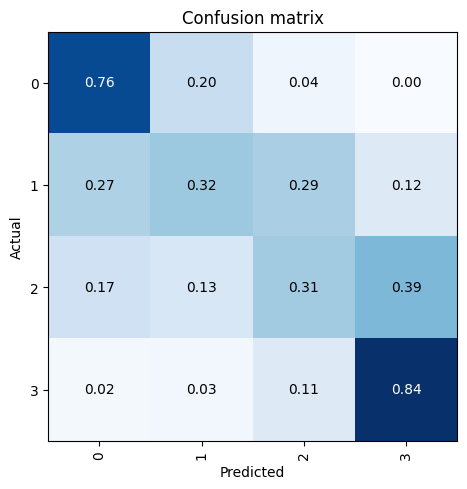

[I 2023-10-22 14:03:00,305] Trial 22 finished with value: 0.5685416460037231 and parameters: {'num_days': 21, 'sample_frac': 0.6, 'batch_size': 4, 'model': 'LSTM', 'hidden_size': 100, 'lstm_n_layers': 7, 'rnn_dropout': 0.4, 'bidirectional': False, 'lstm_fc_dropout': 0.4, 'lstm_cell_type': 'LSTM', 'loss_func': 'None', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 35, 'sample_frac': 0.6, 'batch_size': 68, 'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_dropout_rate': 0.8, 'itp_fc_dropout_rate': 0.8, 'itp_ks': 20, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.561280,1.385842,0.248958,0.250000,00:33
1,1.518216,1.386135,0.248958,0.250000,00:33
2,1.484303,1.386359,0.248958,0.250000,00:33
3,1.463634,1.386227,0.248958,0.250000,00:33
4,1.453878,1.385884,0.248958,0.250001,00:33
5,1.441372,1.385160,0.252917,0.253985,00:33
6,1.442236,1.385142,0.257708,0.258836,00:33
7,1.433566,1.385286,0.261042,0.262259,00:33
8,1.420972,1.384699,0.247292,0.248613,00:33
9,1.413145,1.382223,0.276458,0.278005,00:33


No improvement since epoch 15: early stopping


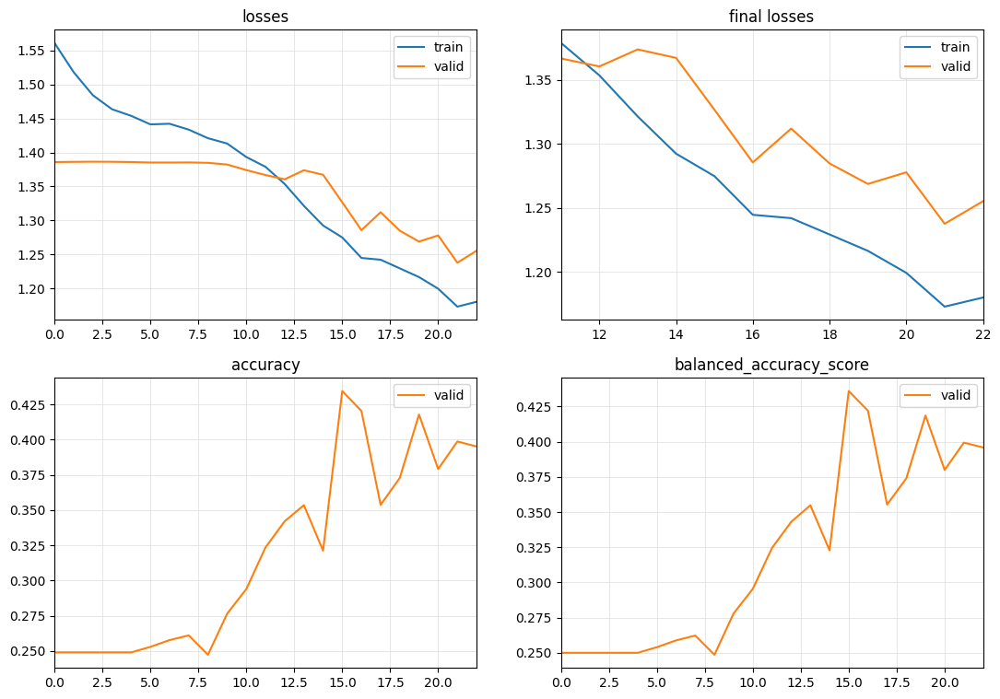

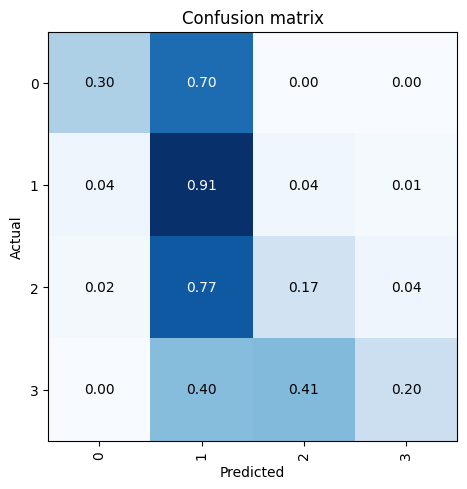

[I 2023-10-22 14:16:59,902] Trial 23 finished with value: 0.4345833361148834 and parameters: {'num_days': 35, 'sample_frac': 0.6, 'batch_size': 68, 'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_dropout_rate': 0.8, 'itp_fc_dropout_rate': 0.8, 'itp_ks': 20, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 14, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'XceptionTimePlus', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.406494,1.407920,0.247969,0.247982,00:19
1,1.382453,1.369465,0.319844,0.319796,00:19
2,1.357694,1.338041,0.357344,0.357184,00:19
3,1.342938,1.311779,0.382969,0.382673,00:19
4,1.330694,1.292644,0.400000,0.399673,00:18
5,1.317454,1.283620,0.410313,0.409980,00:18
6,1.311795,1.265785,0.418594,0.418184,00:18
7,1.296580,1.261305,0.425938,0.425486,00:18
8,1.290445,1.253568,0.428750,0.428295,00:18
9,1.289144,1.248961,0.428438,0.428058,00:18


No improvement since epoch 60: early stopping


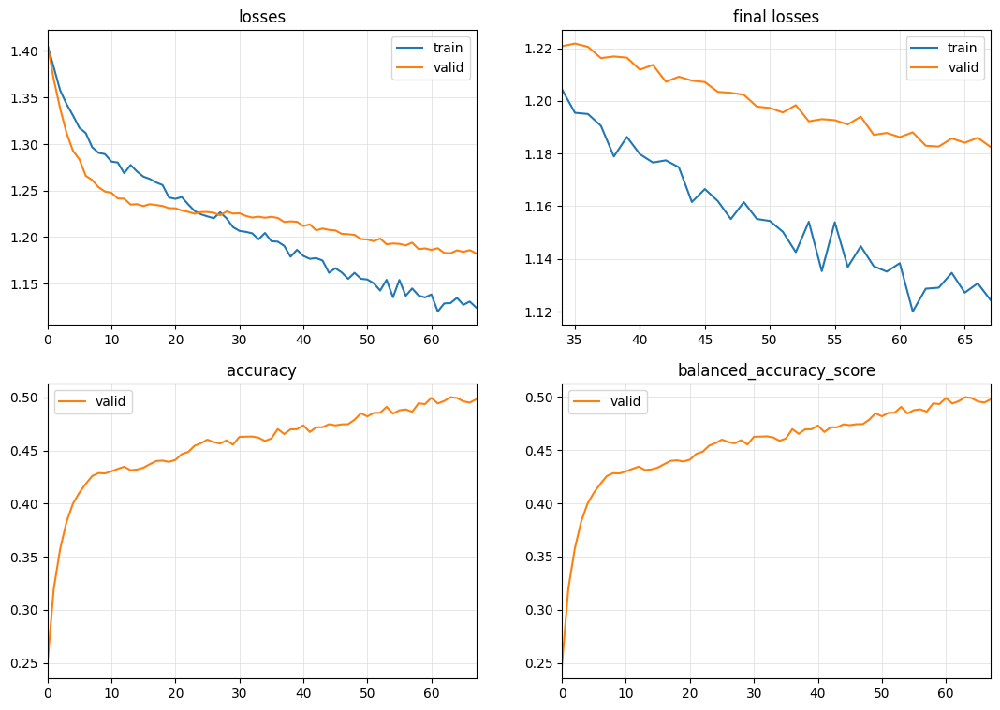

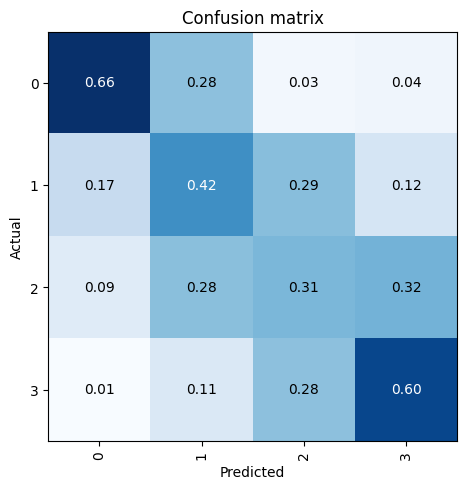

[I 2023-10-22 14:39:05,800] Trial 24 finished with value: 0.5001562237739563 and parameters: {'num_days': 14, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'XceptionTimePlus', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 84, 'sample_frac': 0.5, 'batch_size': 36, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.8, 'TSiTPlus_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -3, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.354897,1.302248,0.398000,0.393666,11:17
1,1.347166,1.305191,0.408750,0.404027,11:01
2,1.331397,1.318889,0.409500,0.406450,11:01
3,1.337738,1.289972,0.403750,0.398976,11:21
4,1.333594,1.307176,0.401000,0.396253,11:25
5,1.318700,1.355755,0.395750,0.390721,11:23
6,1.315288,1.341323,0.384750,0.379883,11:23
7,1.296241,1.303731,0.387250,0.382334,11:24
8,1.271775,1.303735,0.429000,0.424125,11:35
9,1.231226,1.205277,0.474500,0.468149,06:54


No improvement since epoch 16: early stopping


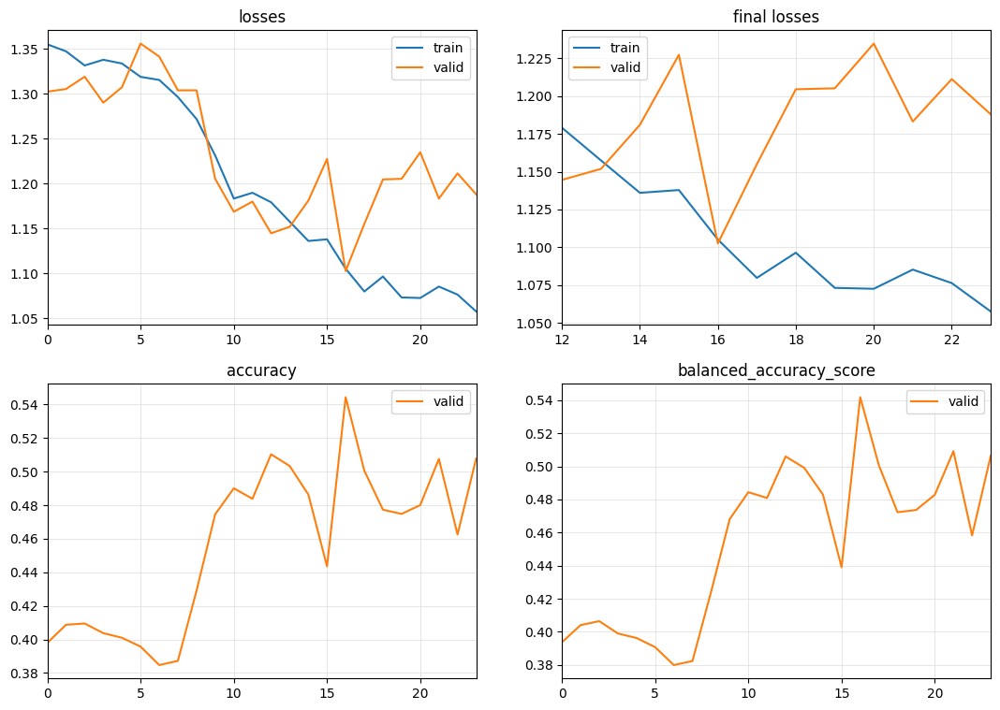

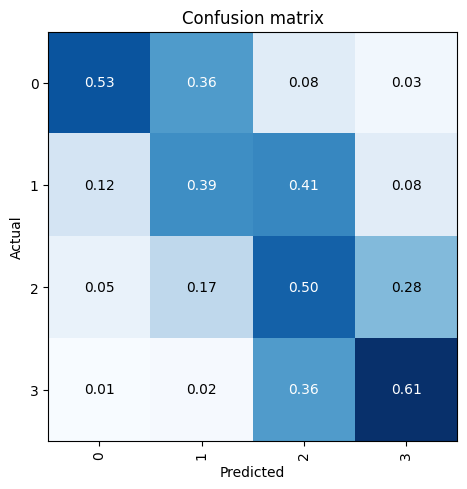

[I 2023-10-22 18:01:04,864] Trial 25 finished with value: 0.5442500114440918 and parameters: {'num_days': 84, 'sample_frac': 0.5, 'batch_size': 36, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.8, 'TSiTPlus_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -3, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 42, 'sample_frac': 0.1, 'batch_size': 36, 'model': 'XCM', 'window_perc': 0.2, 'xcm_nf': 128, 'xcm_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.337834,1.310128,0.401250,0.409455,00:08
1,1.256342,1.268005,0.403750,0.410306,00:08
2,1.209119,1.243971,0.428750,0.433793,00:08
3,1.168435,1.214628,0.445000,0.450765,00:08
4,1.146482,1.206810,0.468750,0.475466,00:08
5,1.118820,1.187245,0.461250,0.469100,00:08
6,1.109104,1.242905,0.426250,0.433084,00:08
7,1.084015,1.157783,0.495000,0.501370,00:08
8,1.076732,1.215376,0.437500,0.444859,00:08
9,1.065055,1.156257,0.491250,0.495295,00:08


No improvement since epoch 13: early stopping


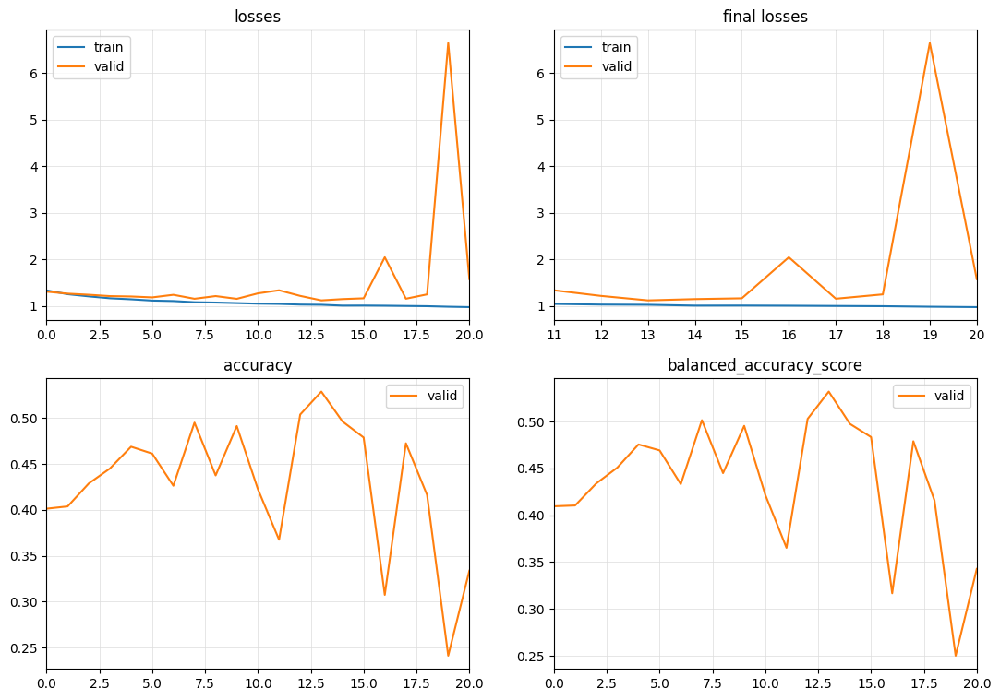

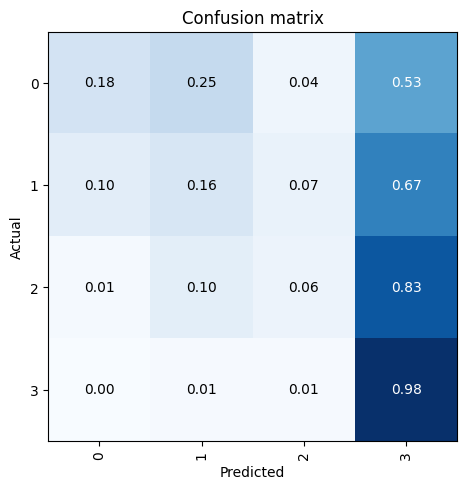

[I 2023-10-22 18:04:28,444] Trial 26 finished with value: 0.5287500023841858 and parameters: {'num_days': 42, 'sample_frac': 0.1, 'batch_size': 36, 'model': 'XCM', 'window_perc': 0.2, 'xcm_nf': 128, 'xcm_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 14, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'XCM', 'window_perc': 0.2, 'xcm_nf': 192, 'xcm_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.252264,1.218234,0.460156,0.459865,00:30
1,1.171739,1.151989,0.492031,0.491739,00:30
2,1.119618,1.124517,0.532656,0.532519,00:30
3,1.091031,1.105732,0.538125,0.537963,00:33
4,1.057058,1.216591,0.480000,0.480257,00:31
5,1.029996,1.092822,0.550469,0.550386,00:31
6,1.001150,1.237565,0.444063,0.444543,00:31
7,0.982689,1.089934,0.542813,0.542755,00:31
8,0.964923,1.111614,0.521563,0.521275,00:31
9,0.949424,1.326464,0.437031,0.437635,00:31


No improvement since epoch 5: early stopping


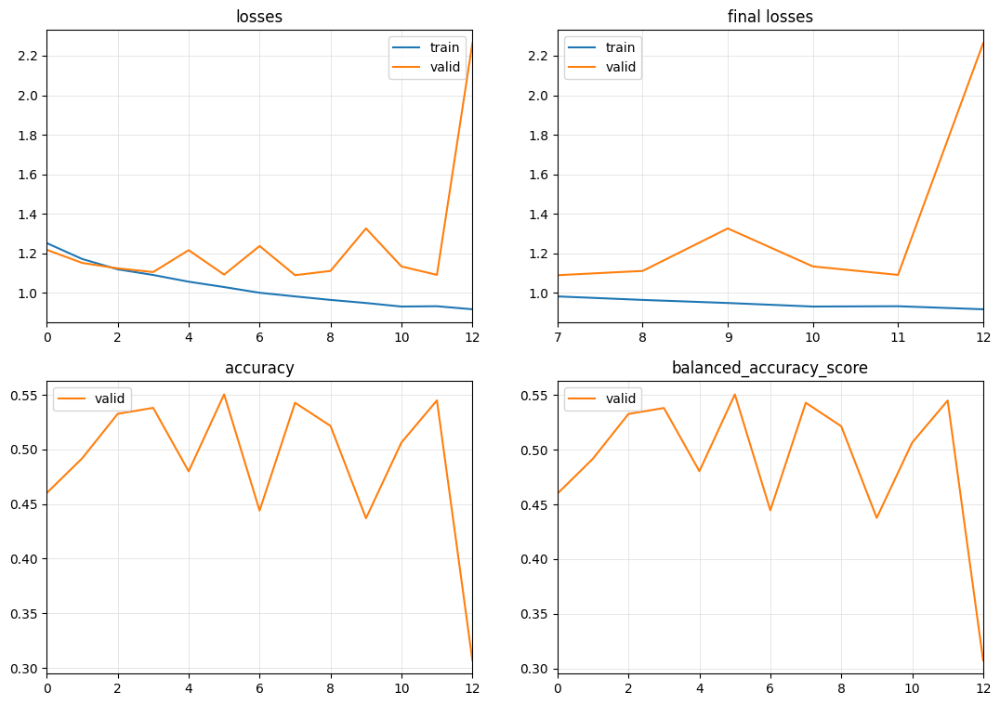

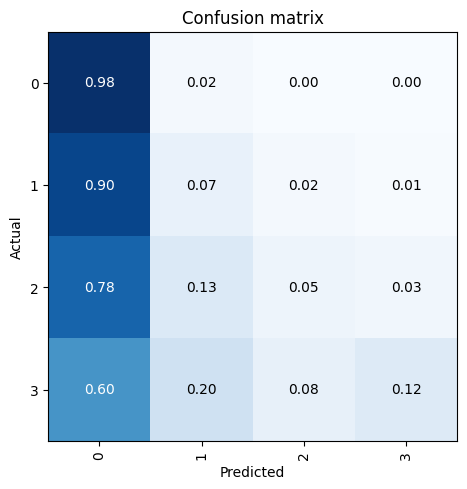

[I 2023-10-22 18:11:43,287] Trial 27 finished with value: 0.5504687428474426 and parameters: {'num_days': 14, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'XCM', 'window_perc': 0.2, 'xcm_nf': 192, 'xcm_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 77, 'sample_frac': 0.5, 'batch_size': 4, 'model': 'LSTM_FCNPlus', 'lstm_fcn_hidden_size': 100, 'lstm_fcn_n_layers': 9, 'lstm_fcn_rnn_dropout': 0.6000000000000001, 'lstm_fcn_bidirectional': True, 'lstm_fcn_cell_dropout': 0.6000000000000001, 'lstm_fcn_cell_type': 'RNN', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -2, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.336959,1.404470,0.285000,0.283322,02:19
1,1.280642,1.420573,0.394000,0.393749,02:18
2,1.302078,1.336989,0.338250,0.335060,02:19
3,1.307454,1.414754,0.404250,0.403422,02:19
4,1.296511,1.333111,0.317000,0.315899,02:19
5,1.289124,1.373373,0.400750,0.400387,02:19
6,1.324095,1.314170,0.406250,0.405965,02:19
7,1.272585,1.436227,0.385750,0.385835,02:18
8,1.312488,5.401489,0.249250,0.250246,02:18
9,1.283107,1.490440,0.402750,0.402661,02:19


No improvement since epoch 6: early stopping


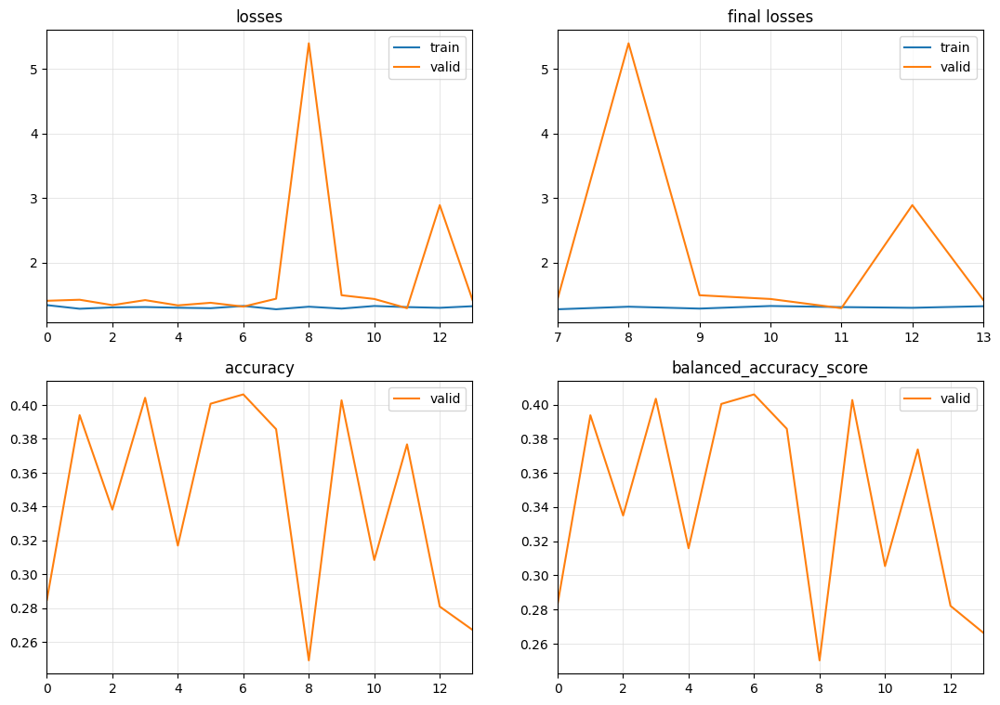

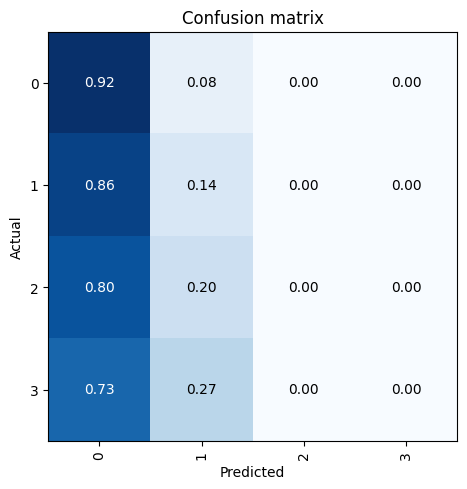

[I 2023-10-22 18:44:55,568] Trial 28 finished with value: 0.40625 and parameters: {'num_days': 77, 'sample_frac': 0.5, 'batch_size': 4, 'model': 'LSTM_FCNPlus', 'lstm_fcn_hidden_size': 100, 'lstm_fcn_n_layers': 9, 'lstm_fcn_rnn_dropout': 0.6000000000000001, 'lstm_fcn_bidirectional': True, 'lstm_fcn_cell_dropout': 0.6000000000000001, 'lstm_fcn_cell_type': 'RNN', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -2, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 70, 'sample_frac': 0.9, 'batch_size': 36, 'model': 'TST', 'd_model': 256, 'n_heads': 32, 'd_k': 48, 'd_v': 16, 'd_ff': 128, 'tst_dropout': 0.0, 'n_layers': 7, 'tst_fc_dropout': 0.8, 'store_attn': True, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -4, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-10-22 18:45:22,591] Trial 29 finished with value: 0.0 and parameters: {'num_days': 70, 'sample_frac': 0.9, 'batch_size': 36, 'model': 'TST', 'd_model': 256, 'n_heads': 32, 'd_k': 48, 'd_v': 16, 'd_ff': 128, 'tst_dropout': 0.0, 'n_layers': 7, 'tst_fc_dropout': 0.8, 'store_attn': True, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -4, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


Runtime error CUDA out of memory. Tried to allocate 1.12 GiB (GPU 0; 11.00 GiB total capacity; 8.60 GiB already allocated; 0 bytes free; 9.51 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
{'num_days': 56, 'sample_frac': 0.7000000000000001, 'batch_size': 100, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.8, 'TSiTPlus_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-10-22 18:45:47,787] Trial 30 finished with value: 0.0 and parameters: {'num_days': 56, 'sample_frac': 0.7000000000000001, 'batch_size': 100, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.8, 'TSiTPlus_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


Runtime error CUDA out of memory. Tried to allocate 1.20 GiB (GPU 0; 11.00 GiB total capacity; 9.69 GiB already allocated; 0 bytes free; 9.90 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
{'num_days': 21, 'sample_frac': 0.2, 'batch_size': 36, 'model': 'XCM', 'window_perc': 1.0, 'xcm_nf': 64, 'xcm_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -3, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.194426,1.175723,0.471250,0.481991,00:09
1,1.136574,1.236876,0.499375,0.513192,00:09
2,1.135775,1.203734,0.510000,0.524892,00:09
3,1.106793,1.470548,0.381875,0.395871,00:09
4,1.105335,1.293936,0.464375,0.477570,00:09
5,1.100801,1.159880,0.483750,0.491862,00:09
6,1.092854,1.441446,0.361875,0.375956,00:09
7,1.093157,2.587007,0.255000,0.269414,00:09
8,1.087447,1.266190,0.436250,0.449703,00:09
9,1.079839,2.476753,0.289375,0.305988,00:09


No improvement since epoch 2: early stopping


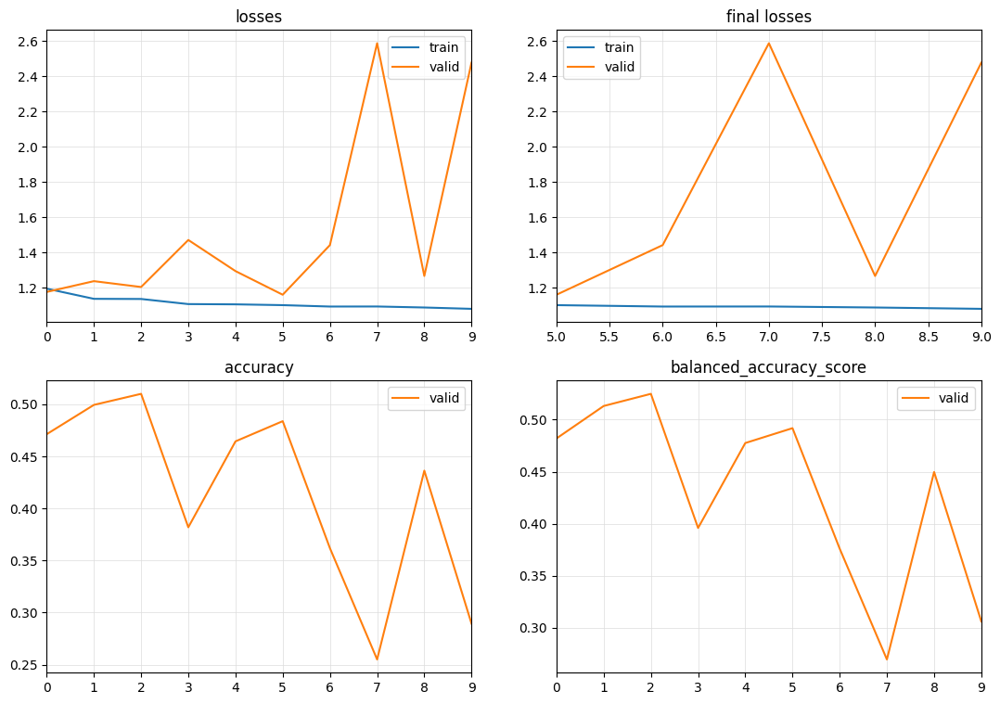

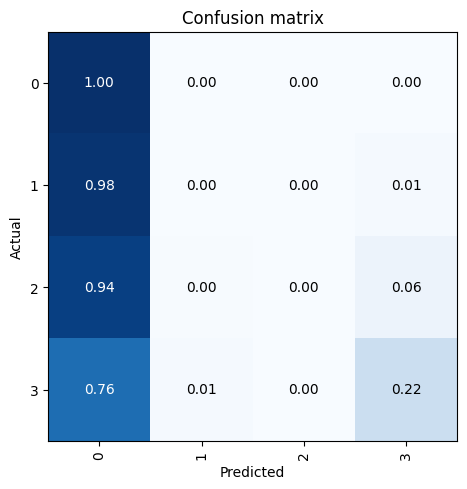

[I 2023-10-22 18:47:51,058] Trial 31 finished with value: 0.5099999904632568 and parameters: {'num_days': 21, 'sample_frac': 0.2, 'batch_size': 36, 'model': 'XCM', 'window_perc': 1.0, 'xcm_nf': 64, 'xcm_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -3, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 84, 'sample_frac': 0.5, 'batch_size': 100, 'model': 'TST', 'd_model': 128, 'n_heads': 1, 'd_k': 48, 'd_v': 48, 'd_ff': 128, 'tst_dropout': 0.6000000000000001, 'n_layers': 1, 'tst_fc_dropout': 0.8, 'store_attn': False, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.424540,1.378037,0.271000,0.272630,00:11
1,1.423951,1.372946,0.298750,0.300378,00:11
2,1.418873,1.367611,0.354750,0.356028,00:11
3,1.415829,1.362919,0.360500,0.361607,00:10
4,1.409641,1.357142,0.380750,0.382115,00:11
5,1.404621,1.351115,0.395750,0.396950,00:11
6,1.399717,1.343887,0.392000,0.392992,00:11
7,1.391246,1.335961,0.386750,0.387480,00:11
8,1.386185,1.328102,0.397750,0.398722,00:11
9,1.377724,1.319281,0.404500,0.405705,00:11


No improvement since epoch 30: early stopping


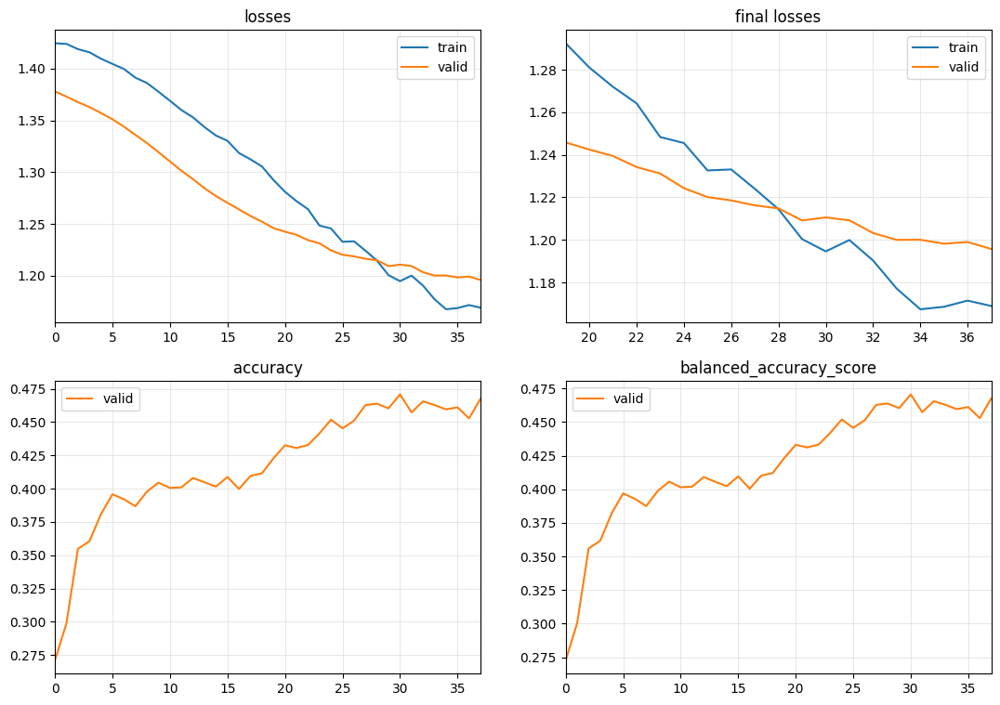

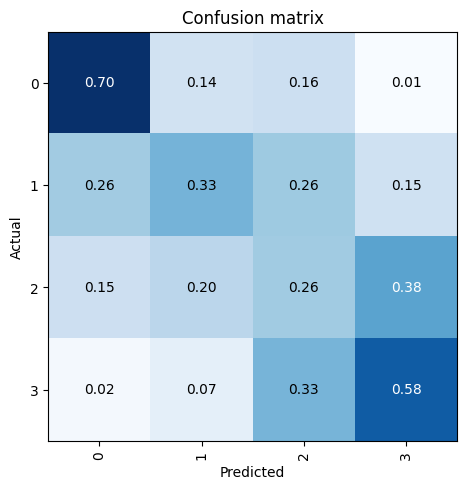

[I 2023-10-22 18:55:20,641] Trial 32 finished with value: 0.47075000405311584 and parameters: {'num_days': 84, 'sample_frac': 0.5, 'batch_size': 100, 'model': 'TST', 'd_model': 128, 'n_heads': 1, 'd_k': 48, 'd_v': 48, 'd_ff': 128, 'tst_dropout': 0.6000000000000001, 'n_layers': 1, 'tst_fc_dropout': 0.8, 'store_attn': False, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 84, 'sample_frac': 0.30000000000000004, 'batch_size': 36, 'model': 'FCN', 'fcn_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -2, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.248235,1.831671,0.336250,0.347757,00:07
1,1.235843,1.324855,0.375833,0.380490,00:07
2,1.219251,1.592036,0.351250,0.351427,00:07
3,1.216310,3.643616,0.248750,0.250000,00:07
4,1.215275,1.530116,0.355833,0.358884,00:07
5,1.213294,1.284229,0.422500,0.417591,00:07
6,1.231600,2.093942,0.265417,0.279276,00:07
7,1.231129,1.322471,0.405833,0.411146,00:07
8,1.230604,1.591206,0.330833,0.312033,00:07
9,1.248766,1.939030,0.319583,0.306799,00:07


No improvement since epoch 5: early stopping


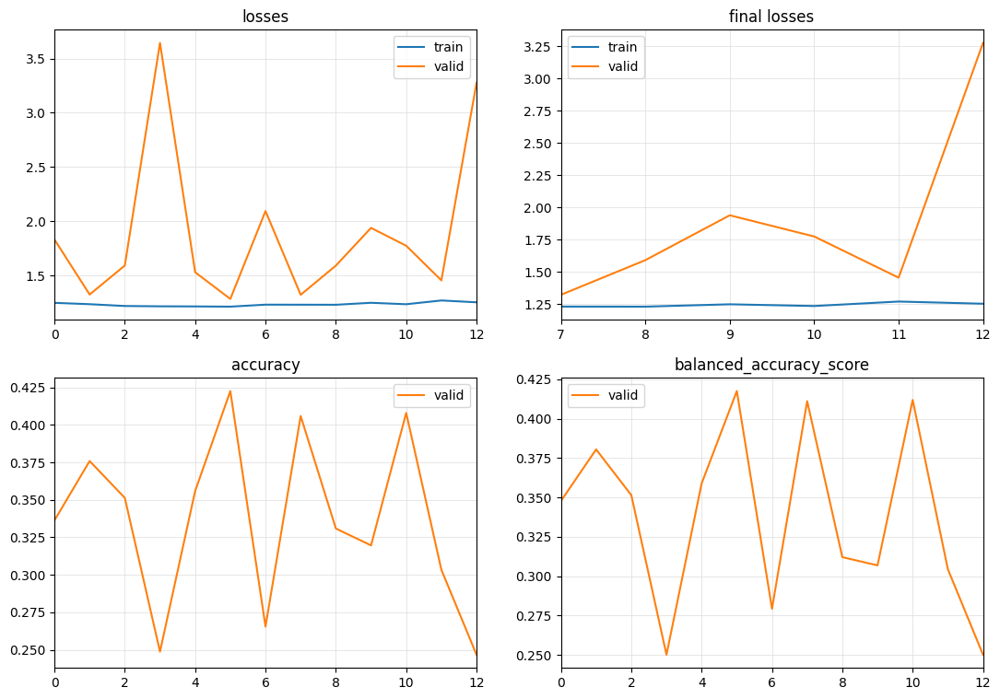

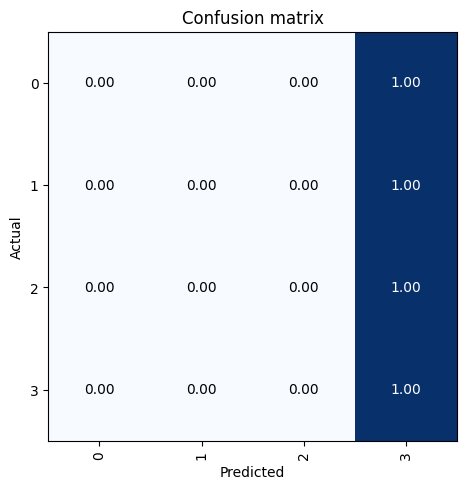

[I 2023-10-22 18:57:17,861] Trial 33 finished with value: 0.42250001430511475 and parameters: {'num_days': 84, 'sample_frac': 0.30000000000000004, 'batch_size': 36, 'model': 'FCN', 'fcn_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -2, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 63, 'sample_frac': 0.7000000000000001, 'batch_size': 36, 'model': 'TCN', 'TCN_fc_dropout': 0.6000000000000001, 'TCN_conv_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -3, 'learner_callback': 'None', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.386450,1.384444,0.275714,0.278926,00:28
1,1.375853,1.365754,0.349643,0.350954,00:28
2,1.330919,1.308371,0.358214,0.360141,00:28
3,1.318020,1.317577,0.337857,0.339305,00:28
4,1.308833,1.312552,0.359107,0.361212,00:28
5,1.298821,1.315367,0.384643,0.385728,00:28
6,1.296267,1.343691,0.339107,0.338694,00:28
7,1.291848,1.361262,0.286964,0.286935,00:28
8,1.281727,1.371199,0.364464,0.363792,00:28
9,1.269410,1.381468,0.362679,0.361941,00:27


No improvement since epoch 5: early stopping


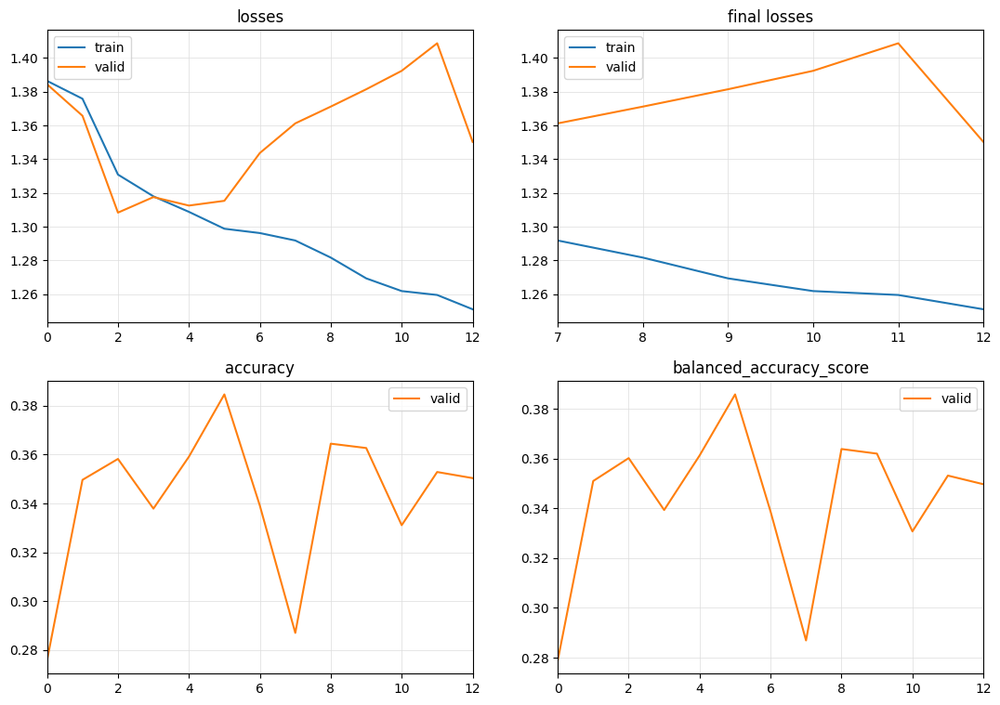

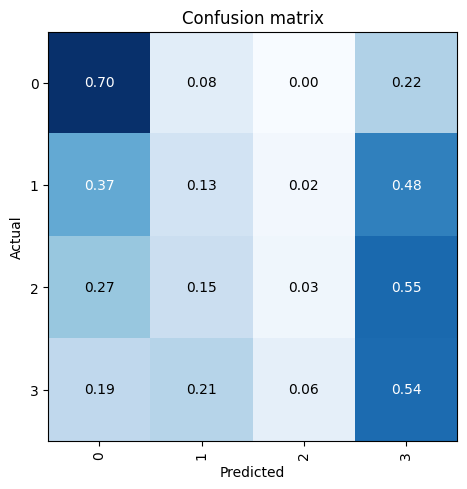

[I 2023-10-22 19:03:46,288] Trial 34 finished with value: 0.3846428692340851 and parameters: {'num_days': 63, 'sample_frac': 0.7000000000000001, 'batch_size': 36, 'model': 'TCN', 'TCN_fc_dropout': 0.6000000000000001, 'TCN_conv_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -3, 'learner_callback': 'None', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 77, 'sample_frac': 0.7000000000000001, 'batch_size': 100, 'model': 'XCM', 'window_perc': 0.4, 'xcm_nf': 128, 'xcm_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -5, 'learner_callback': 'None', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-10-22 19:04:06,349] Trial 35 finished with value: 0.0 and parameters: {'num_days': 77, 'sample_frac': 0.7000000000000001, 'batch_size': 100, 'model': 'XCM', 'window_perc': 0.4, 'xcm_nf': 128, 'xcm_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -5, 'learner_callback': 'None', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


Runtime error CUDA out of memory. Tried to allocate 2.41 GiB (GPU 0; 11.00 GiB total capacity; 7.41 GiB already allocated; 0 bytes free; 9.80 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
{'num_days': 7, 'sample_frac': 0.1, 'batch_size': 36, 'model': 'TCN', 'TCN_fc_dropout': 0.6000000000000001, 'TCN_conv_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -2, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.388254,1.380840,0.283750,0.295789,00:03
1,1.294105,1.281243,0.358750,0.358820,00:03
2,1.236130,1.176746,0.528750,0.534025,00:03
3,1.203840,1.119413,0.527500,0.530512,00:03
4,1.219230,1.172061,0.452500,0.457839,00:03
5,1.199446,1.142898,0.493750,0.500697,00:03
6,1.182256,1.117925,0.527500,0.531382,00:03
7,1.174617,1.129423,0.498750,0.504838,00:03
8,1.170549,1.119174,0.535000,0.540337,00:03
9,1.189896,1.145328,0.472500,0.479334,00:03


No improvement since epoch 8: early stopping


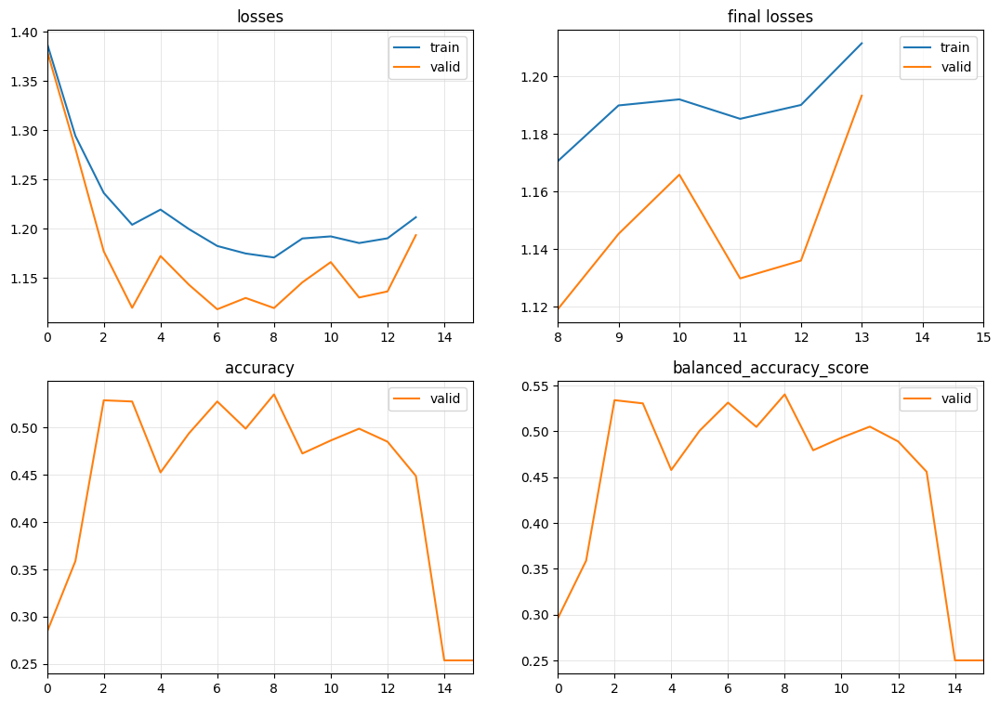

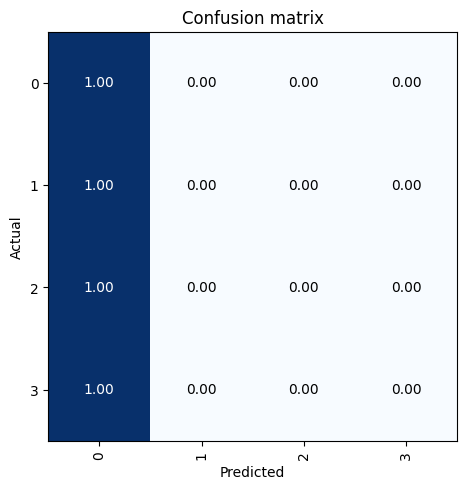

[I 2023-10-22 19:05:19,259] Trial 36 finished with value: 0.5350000262260437 and parameters: {'num_days': 7, 'sample_frac': 0.1, 'batch_size': 36, 'model': 'TCN', 'TCN_fc_dropout': 0.6000000000000001, 'TCN_conv_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -2, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 77, 'sample_frac': 0.5, 'batch_size': 68, 'model': 'XCM', 'window_perc': 0.8, 'xcm_nf': 128, 'xcm_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -3, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.097230,1.132510,0.499750,0.499161,04:27
1,1.035374,1.284785,0.461500,0.462787,04:28
2,1.017231,1.167651,0.534500,0.534342,04:28
3,1.000875,1.226978,0.506000,0.505438,04:28
4,0.998973,1.114694,0.547000,0.545393,04:28
5,0.984482,1.117172,0.567250,0.566117,04:28
6,0.977838,1.232390,0.474500,0.475511,04:28
7,0.967965,1.105234,0.565750,0.564450,04:28
8,0.965226,1.116556,0.558500,0.557967,04:28
9,0.959842,1.448255,0.482500,0.480211,04:28


No improvement since epoch 5: early stopping


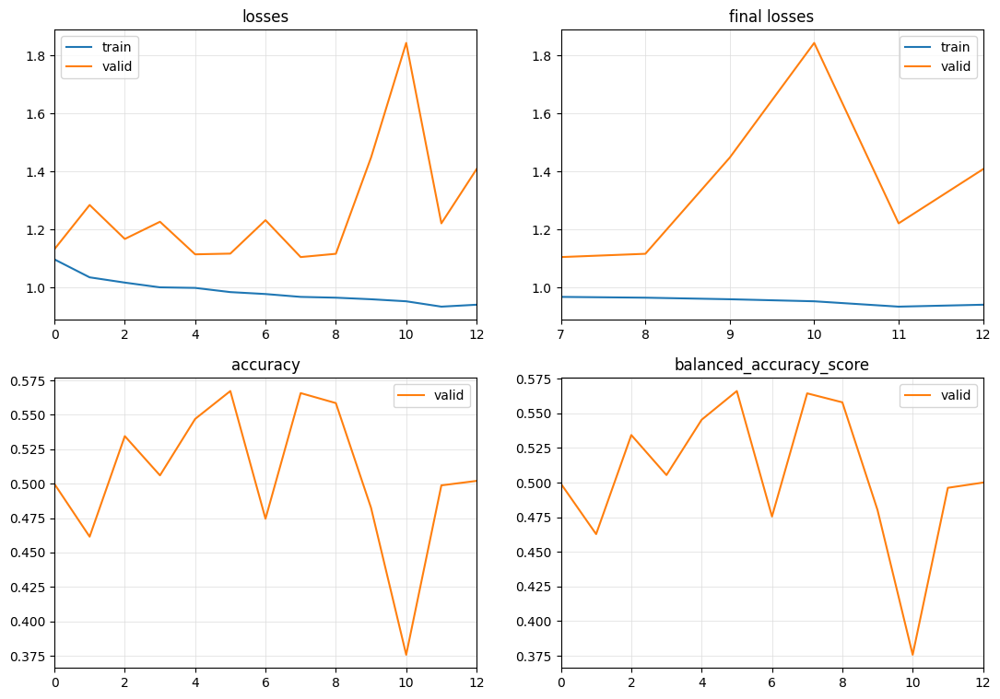

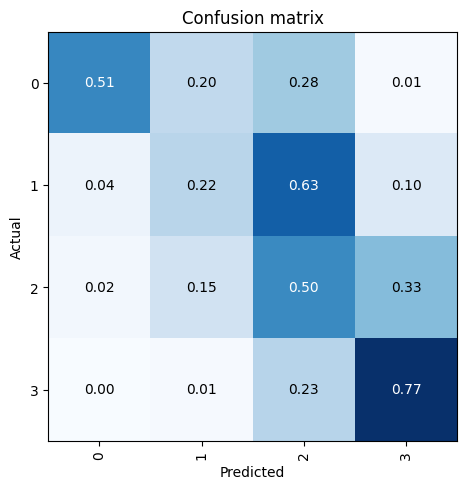

[I 2023-10-22 20:04:28,622] Trial 37 finished with value: 0.5672500133514404 and parameters: {'num_days': 77, 'sample_frac': 0.5, 'batch_size': 68, 'model': 'XCM', 'window_perc': 0.8, 'xcm_nf': 128, 'xcm_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -3, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 84, 'sample_frac': 0.6, 'batch_size': 68, 'model': 'TST', 'd_model': 64, 'n_heads': 1, 'd_k': 16, 'd_v': 48, 'd_ff': 384, 'tst_dropout': 0.4, 'n_layers': 9, 'tst_fc_dropout': 0.6000000000000001, 'store_attn': True, 'loss_func': 'None', 'learning_rate': -5, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.410250,1.370402,0.303542,0.305005,01:04
1,1.405943,1.363774,0.312708,0.314203,01:05
2,1.397494,1.357864,0.317708,0.319250,01:04
3,1.390515,1.350986,0.320208,0.321771,01:04
4,1.385594,1.344167,0.331250,0.332835,01:04
5,1.376466,1.335873,0.350208,0.351788,01:05
6,1.362337,1.324669,0.366250,0.367805,01:04
7,1.347188,1.309946,0.384792,0.386328,01:04
8,1.324792,1.291924,0.383333,0.384814,01:04
9,1.302668,1.274216,0.388125,0.389658,01:05


No improvement since epoch 28: early stopping


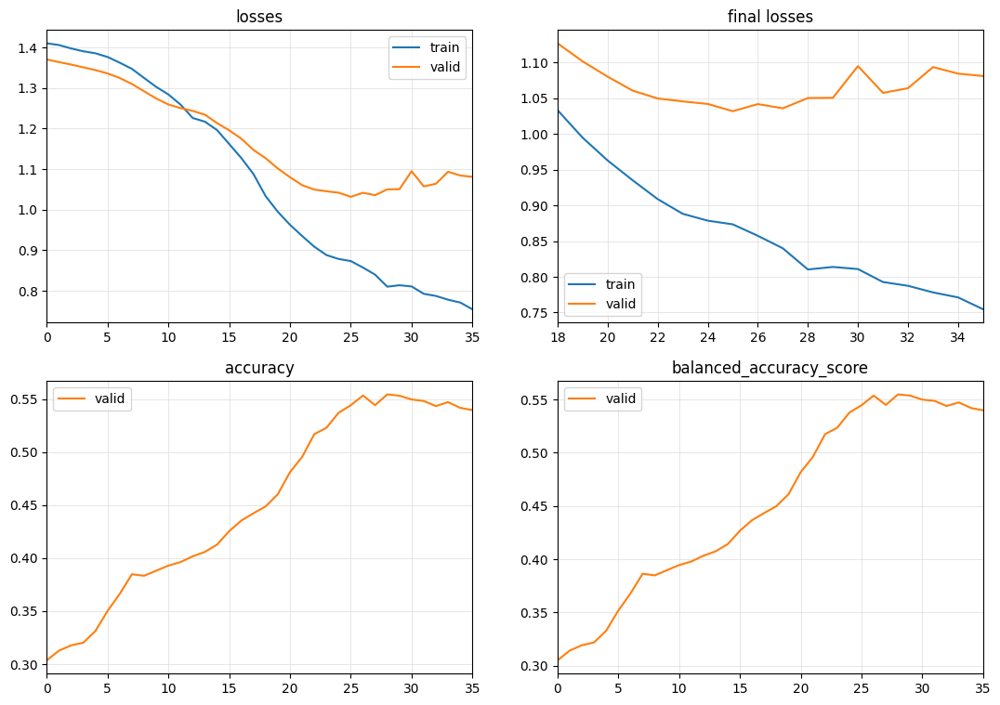

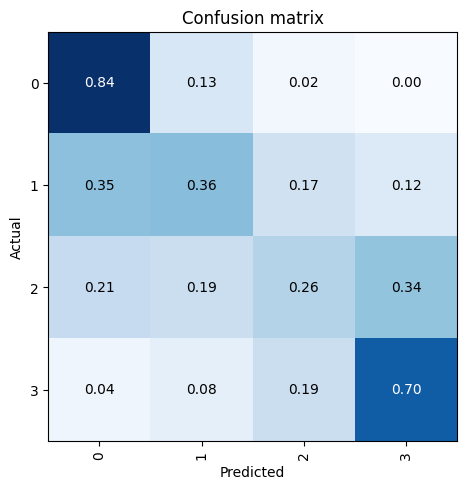

[I 2023-10-22 20:46:36,344] Trial 38 finished with value: 0.5543749928474426 and parameters: {'num_days': 84, 'sample_frac': 0.6, 'batch_size': 68, 'model': 'TST', 'd_model': 64, 'n_heads': 1, 'd_k': 16, 'd_v': 48, 'd_ff': 384, 'tst_dropout': 0.4, 'n_layers': 9, 'tst_fc_dropout': 0.6000000000000001, 'store_attn': True, 'loss_func': 'None', 'learning_rate': -5, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 56, 'sample_frac': 0.1, 'batch_size': 36, 'model': 'OmniScaleCNN', 'loss_func': 'None', 'learning_rate': -3, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.191532,1.156310,0.465000,0.468014,00:17
1,1.091226,1.206974,0.482500,0.475550,00:17
2,1.049076,1.131089,0.518750,0.511171,00:17
3,0.983680,1.132476,0.495000,0.494173,00:18
4,0.931997,1.183064,0.466250,0.475954,00:18
5,0.930289,1.182483,0.452500,0.457157,00:18
6,0.871630,1.265853,0.426250,0.434849,00:18
7,0.877054,1.206886,0.450000,0.452561,00:19
8,0.857864,1.247919,0.535000,0.529519,00:18
9,0.790823,1.261557,0.425000,0.428921,00:18


No improvement since epoch 8: early stopping


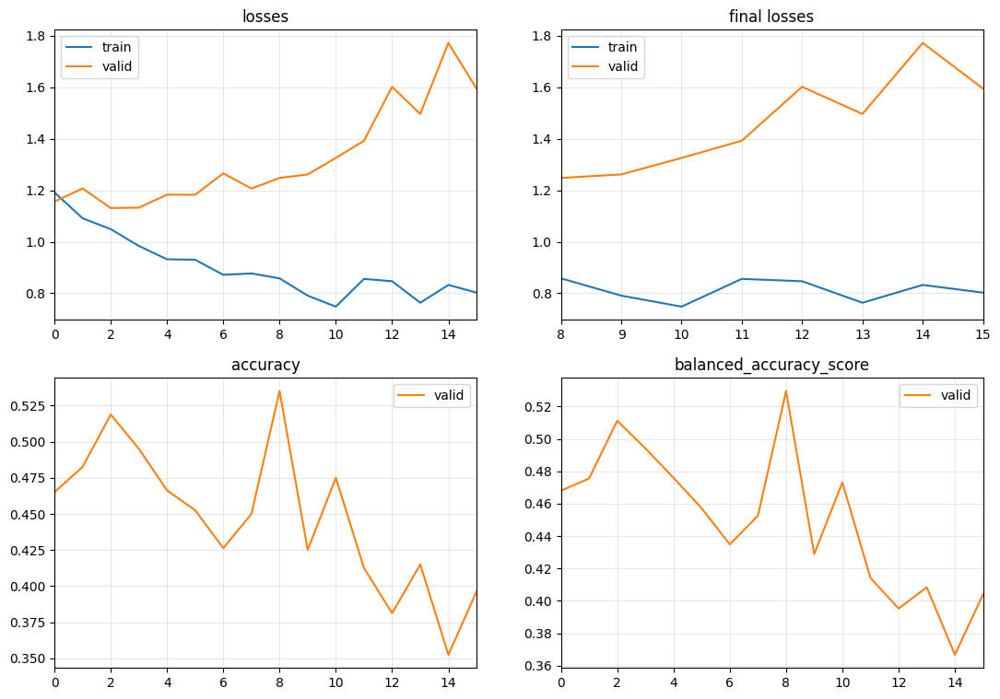

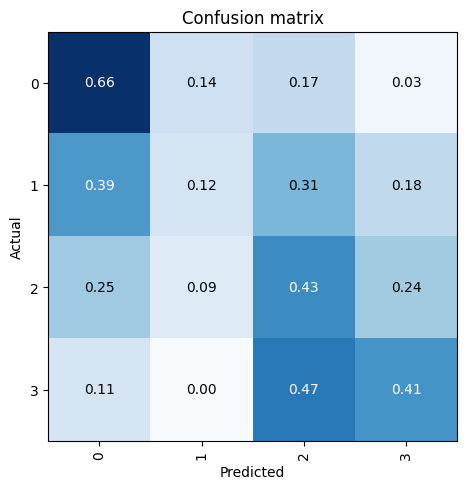

[I 2023-10-22 20:51:50,638] Trial 39 finished with value: 0.5350000262260437 and parameters: {'num_days': 56, 'sample_frac': 0.1, 'batch_size': 36, 'model': 'OmniScaleCNN', 'loss_func': 'None', 'learning_rate': -3, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 77, 'sample_frac': 0.7000000000000001, 'batch_size': 36, 'model': 'LSTM_FCNPlus', 'lstm_fcn_hidden_size': 100, 'lstm_fcn_n_layers': 1, 'lstm_fcn_rnn_dropout': 0.8, 'lstm_fcn_bidirectional': True, 'lstm_fcn_cell_dropout': 0.4, 'lstm_fcn_cell_type': 'GRU', 'loss_func': 'None', 'learning_rate': -5, 'learner_callback': 'None', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.387505,1.369877,0.345714,0.346697,00:19
1,1.364662,1.353382,0.361786,0.362424,00:19
2,1.357478,1.338702,0.375893,0.376384,00:20
3,1.344131,1.325178,0.381250,0.381620,00:20
4,1.331429,1.313933,0.390714,0.390970,00:19
5,1.325955,1.304683,0.386429,0.386920,00:20
6,1.316570,1.293446,0.390000,0.390445,00:20
7,1.310247,1.285305,0.389464,0.389902,00:19
8,1.303526,1.277876,0.390000,0.390355,00:19
9,1.289663,1.269782,0.390536,0.391006,00:20


No improvement since epoch 4: early stopping


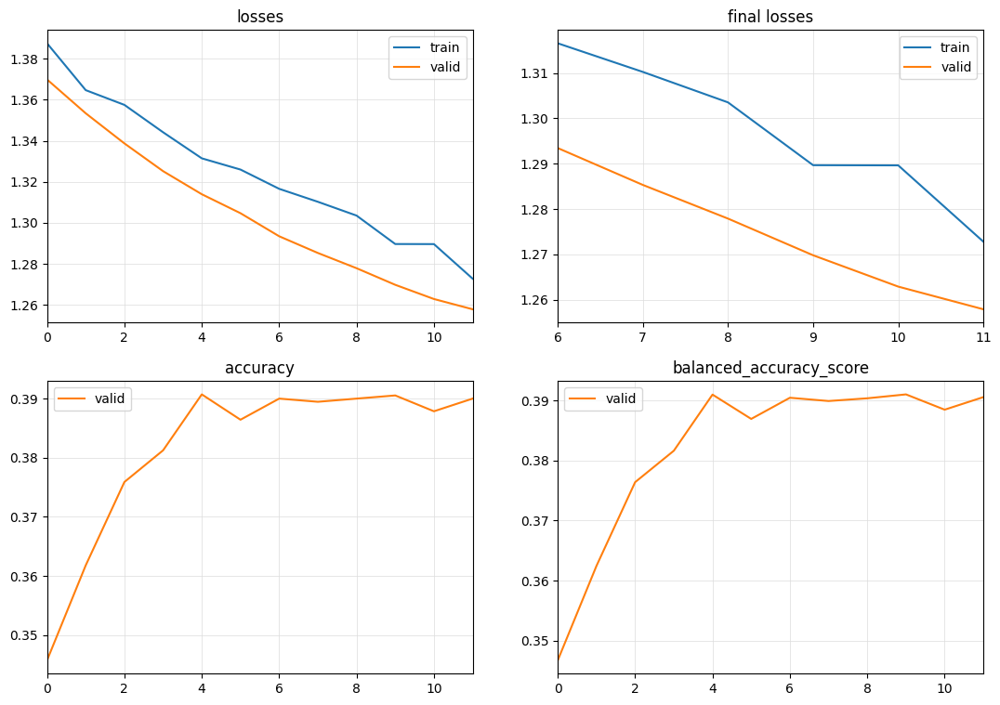

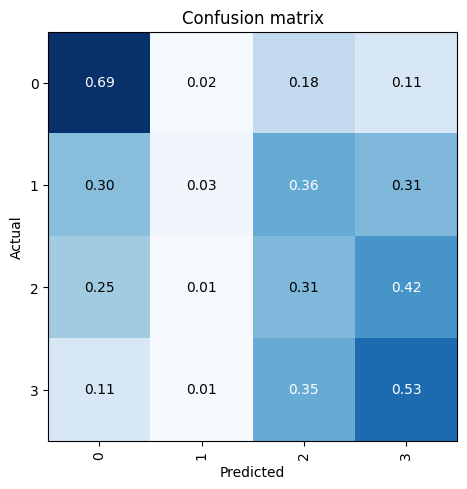

[I 2023-10-22 20:56:14,053] Trial 40 finished with value: 0.39071428775787354 and parameters: {'num_days': 77, 'sample_frac': 0.7000000000000001, 'batch_size': 36, 'model': 'LSTM_FCNPlus', 'lstm_fcn_hidden_size': 100, 'lstm_fcn_n_layers': 1, 'lstm_fcn_rnn_dropout': 0.8, 'lstm_fcn_bidirectional': True, 'lstm_fcn_cell_dropout': 0.4, 'lstm_fcn_cell_type': 'GRU', 'loss_func': 'None', 'learning_rate': -5, 'learner_callback': 'None', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 7, 'sample_frac': 0.7000000000000001, 'batch_size': 36, 'model': 'ResNetPlus', 'resnetplus_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.257241,1.186387,0.467857,0.469551,00:17
1,1.191713,1.155588,0.496964,0.498724,00:17
2,1.139002,1.154301,0.508929,0.510652,00:17
3,1.118222,1.150691,0.512500,0.513886,00:17
4,1.108943,1.143464,0.512679,0.514020,00:17
5,1.065422,1.142994,0.516607,0.517946,00:17
6,1.044123,1.145757,0.515536,0.516830,00:17
7,1.020911,1.147124,0.509286,0.510135,00:17
8,1.003961,1.163894,0.506429,0.507098,00:17
9,0.977727,1.163170,0.507679,0.508298,00:17


No improvement since epoch 5: early stopping


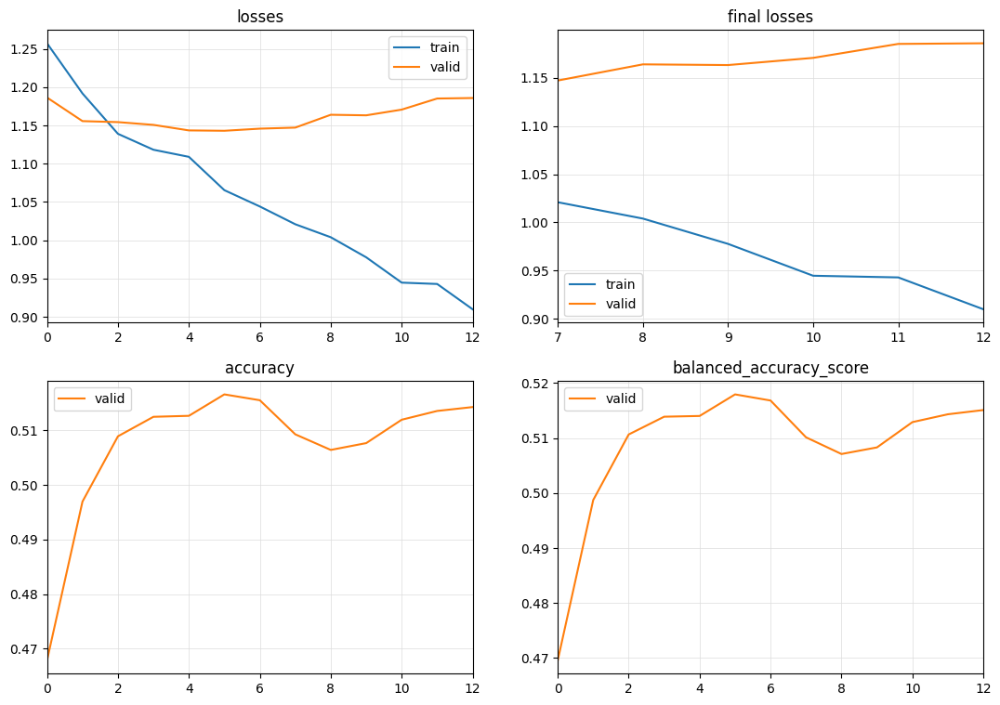

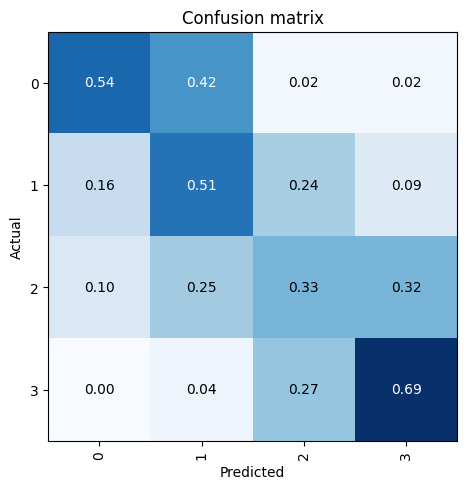

[I 2023-10-22 21:00:22,472] Trial 41 finished with value: 0.5166071653366089 and parameters: {'num_days': 7, 'sample_frac': 0.7000000000000001, 'batch_size': 36, 'model': 'ResNetPlus', 'resnetplus_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 14, 'sample_frac': 0.1, 'batch_size': 36, 'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_dropout_rate': 0.0, 'itp_fc_dropout_rate': 0.2, 'itp_ks': 40, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -3, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.262103,1.136280,0.512500,0.510400,00:06
1,1.215569,1.145590,0.520000,0.516831,00:06
2,1.186662,1.125149,0.518750,0.517446,00:06
3,1.175802,1.111523,0.528750,0.526834,00:06
4,1.140993,1.108180,0.523750,0.522578,00:06
5,1.096887,1.175633,0.478750,0.478814,00:06
6,1.081514,1.186279,0.517500,0.514055,00:06
7,1.080900,1.098740,0.545000,0.542451,00:06
8,1.039119,1.183273,0.516250,0.515793,00:06
9,1.081034,1.160610,0.525000,0.523143,00:07


No improvement since epoch 7: early stopping


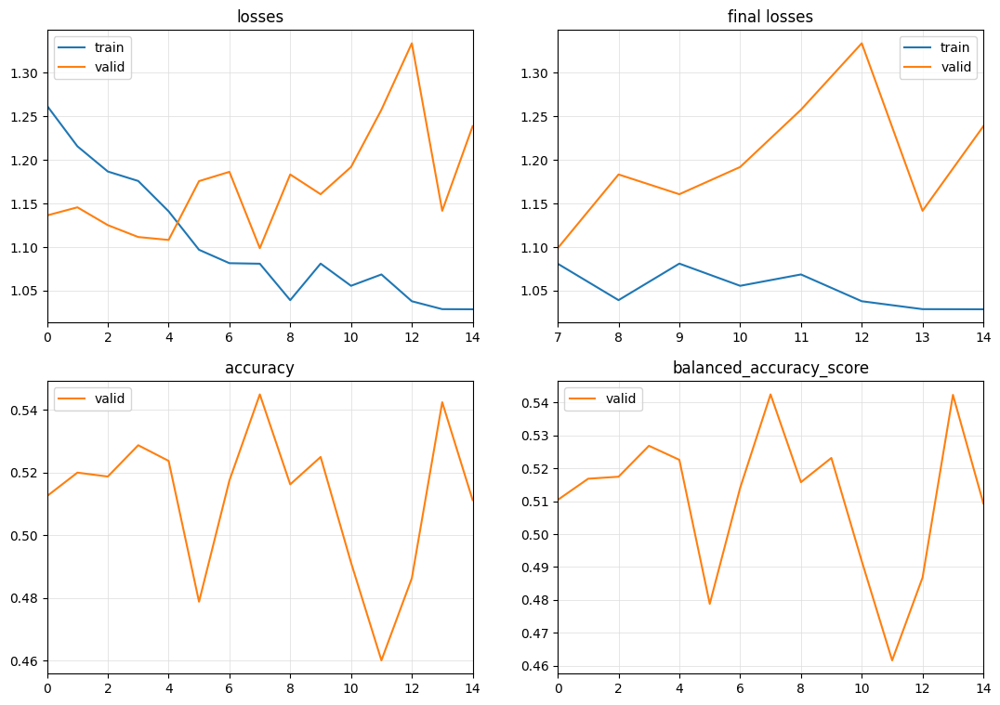

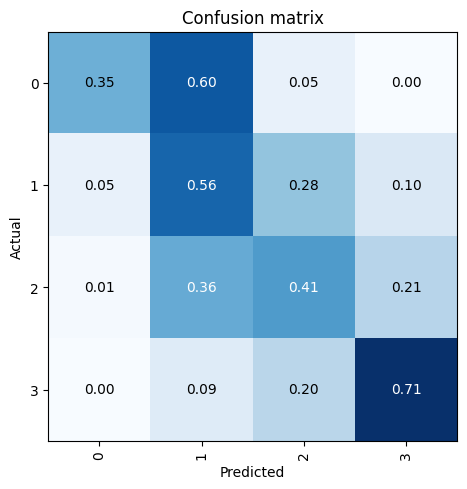

[I 2023-10-22 21:02:24,918] Trial 42 finished with value: 0.5450000166893005 and parameters: {'num_days': 14, 'sample_frac': 0.1, 'batch_size': 36, 'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_dropout_rate': 0.0, 'itp_fc_dropout_rate': 0.2, 'itp_ks': 40, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -3, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 84, 'sample_frac': 0.4, 'batch_size': 4, 'model': 'FCN', 'fcn_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.334192,1.294950,0.425000,0.423825,00:51
1,1.318059,1.277578,0.431563,0.431159,00:51
2,1.264373,1.278442,0.435937,0.435208,00:51
3,1.271023,1.278381,0.429062,0.428231,00:51
4,1.316126,1.275389,0.433437,0.432509,00:50
5,1.259658,1.273548,0.423125,0.424231,00:50
6,1.258038,1.296297,0.434063,0.433019,00:51
7,1.245224,1.297168,0.390000,0.386909,00:50
8,1.261141,1.307800,0.435625,0.434119,00:51
9,1.260158,1.301972,0.432187,0.431953,00:50


No improvement since epoch 2: early stopping


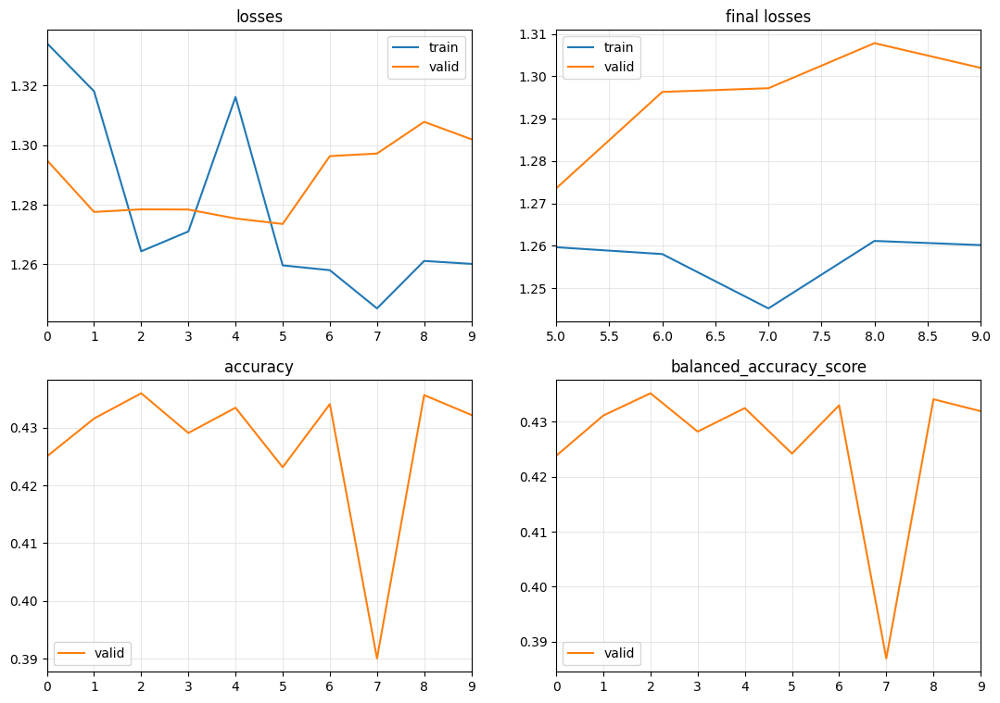

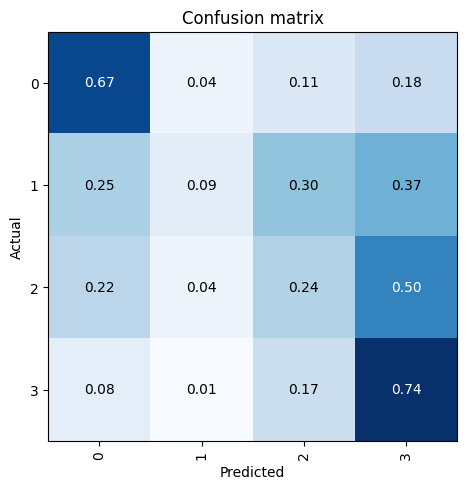

[I 2023-10-22 21:11:26,641] Trial 43 finished with value: 0.4359374940395355 and parameters: {'num_days': 84, 'sample_frac': 0.4, 'batch_size': 4, 'model': 'FCN', 'fcn_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 21, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'InceptionTimePlus', 'itp_num_filters': 64, 'itp_dropout_rate': 0.8, 'itp_fc_dropout_rate': 0.6000000000000001, 'itp_ks': 40, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.496874,1.395693,0.253125,0.250000,00:33
1,1.477963,1.395126,0.253125,0.250000,00:33
2,1.463574,1.394247,0.253125,0.250000,00:33
3,1.440989,1.395600,0.253125,0.250000,00:34
4,1.422075,1.401033,0.253125,0.250000,00:34
5,1.373814,1.403950,0.253125,0.250000,00:34
6,1.353387,1.418179,0.253125,0.250000,00:34
7,1.301929,1.439424,0.253125,0.250000,00:34


No improvement since epoch 0: early stopping


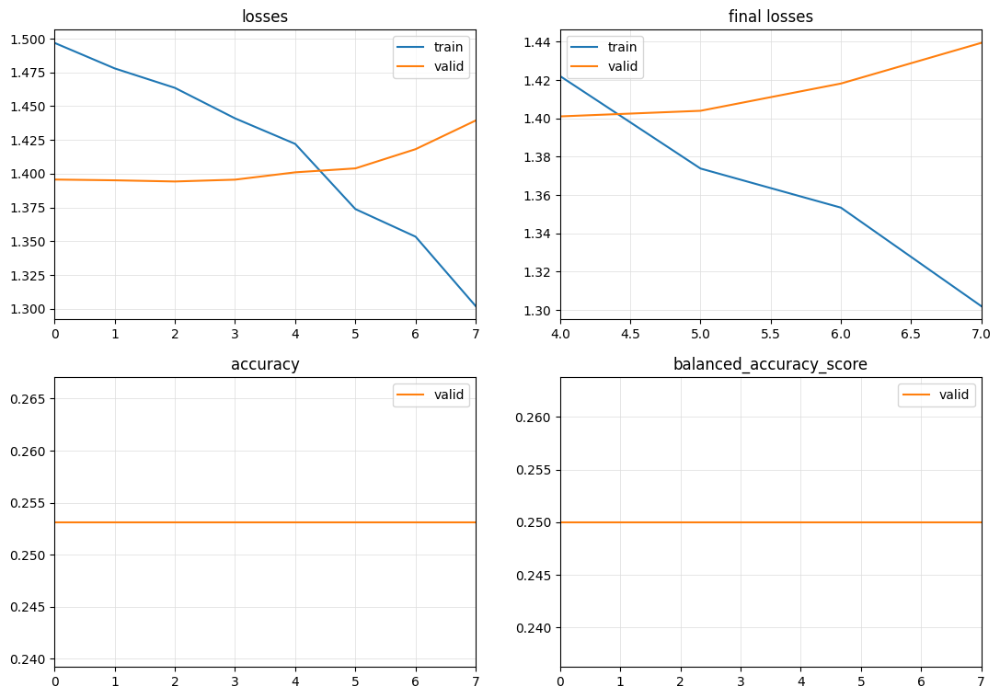

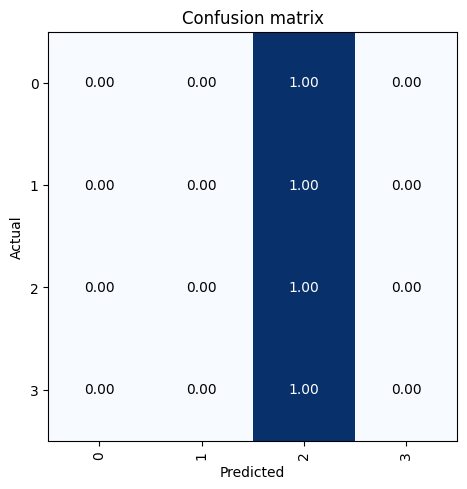

[I 2023-10-22 21:16:20,972] Trial 44 finished with value: 0.25312501192092896 and parameters: {'num_days': 21, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'InceptionTimePlus', 'itp_num_filters': 64, 'itp_dropout_rate': 0.8, 'itp_fc_dropout_rate': 0.6000000000000001, 'itp_ks': 40, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 63, 'sample_frac': 0.9, 'batch_size': 68, 'model': 'TCN', 'TCN_fc_dropout': 0.4, 'TCN_conv_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.388544,1.394685,0.222917,0.223921,00:23
1,1.387335,1.393271,0.252500,0.250000,00:23
2,1.388669,1.392629,0.252500,0.250000,00:23
3,1.386180,1.392218,0.252500,0.250000,00:23
4,1.385645,1.391750,0.252500,0.250000,00:23
5,1.385728,1.391667,0.252500,0.250000,00:23
6,1.385552,1.391680,0.252500,0.250000,00:24
7,1.385040,1.391660,0.252500,0.250000,00:24
8,1.382863,1.391256,0.252500,0.250000,00:23


No improvement since epoch 1: early stopping


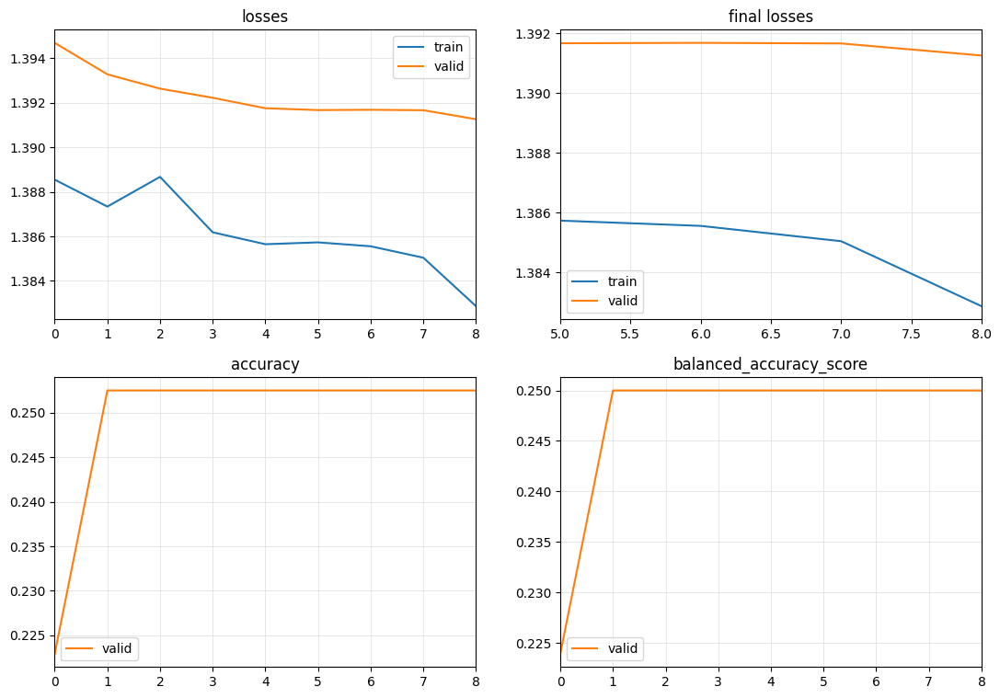

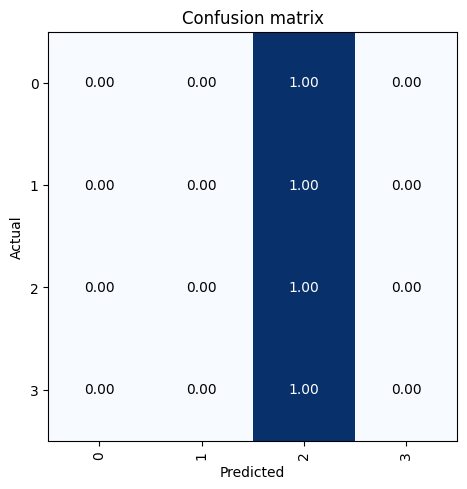

[I 2023-10-22 21:20:19,152] Trial 45 finished with value: 0.2524999976158142 and parameters: {'num_days': 63, 'sample_frac': 0.9, 'batch_size': 68, 'model': 'TCN', 'TCN_fc_dropout': 0.4, 'TCN_conv_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 7, 'sample_frac': 0.7000000000000001, 'batch_size': 68, 'model': 'ResNetPlus', 'resnetplus_fc_dropout': 0.8, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.453339,1.244576,0.395000,0.390083,00:11
1,1.339682,1.144265,0.466786,0.463712,00:11
2,1.241089,1.099013,0.502143,0.500467,00:11
3,1.191873,1.080475,0.507857,0.506775,00:11
4,1.143059,1.067683,0.510000,0.509256,00:11
5,1.115965,1.058468,0.521786,0.521444,00:11
6,1.080123,1.050902,0.531786,0.531675,00:11
7,1.055969,1.043597,0.534643,0.534605,00:11
8,1.033022,1.035975,0.534821,0.534775,00:11
9,0.992070,1.043081,0.534107,0.534190,00:11


No improvement since epoch 14: early stopping


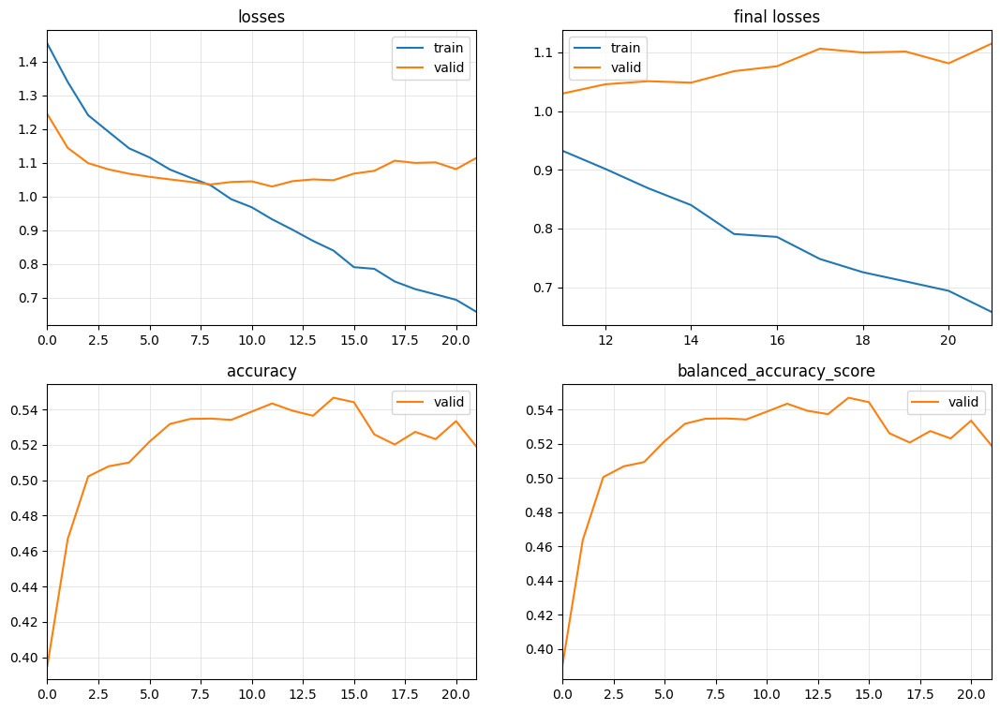

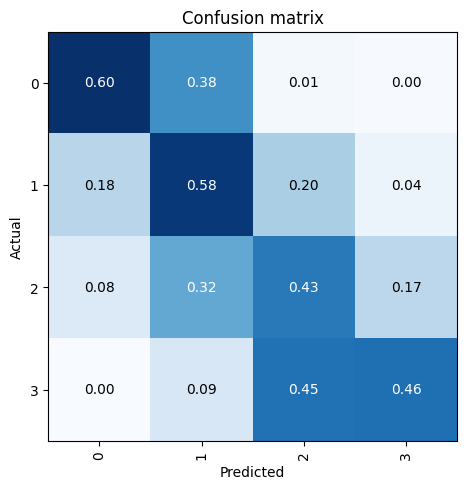

[I 2023-10-22 21:24:43,671] Trial 46 finished with value: 0.5466071367263794 and parameters: {'num_days': 7, 'sample_frac': 0.7000000000000001, 'batch_size': 68, 'model': 'ResNetPlus', 'resnetplus_fc_dropout': 0.8, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'None', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 21, 'sample_frac': 0.9, 'batch_size': 68, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.8, 'TSiTPlus_dropout': 0.4, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.367162,1.717412,0.249444,0.250277,01:02
1,1.327959,1.699710,0.254861,0.255685,01:02
2,1.243601,1.616821,0.366806,0.367441,01:02
3,1.195347,1.661368,0.388194,0.388784,01:02
4,1.178106,1.680272,0.399306,0.399863,01:03
5,1.163874,1.628510,0.411944,0.412475,01:02
6,1.162944,1.651359,0.415139,0.415659,01:02
7,1.140044,1.636957,0.418194,0.418699,01:02
8,1.136552,1.600214,0.420833,0.421336,01:02
9,1.144663,1.475761,0.434167,0.434573,01:02


No improvement since epoch 33: early stopping


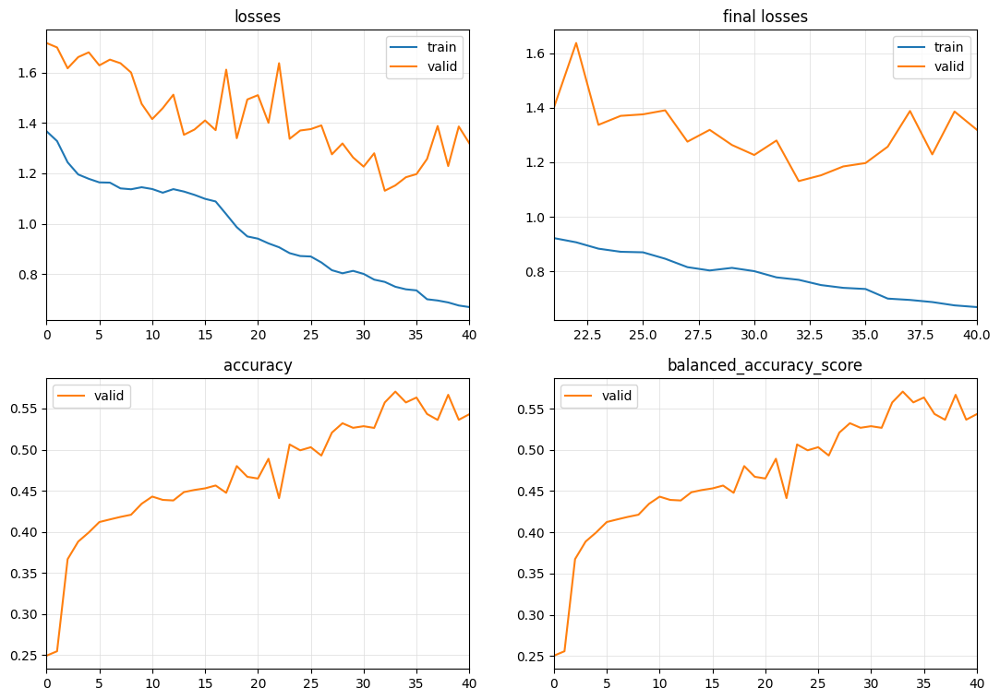

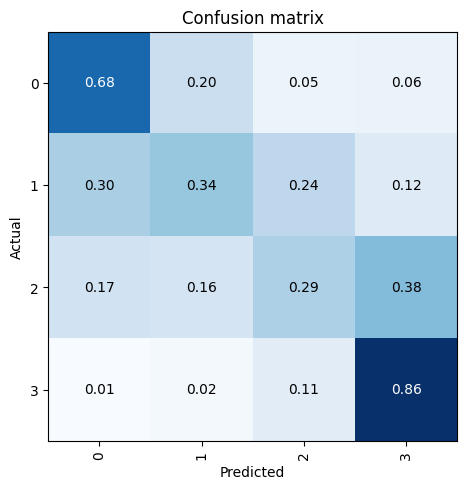

[I 2023-10-22 22:08:11,367] Trial 47 finished with value: 0.570555567741394 and parameters: {'num_days': 21, 'sample_frac': 0.9, 'batch_size': 68, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.8, 'TSiTPlus_dropout': 0.4, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 28, 'sample_frac': 0.5, 'batch_size': 36, 'model': 'XCM', 'window_perc': 0.6000000000000001, 'xcm_nf': 128, 'xcm_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -2, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.207849,1.300818,0.401000,0.398083,00:38
1,1.171908,1.102463,0.554250,0.547195,00:38
2,1.161505,1.167812,0.514000,0.506895,00:39
3,1.136143,1.250447,0.427000,0.426073,00:38
4,1.137222,1.183513,0.489250,0.489460,00:37
5,1.143485,1.207205,0.474750,0.467703,00:37
6,1.132300,1.209279,0.444000,0.447355,00:37
7,1.104487,1.295530,0.449250,0.444725,00:37
8,1.110386,1.250849,0.416250,0.417621,00:36


No improvement since epoch 1: early stopping


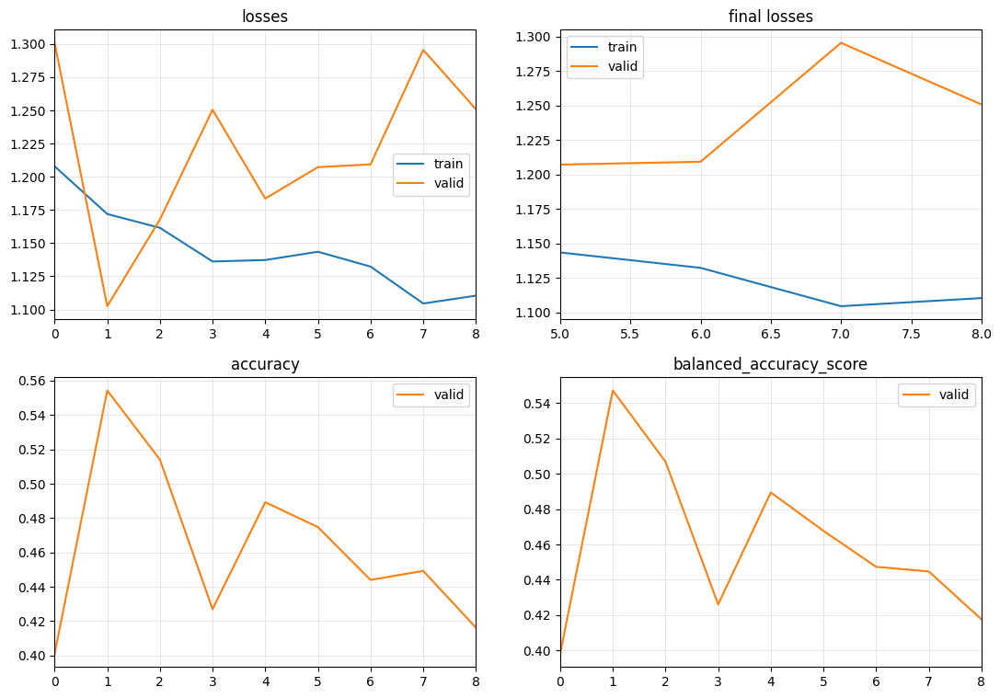

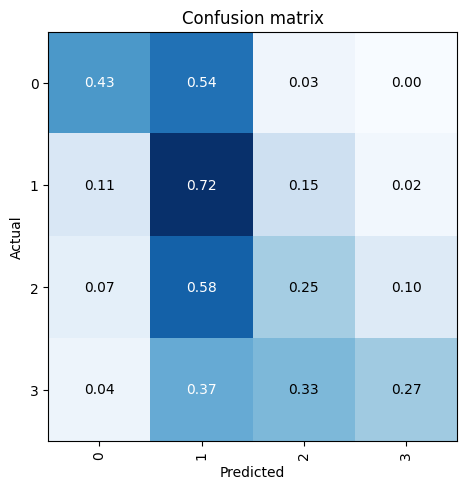

[I 2023-10-22 22:14:17,314] Trial 48 finished with value: 0.5542500019073486 and parameters: {'num_days': 28, 'sample_frac': 0.5, 'batch_size': 36, 'model': 'XCM', 'window_perc': 0.6000000000000001, 'xcm_nf': 128, 'xcm_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropy', 'learning_rate': -2, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}. Best is trial 12 with value: 0.578125.


{'num_days': 49, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.6000000000000001, 'TSiTPlus_dropout': 0.8, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.417294,1.705773,0.257969,0.256740,03:26
1,1.408036,1.720008,0.299844,0.297775,03:26
2,1.407788,1.716180,0.301250,0.299139,03:26
3,1.408331,1.705675,0.297344,0.295319,03:26
4,1.413984,1.714578,0.299219,0.297160,03:26
5,1.408997,1.694128,0.302500,0.300334,03:26
6,1.406869,1.702053,0.299844,0.297746,03:26
7,1.408105,1.701330,0.306250,0.303975,03:26
8,1.400294,1.690431,0.310937,0.308470,03:26
9,1.398388,1.764909,0.311406,0.308949,03:26


In [ ]:
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.NSGAIISampler())
#if exists("study.pkl"):
#   study = joblib.load("study.pkl")
    
study.optimize(objective, n_trials=200)

In [22]:
study = joblib.load("study.pkl")
#study.optimize(objective, n_trials=200)

FrozenTrial(number=60, state=TrialState.COMPLETE, values=[0.58203125], datetime_start=datetime.datetime(2023, 10, 23, 2, 0, 12, 409543), datetime_complete=datetime.datetime(2023, 10, 23, 2, 7, 58, 715510), params={'num_days': 14, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'XCM', 'window_perc': 1.0, 'xcm_nf': 192, 'xcm_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -3, 'learner_callback': 'None', 'optimizer': 'AdamWD'}, user_attrs={}, system_attrs={'nsga2:generation': 1}, intermediate_values={}, distributions={'num_days': IntDistribution(high=84, log=False, low=7, step=7), 'sample_frac': FloatDistribution(high=1.0, log=False, low=0.1, step=0.1), 'batch_size': IntDistribution(high=100, log=False, low=4, step=32), 'model': CategoricalDistribution(choices=('InceptionTimePlus', 'TST', 'XCM', 'LSTM', 'FCN', 'LSTM_FCNPlus', 'TCN', 'ResNetPlus', 'OmniScaleCNN', 'TSiTPlus', 'XceptionTimePlus')), 'window_perc': FloatDistribution(high=1.0, log=False, low=0.2

In [ ]:
#totry: {'num_days': 14, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'XceptionTimePlus', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}
#{'num_days': 84, 'sample_frac': 0.5, 'batch_size': 100, 'model': 'TST', 'd_model': 128, 'n_heads': 1, 'd_k': 48, 'd_v': 48, 'd_ff': 128, 'tst_dropout': 0.6000000000000001, 'n_layers': 1, 'tst_fc_dropout': 0.8, 'store_attn': False, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}
#{'num_days': 21, 'sample_frac': 0.9, 'batch_size': 68, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.8, 'TSiTPlus_dropout': 0.4, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}
#{'num_days': 14, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'XCM', 'window_perc': 1.0, 'xcm_nf': 192, 'xcm_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -3, 'learner_callback': 'None', 'optimizer': 'AdamWD'}

In [26]:
study.best_params

{'num_days': 7,
 'sample_frac': 0.2,
 'batch_size': 32,
 'itp_depth': 6,
 'learning_rate': 0.001}

[I 2023-10-13 16:56:28,386] A new study created in memory with name: no-name-13f17cb1-333d-4218-81a2-6a77de840d3a


{'num_days': 14, 'sample_frac': 0.7000000000000001, 'batch_size': 128, 'itp_depth': 6, 'learning_rate': 0.001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.607278,1.280798,0.455804,0.358025,01:20
1,0.442500,1.443100,0.449286,0.476582,01:20
2,0.370166,1.892364,0.486250,0.394941,01:16
3,0.326444,2.481216,0.419018,0.326510,01:16
4,0.291099,2.338745,0.396429,0.306878,01:16
5,0.255413,2.557266,0.390268,0.303088,01:16
6,0.239884,2.187387,0.459911,0.356749,01:16
7,0.225261,2.628989,0.452589,0.382304,01:16
8,0.208677,1.826985,0.485179,0.390892,01:16
9,0.198231,1.987518,0.476875,0.379973,01:16


No improvement since epoch 2: early stopping


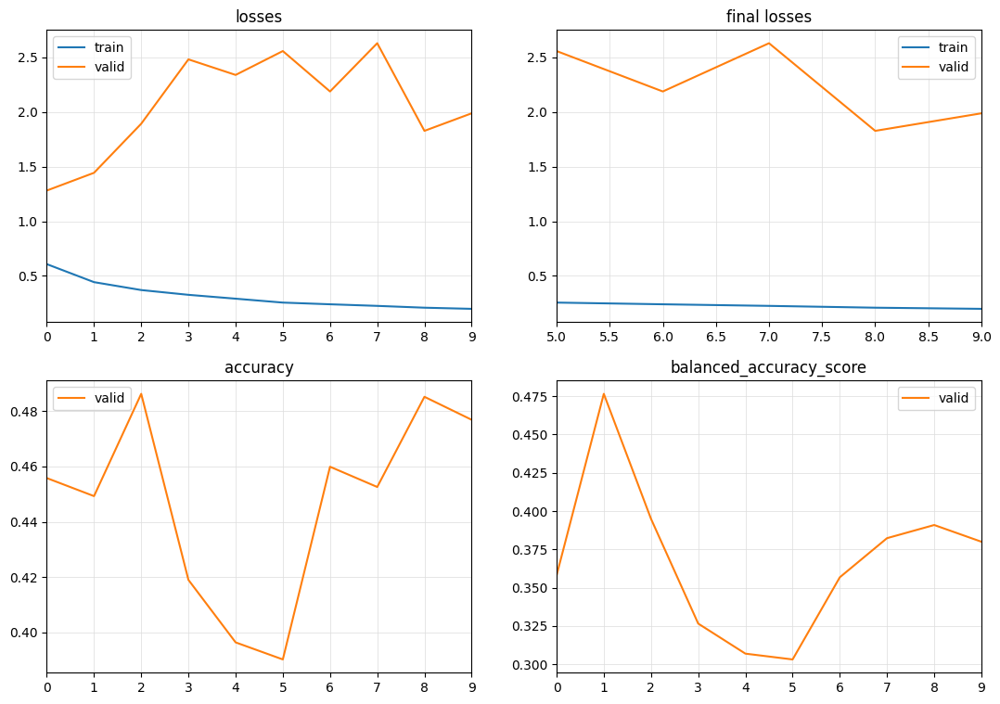

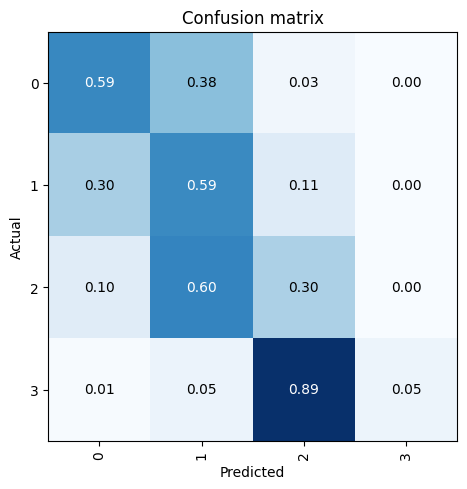

[I 2023-10-13 17:10:24,082] Trial 0 finished with value: 0.4765824864013327 and parameters: {'num_days': 14, 'sample_frac': 0.7000000000000001, 'batch_size': 128, 'itp_depth': 6, 'learning_rate': 0.001}. Best is trial 0 with value: 0.4765824864013327.


{'num_days': 14, 'sample_frac': 0.8, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.470365,1.195504,0.502578,0.395153,02:37
1,0.332538,1.629833,0.454844,0.355640,02:37
2,0.296461,1.736084,0.443984,0.350016,02:38
3,0.248937,1.951037,0.419141,0.329215,02:37
4,0.237201,1.651222,0.461875,0.379358,02:37
5,0.201307,1.826368,0.464453,0.359979,02:37
6,0.196439,1.991570,0.449688,0.354984,02:38
7,0.190716,2.351180,0.414609,0.332135,02:37


No improvement since epoch 0: early stopping


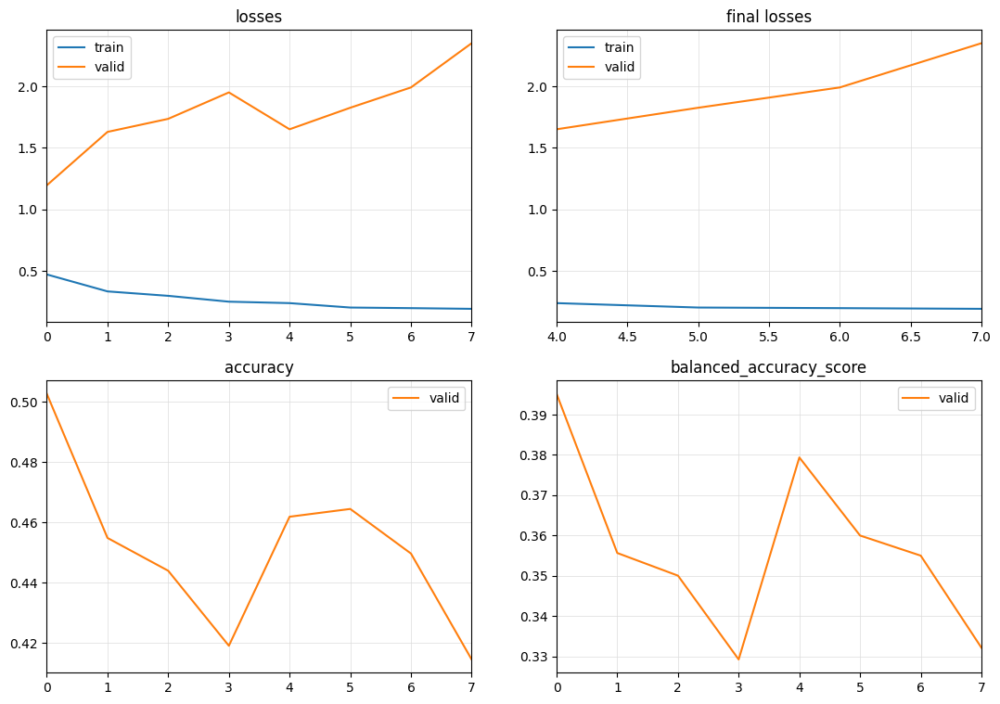

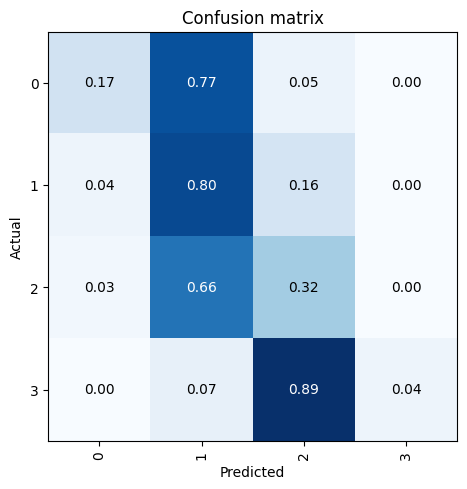

[I 2023-10-13 17:32:13,172] Trial 1 finished with value: 0.3951532940262743 and parameters: {'num_days': 14, 'sample_frac': 0.8, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.0001}. Best is trial 0 with value: 0.4765824864013327.


{'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.559589,1.215303,0.462109,0.357677,03:43
1,0.407357,1.438972,0.409063,0.359206,03:45
2,0.350577,1.609784,0.411016,0.368178,03:45
3,0.331395,1.727465,0.431094,0.336046,03:47
4,0.287853,1.764174,0.419219,0.324534,03:47
5,0.249181,1.611496,0.438516,0.349180,03:44
6,0.215103,1.785956,0.430156,0.355452,03:50
7,0.253433,1.745522,0.448906,0.350912,03:50


No improvement since epoch 0: early stopping


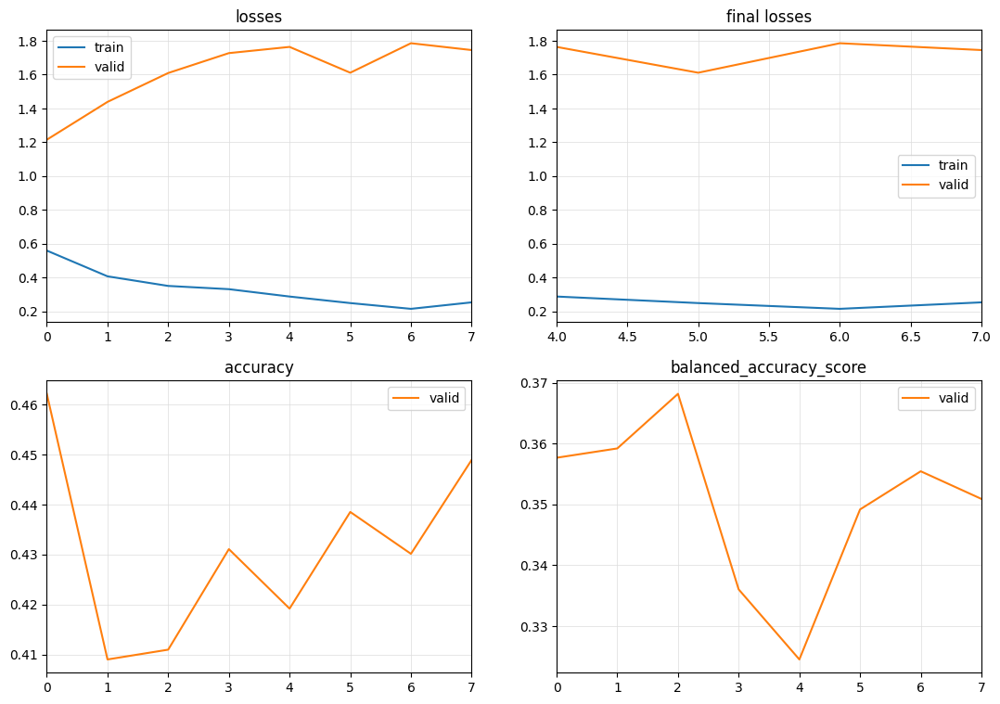

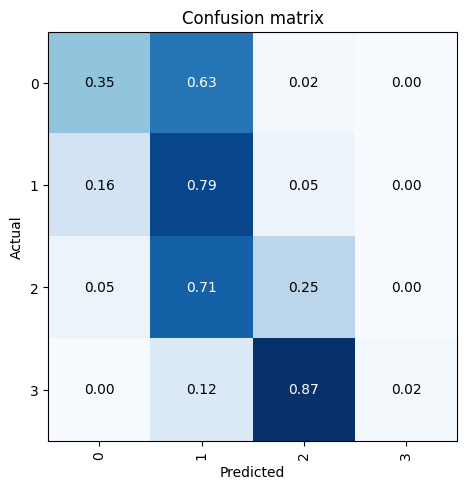

[I 2023-10-13 18:03:26,355] Trial 2 finished with value: 0.3681783208748054 and parameters: {'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.0001}. Best is trial 0 with value: 0.4765824864013327.


{'num_days': 14, 'sample_frac': 0.30000000000000004, 'batch_size': 32, 'itp_depth': 3, 'learning_rate': 1e-05}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.175697,1.169910,0.475417,0.363641,00:24
1,1.071574,1.086171,0.507083,0.387665,00:24
2,1.029147,1.049090,0.557500,0.426433,00:24
3,0.991363,1.027920,0.538333,0.412035,00:24
4,0.971160,1.034358,0.494792,0.379926,00:24
5,0.952996,1.129810,0.448958,0.345398,00:24
6,0.933010,0.985295,0.578958,0.445110,00:24
7,0.922633,1.041377,0.488750,0.376802,00:24
8,0.889221,0.948382,0.620417,0.476808,00:24
9,0.893519,0.975991,0.536458,0.413247,00:24


No improvement since epoch 8: early stopping


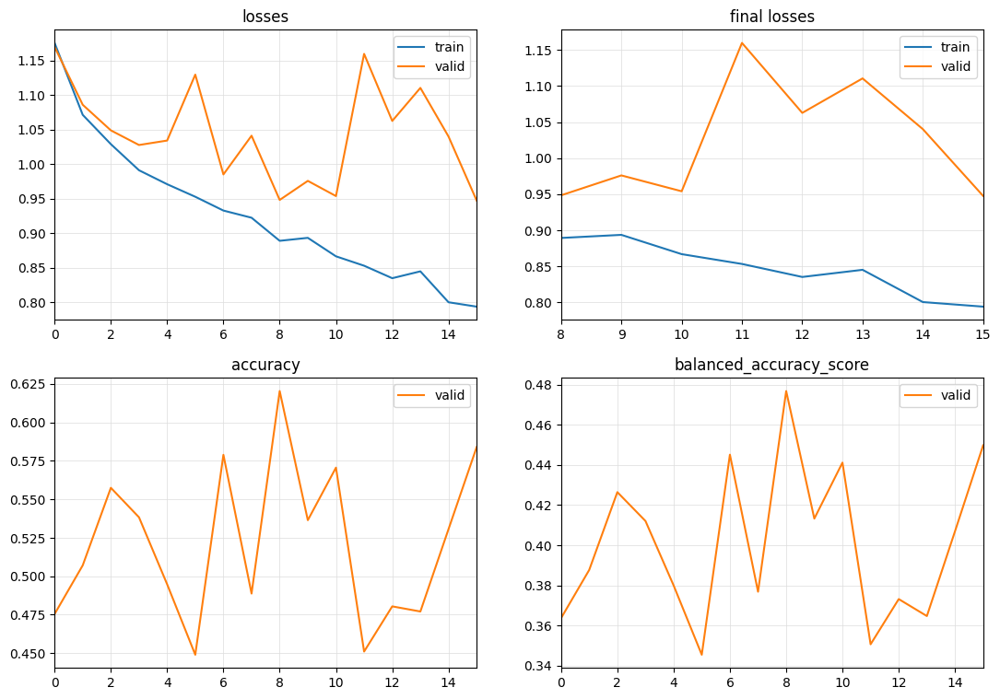

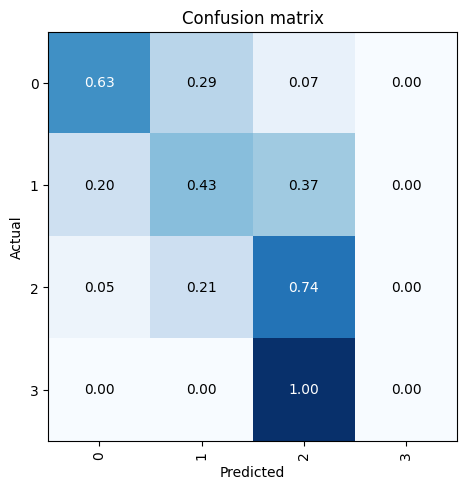

[I 2023-10-13 18:10:35,827] Trial 3 finished with value: 0.47680765207535225 and parameters: {'num_days': 14, 'sample_frac': 0.30000000000000004, 'batch_size': 32, 'itp_depth': 3, 'learning_rate': 1e-05}. Best is trial 3 with value: 0.47680765207535225.


{'num_days': 14, 'sample_frac': 0.8, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.456929,1.471789,0.420781,0.328160,02:37
1,0.344554,1.545217,0.424766,0.338492,02:38
2,0.284121,2.142159,0.420703,0.326537,02:47
3,0.256347,2.316272,0.463359,0.378105,02:40
4,0.230665,1.847847,0.468984,0.395520,02:37
5,0.204636,1.719991,0.460000,0.372514,02:38
6,0.189563,2.041961,0.449062,0.348783,02:37
7,0.155218,2.182432,0.445781,0.348960,02:37
8,0.174036,2.198436,0.444687,0.349320,02:37
9,0.148893,2.338873,0.454531,0.366358,02:37


No improvement since epoch 4: early stopping


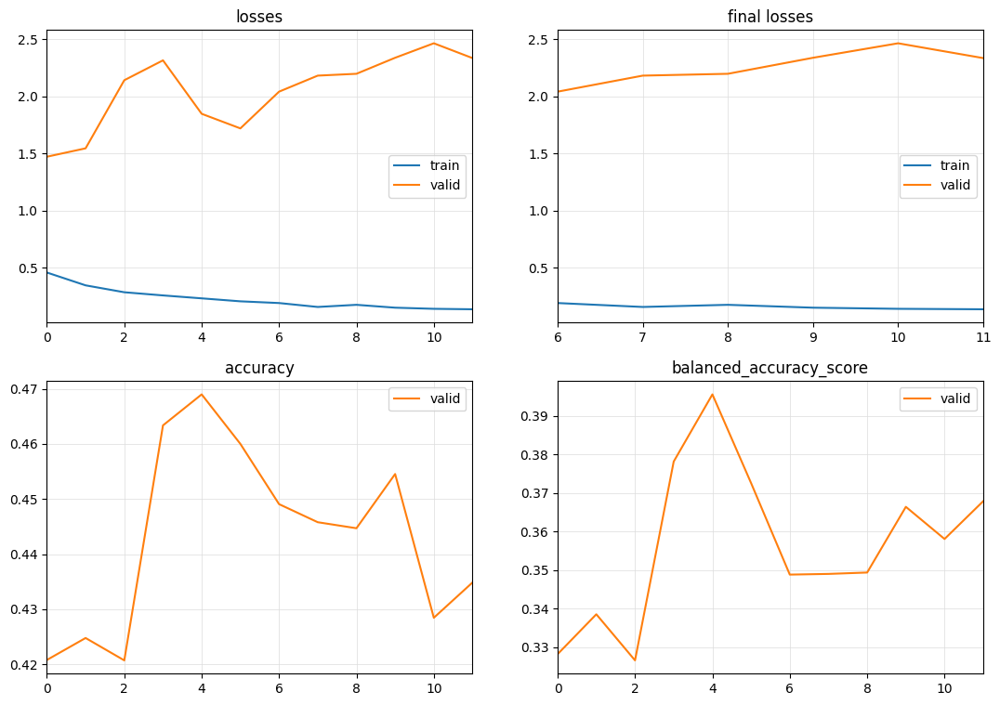

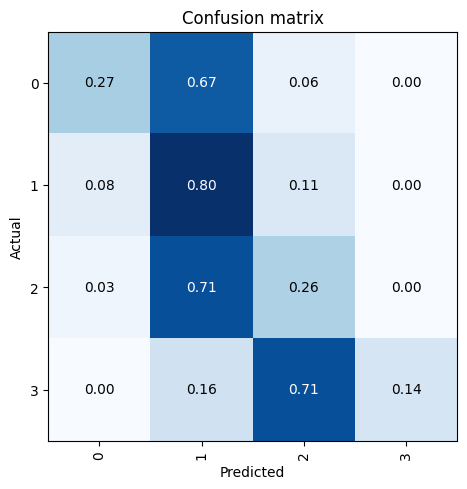

[I 2023-10-13 18:43:09,265] Trial 4 finished with value: 0.39551951852607453 and parameters: {'num_days': 14, 'sample_frac': 0.8, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.0001}. Best is trial 3 with value: 0.47680765207535225.


{'num_days': 14, 'sample_frac': 0.5, 'batch_size': 128, 'itp_depth': 3, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.852090,2.288751,0.323250,0.250658,00:31
1,0.718384,2.205060,0.312375,0.318407,00:31
2,0.657856,2.855433,0.382500,0.296318,00:32
3,0.584284,1.711739,0.474875,0.392410,00:31
4,0.527737,1.733873,0.476500,0.368285,00:32
5,0.460613,2.078783,0.471375,0.369207,00:32
6,0.427468,5.465590,0.381625,0.389406,00:31
7,0.371535,2.476868,0.412000,0.323869,00:32
8,0.345592,4.822392,0.388875,0.316852,00:32
9,0.335887,2.894786,0.436375,0.440551,00:32


No improvement since epoch 4: early stopping


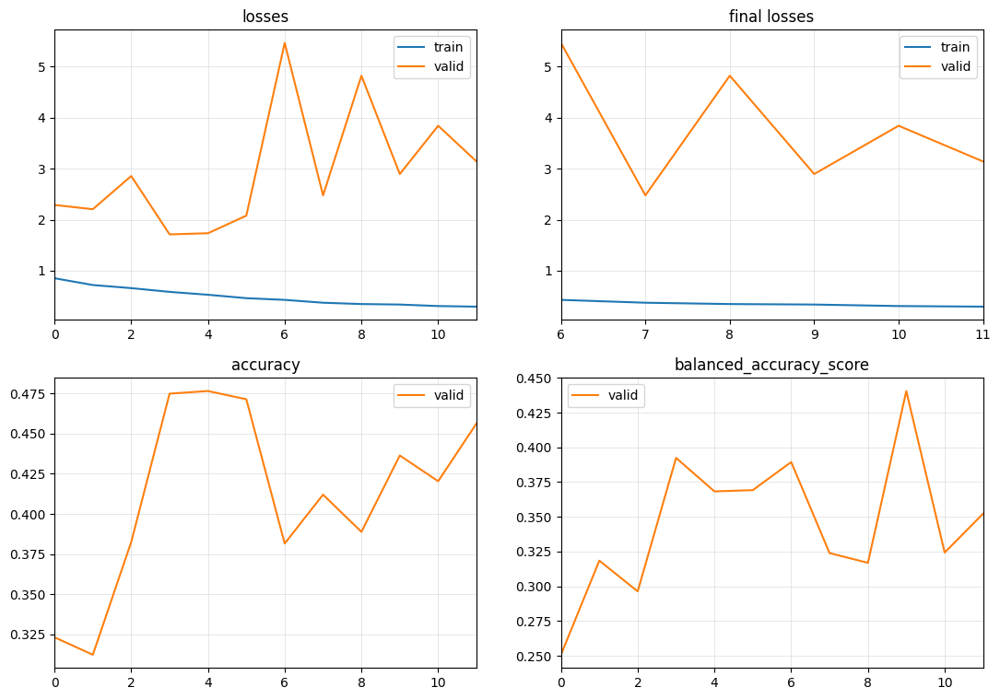

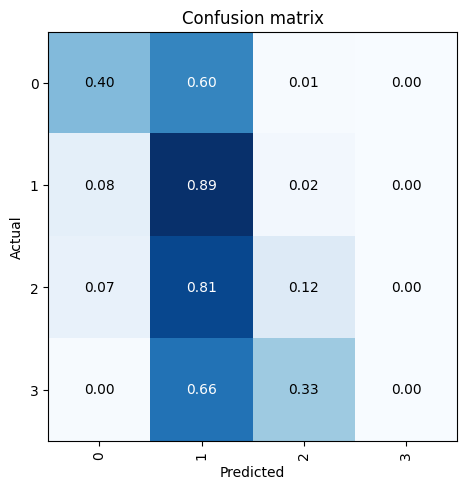

[I 2023-10-13 18:50:09,173] Trial 5 finished with value: 0.4405508585084251 and parameters: {'num_days': 14, 'sample_frac': 0.5, 'batch_size': 128, 'itp_depth': 3, 'learning_rate': 0.01}. Best is trial 3 with value: 0.47680765207535225.


{'num_days': 84, 'sample_frac': 0.7000000000000001, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.592842,1.132944,0.489018,0.377300,03:18
1,0.501297,1.576449,0.406339,0.313223,03:18
2,0.352497,1.469616,0.463482,0.366292,03:19
3,0.269082,1.634846,0.462411,0.401391,03:19
4,0.291869,1.664050,0.485536,0.380523,03:19
5,0.240689,2.112300,0.432589,0.401632,03:18
6,0.227878,1.670346,0.475893,0.422033,03:17
7,0.227440,1.930517,0.475179,0.418375,03:17


No improvement since epoch 0: early stopping


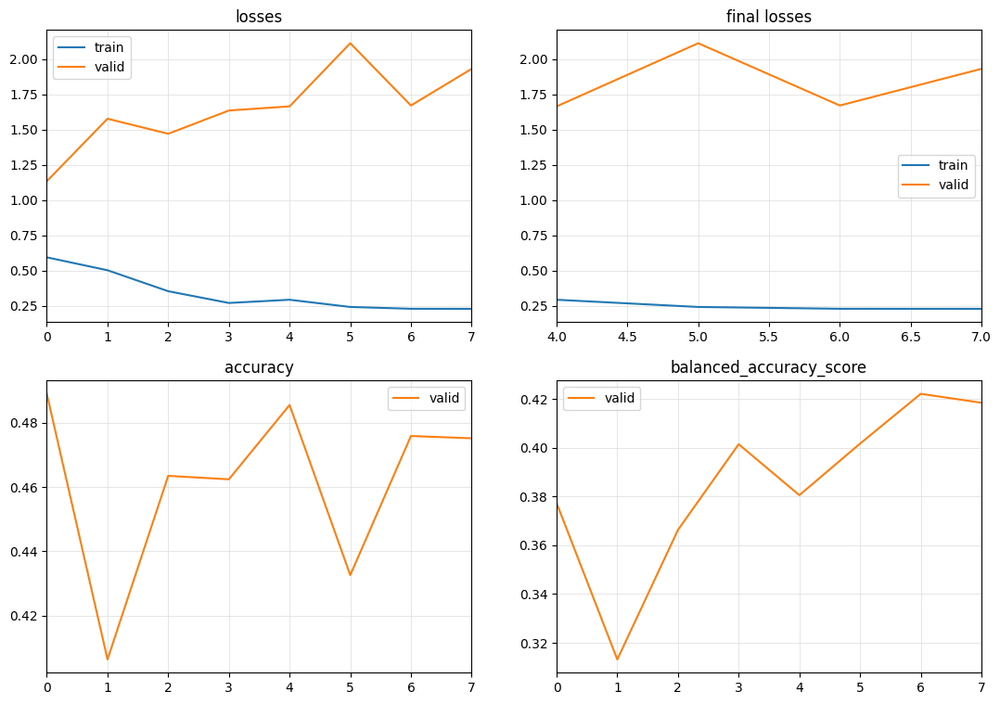

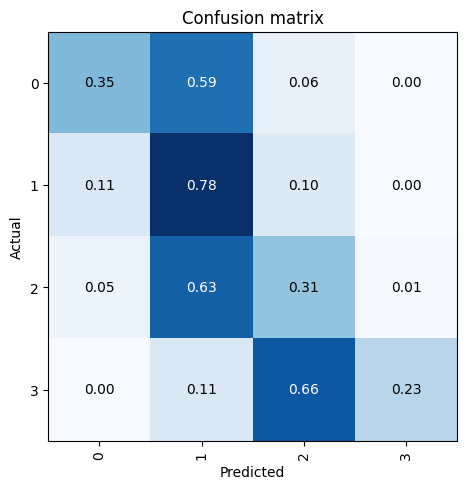

[I 2023-10-13 19:17:33,005] Trial 6 finished with value: 0.4220329931024235 and parameters: {'num_days': 84, 'sample_frac': 0.7000000000000001, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.0001}. Best is trial 3 with value: 0.47680765207535225.


{'num_days': 84, 'sample_frac': 0.7000000000000001, 'batch_size': 32, 'itp_depth': 6, 'learning_rate': 0.001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.592761,1.337899,0.404375,0.325853,01:37
1,0.451524,1.970908,0.398661,0.309268,01:38
2,0.365947,1.374009,0.503214,0.464257,01:37
3,0.318270,1.813855,0.466607,0.421509,01:38
4,0.289890,2.635654,0.348750,0.279822,01:37
5,0.278389,2.335416,0.421964,0.329882,01:37
6,0.251520,2.430261,0.425000,0.336254,01:37
7,0.224294,2.651303,0.438929,0.356766,01:37
8,0.237745,3.441707,0.401875,0.314308,01:37
9,0.199369,2.625773,0.420536,0.352013,01:37


No improvement since epoch 2: early stopping


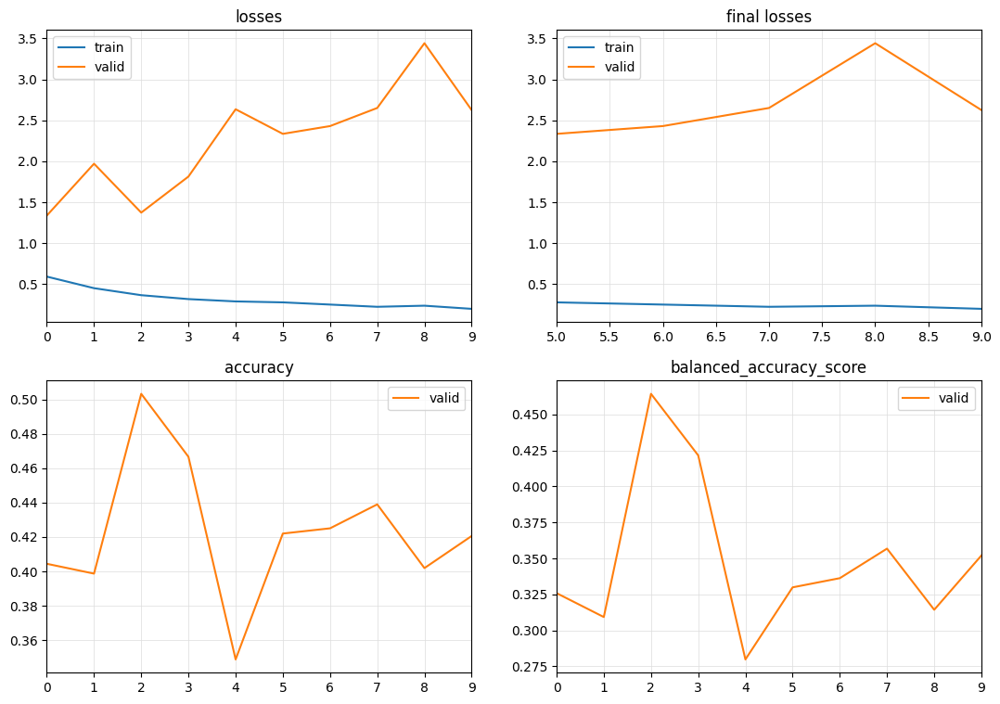

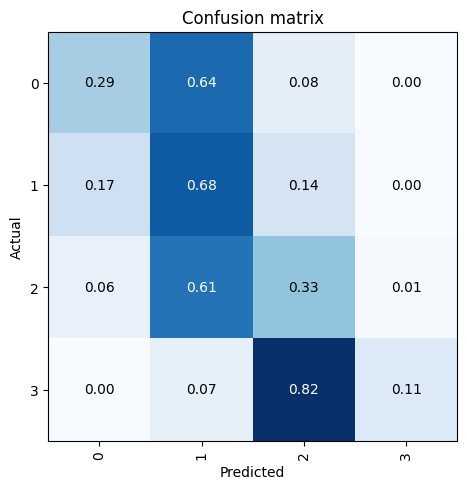

[I 2023-10-13 19:34:33,351] Trial 7 finished with value: 0.46425674953649654 and parameters: {'num_days': 84, 'sample_frac': 0.7000000000000001, 'batch_size': 32, 'itp_depth': 6, 'learning_rate': 0.001}. Best is trial 3 with value: 0.47680765207535225.


{'num_days': 56, 'sample_frac': 0.5, 'batch_size': 128, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.697942,1.841661,0.453125,0.351105,01:15
1,0.593437,1.411160,0.470625,0.363816,01:17
2,0.488925,3.214230,0.371500,0.300602,01:17
3,0.443761,1.634417,0.463750,0.398364,01:17
4,0.383863,2.308193,0.421500,0.339832,01:17
5,0.343287,8.252503,0.318875,0.247043,01:17
6,0.337557,2.260284,0.422500,0.390965,01:17
7,0.299741,2.511285,0.432875,0.334538,01:17
8,0.281158,4.421077,0.412000,0.347291,01:17


No improvement since epoch 1: early stopping


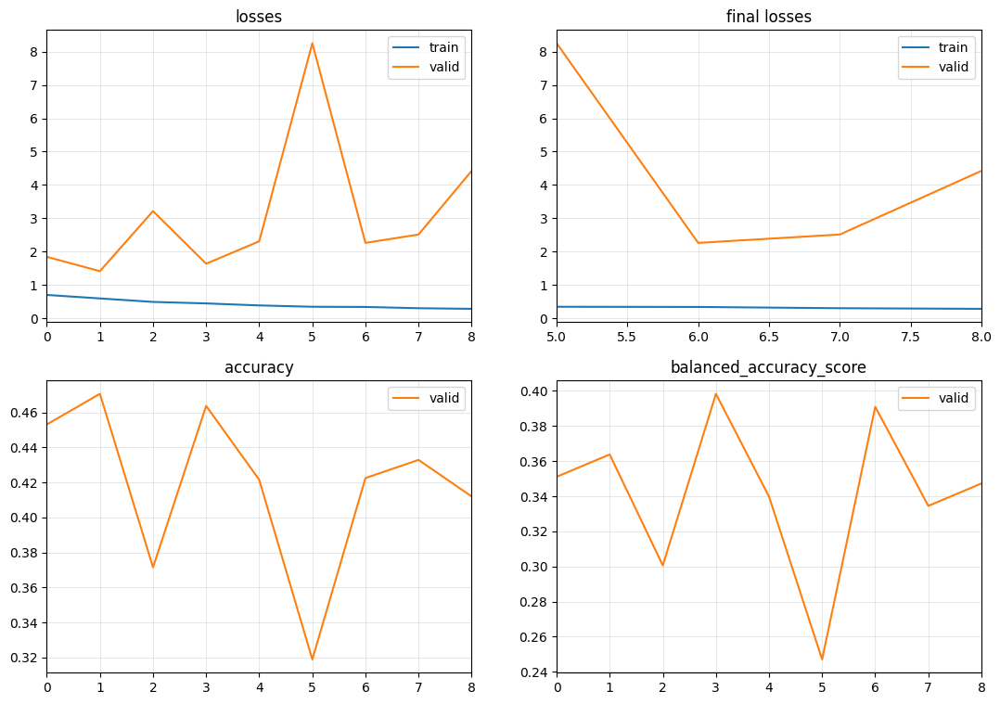

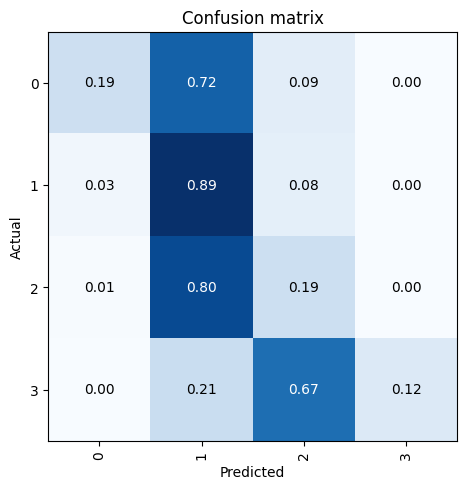

[I 2023-10-13 19:51:42,138] Trial 8 finished with value: 0.3983638160702546 and parameters: {'num_days': 56, 'sample_frac': 0.5, 'batch_size': 128, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 3 with value: 0.47680765207535225.


{'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.789853,1.002990,0.525312,0.403502,01:16
1,0.777104,0.988920,0.573750,0.484784,01:16
2,0.754064,1.130085,0.503438,0.414835,01:17
3,0.750644,2.161935,0.387500,0.336889,01:17
4,0.709441,1.346261,0.506250,0.408268,01:16
5,0.663471,1.189328,0.507187,0.465550,01:16
6,0.670997,1.209635,0.525937,0.509401,01:16
7,0.621695,1.149691,0.516563,0.401786,01:16
8,0.598408,1.216987,0.515000,0.397388,01:16


No improvement since epoch 1: early stopping


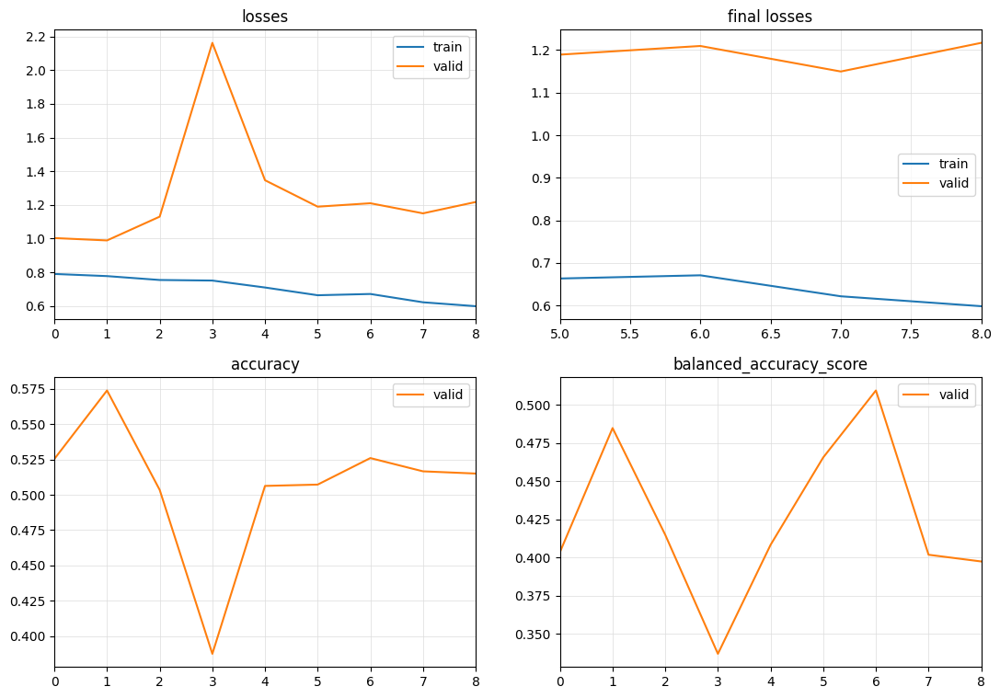

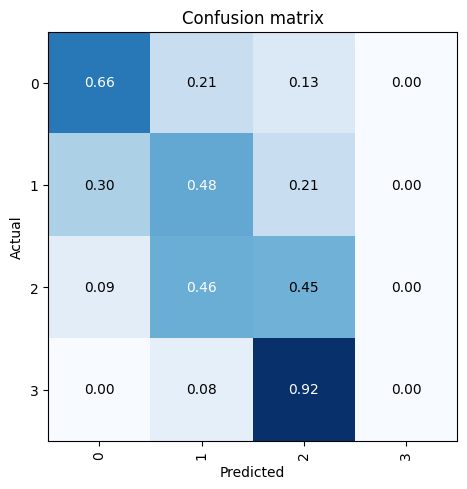

[I 2023-10-13 20:03:52,430] Trial 9 finished with value: 0.5094013710537073 and parameters: {'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 28, 'sample_frac': 0.1, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.068539,2.400253,0.208750,0.166001,00:21
1,0.835435,2.298993,0.373750,0.285989,00:21
2,0.746215,1.145639,0.541250,0.419752,00:21
3,0.694673,1.369581,0.517500,0.401058,00:21
4,0.648955,1.395466,0.494375,0.392886,00:21
5,0.635403,1.816068,0.450625,0.354509,00:21
6,0.588875,1.907611,0.528750,0.410306,00:21
7,0.555690,1.390058,0.503750,0.393439,00:21
8,0.524954,7.180263,0.355000,0.320527,00:21
9,0.486861,1.713074,0.423125,0.338485,00:21


No improvement since epoch 2: early stopping


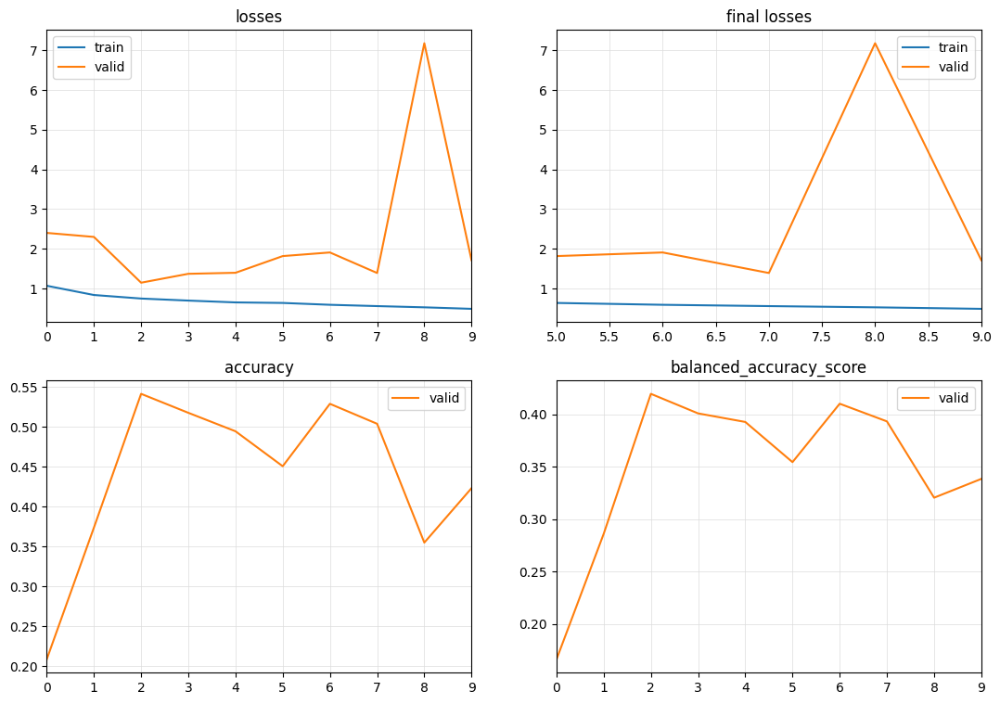

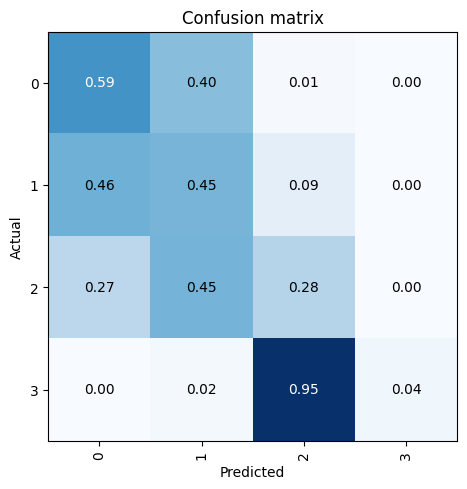

[I 2023-10-13 20:08:01,191] Trial 10 finished with value: 0.41975154898707545 and parameters: {'num_days': 28, 'sample_frac': 0.1, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 3, 'learning_rate': 1e-05}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.115430,1.101919,0.502187,0.380505,00:34
1,1.024666,1.127018,0.411875,0.317973,00:34
2,1.004618,1.108026,0.424375,0.319843,00:34
3,1.000619,1.061598,0.485625,0.369383,00:34
4,0.959899,1.013755,0.558125,0.426558,00:34
5,0.948291,0.976680,0.570312,0.436961,00:35
6,0.949044,1.004003,0.557187,0.430849,00:34
7,0.962104,0.999624,0.556562,0.427296,00:35
8,0.844519,1.000581,0.586875,0.451160,00:35
9,0.892080,1.257814,0.420625,0.318231,00:35


No improvement since epoch 8: early stopping


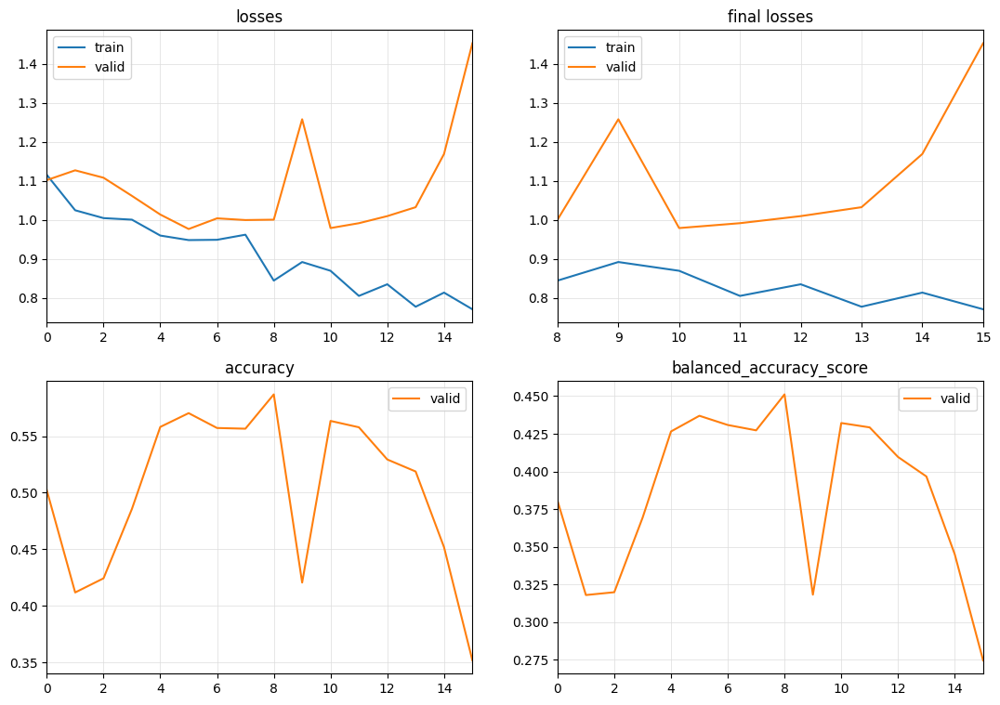

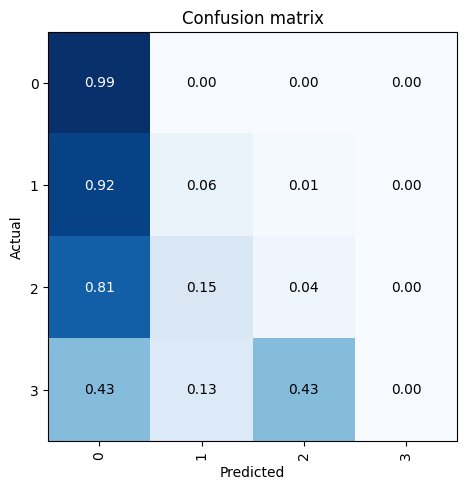

[I 2023-10-13 20:17:56,343] Trial 11 finished with value: 0.4511596446977517 and parameters: {'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 3, 'learning_rate': 1e-05}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 56, 'sample_frac': 0.30000000000000004, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 1e-05}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.038013,1.174826,0.467708,0.362742,01:05
1,0.846113,1.116897,0.516250,0.399525,01:05
2,0.758885,1.058320,0.527500,0.407696,01:05
3,0.662594,1.080804,0.523542,0.404745,01:05
4,0.596871,1.097582,0.505625,0.390846,01:05
5,0.539793,1.075920,0.530625,0.410024,01:05
6,0.494844,1.172434,0.489375,0.378163,01:05
7,0.459252,1.156519,0.507917,0.392506,01:05
8,0.402929,1.162402,0.511042,0.405659,01:05
9,0.381203,1.346173,0.471667,0.367548,01:05


No improvement since epoch 5: early stopping


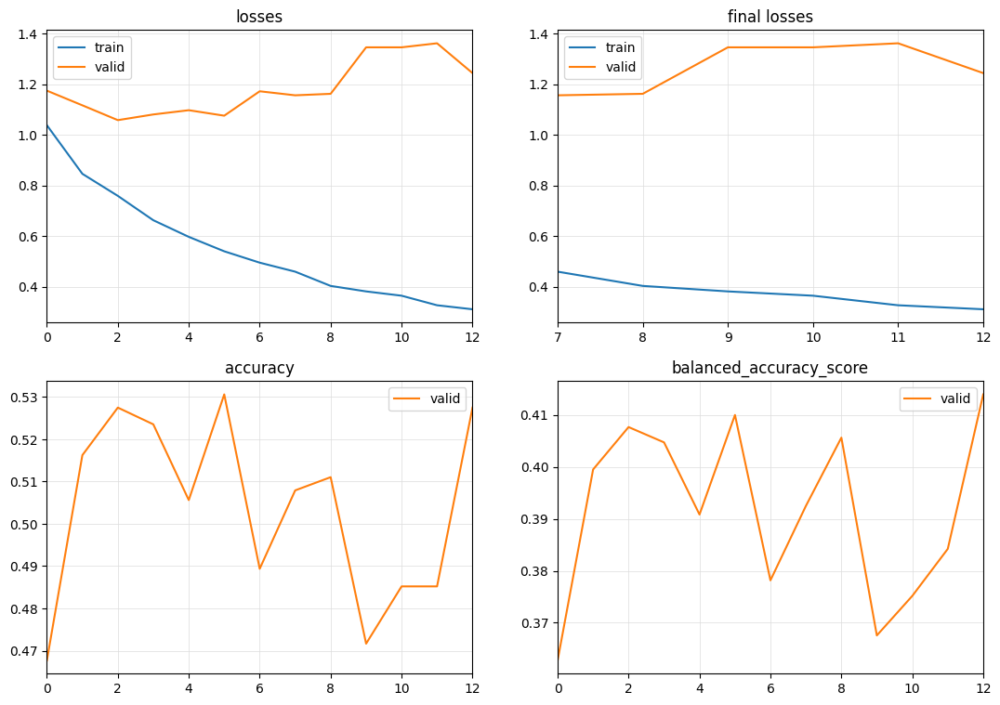

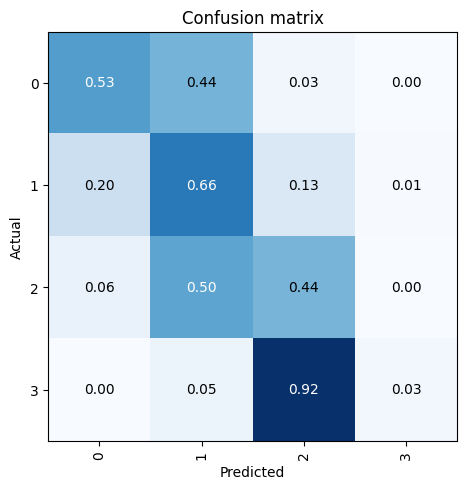

[I 2023-10-13 20:32:41,806] Trial 12 finished with value: 0.413992220705905 and parameters: {'num_days': 56, 'sample_frac': 0.30000000000000004, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 1e-05}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 28, 'sample_frac': 0.30000000000000004, 'batch_size': 8, 'itp_depth': 3, 'learning_rate': 1e-05}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.087083,1.091036,0.442083,0.341701,00:52
1,1.005380,1.044654,0.544375,0.421260,00:52
2,0.986206,1.012543,0.585833,0.453311,00:52
3,0.922227,1.263726,0.356667,0.278005,00:52
4,0.937541,1.023619,0.532083,0.411133,00:53
5,0.912908,1.146808,0.423333,0.329734,00:52
6,0.884632,1.217533,0.401667,0.309175,00:52
7,0.831125,0.969683,0.570625,0.441806,00:52
8,0.846278,1.029724,0.509167,0.393840,00:52
9,0.817828,1.028565,0.499167,0.385817,00:52


No improvement since epoch 2: early stopping


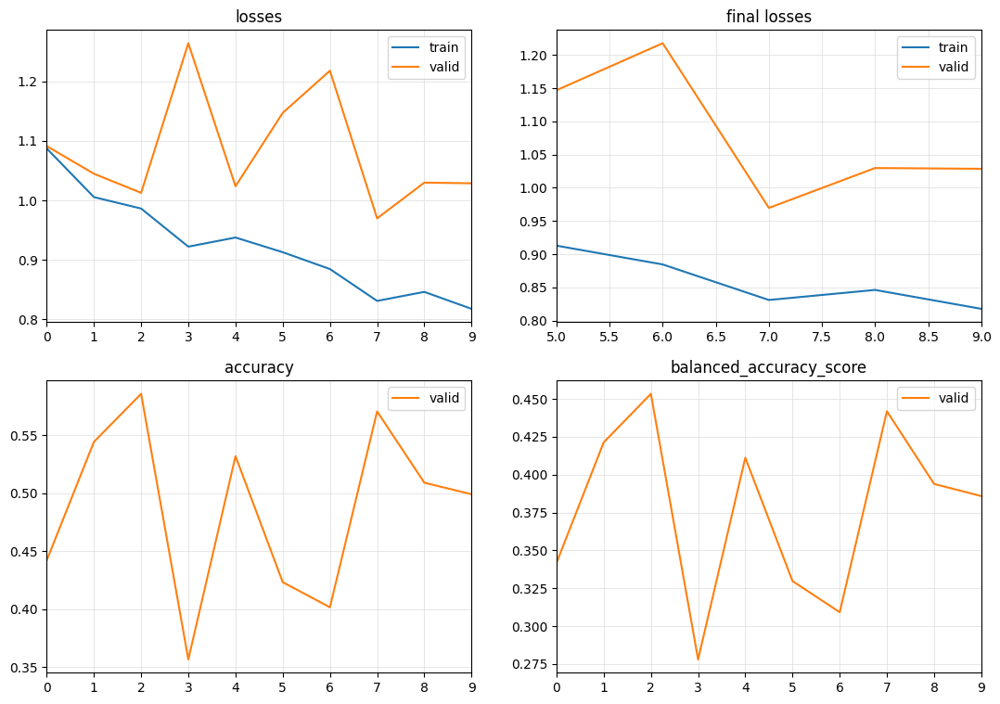

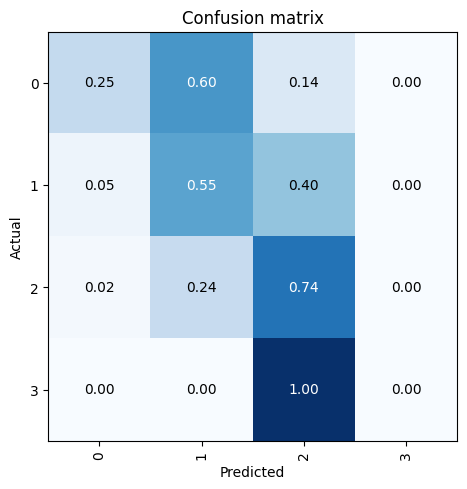

[I 2023-10-13 20:42:08,092] Trial 13 finished with value: 0.4533105525014945 and parameters: {'num_days': 28, 'sample_frac': 0.30000000000000004, 'batch_size': 8, 'itp_depth': 3, 'learning_rate': 1e-05}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 14, 'sample_frac': 0.4, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 1e-05}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.902363,1.023857,0.566875,0.436864,01:18
1,0.753444,0.966174,0.580938,0.449086,01:18
2,0.669884,1.181638,0.486406,0.377439,01:18
3,0.614238,0.984694,0.565000,0.436367,01:18
4,0.527324,1.021226,0.557031,0.429818,01:18
5,0.480153,1.163833,0.498437,0.387497,01:18
6,0.452801,1.343124,0.438750,0.339881,01:18
7,0.414094,1.253082,0.496250,0.390462,01:18
8,0.397687,1.284792,0.478281,0.371063,01:19


No improvement since epoch 1: early stopping


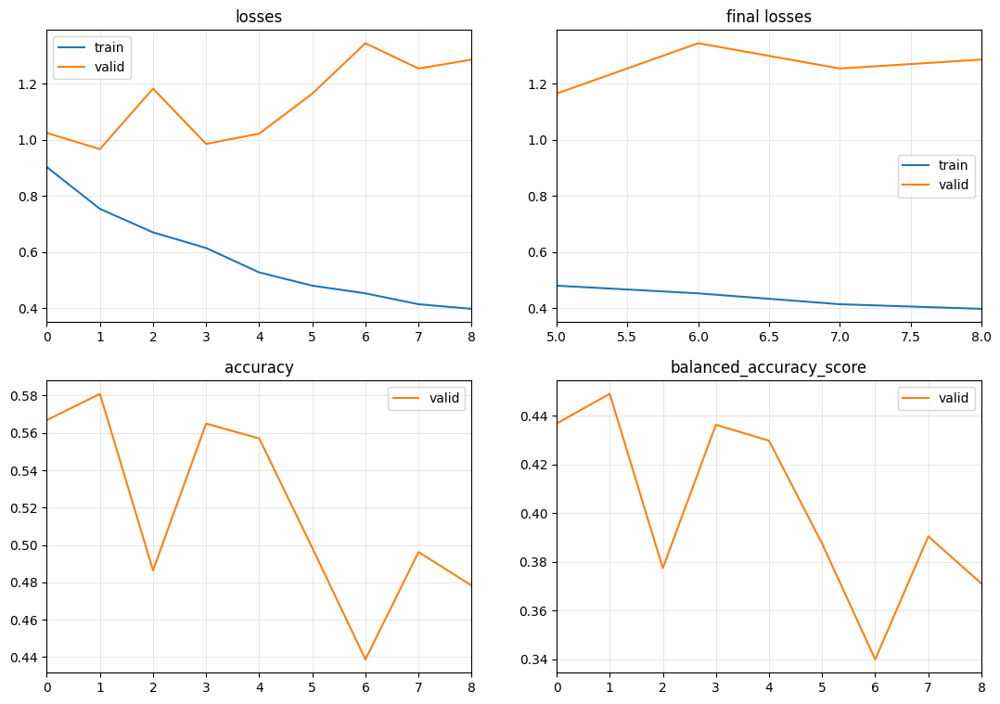

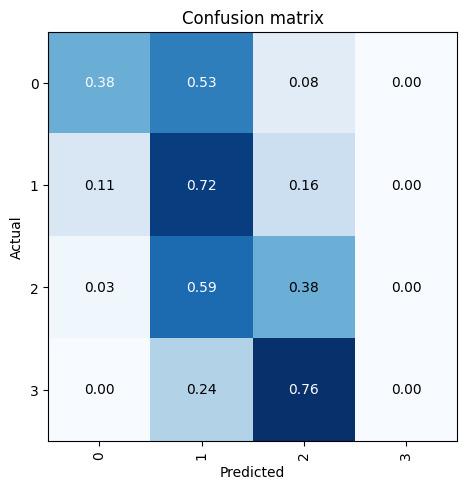

[I 2023-10-13 20:54:37,031] Trial 14 finished with value: 0.44908642836024154 and parameters: {'num_days': 14, 'sample_frac': 0.4, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 1e-05}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 28, 'sample_frac': 0.1, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.945804,1.327602,0.347500,0.270586,00:48
1,0.832976,3.212616,0.303125,0.235430,00:48
2,0.767319,1.431454,0.452500,0.355354,00:48
3,0.734469,1.053785,0.526250,0.440982,00:48
4,0.754236,0.980565,0.546875,0.440883,00:48
5,0.679316,1.201786,0.521875,0.404871,00:48
6,0.690542,1.090841,0.510625,0.400717,00:48
7,0.679038,1.318485,0.531875,0.412602,00:48
8,0.610247,0.990329,0.541875,0.424672,00:48
9,0.654854,1.074595,0.548125,0.442033,00:48


No improvement since epoch 13: early stopping


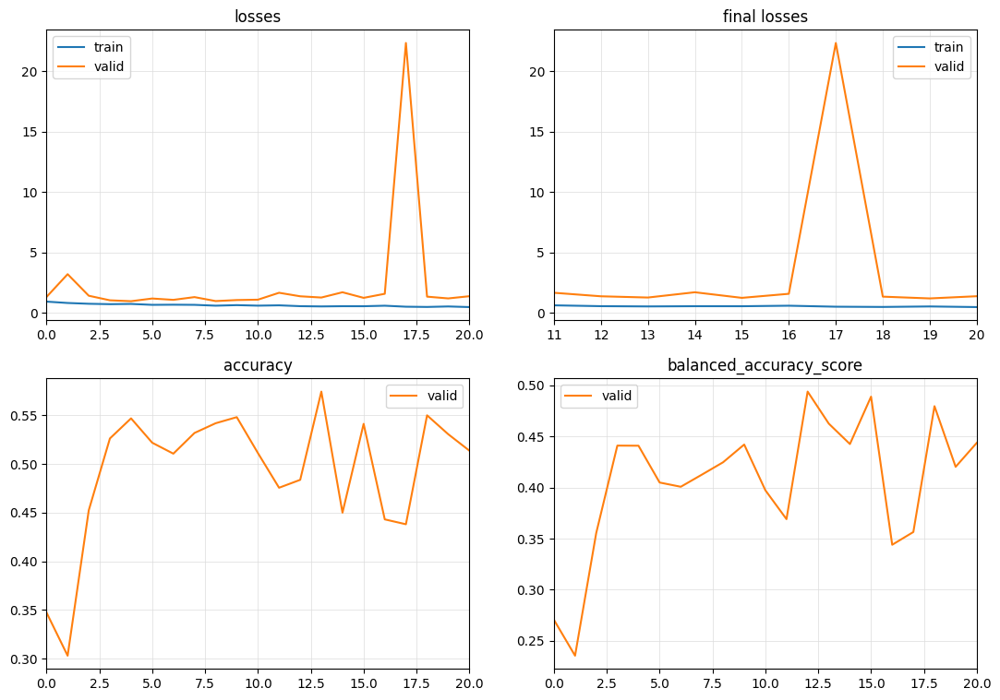

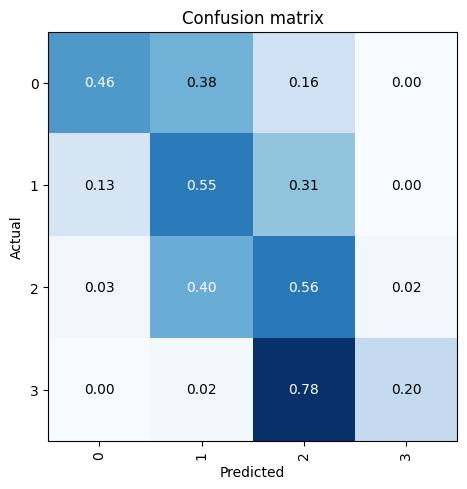

[I 2023-10-13 21:12:15,652] Trial 15 finished with value: 0.4938383827401973 and parameters: {'num_days': 28, 'sample_frac': 0.1, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 28, 'sample_frac': 0.1, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.936721,0.962981,0.492500,0.377360,00:48
1,0.878235,0.996240,0.555000,0.427977,00:48
2,0.833354,0.984526,0.557500,0.429686,00:49
3,0.783194,1.489067,0.481875,0.382033,00:48
4,0.755344,1.266566,0.479375,0.367370,00:48
5,0.654138,1.679275,0.490625,0.383061,00:48
6,0.691035,1.001937,0.535625,0.435620,00:49
7,0.658397,1.093487,0.463750,0.355595,00:49
8,0.598416,1.078982,0.534375,0.422616,00:48
9,0.643658,1.346928,0.488125,0.374630,00:48


No improvement since epoch 2: early stopping


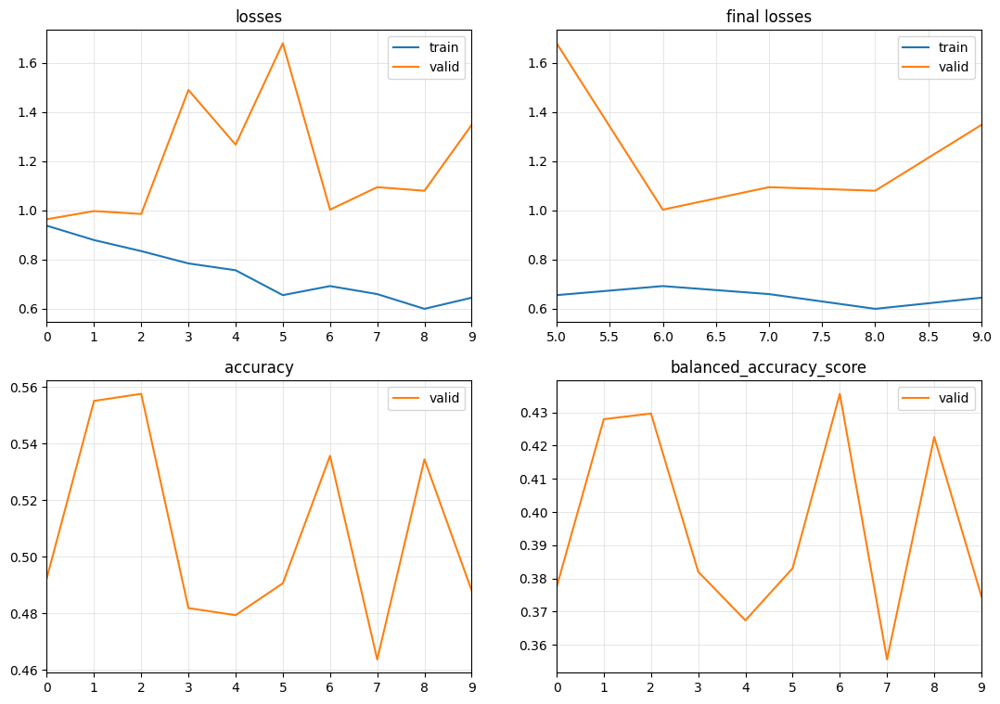

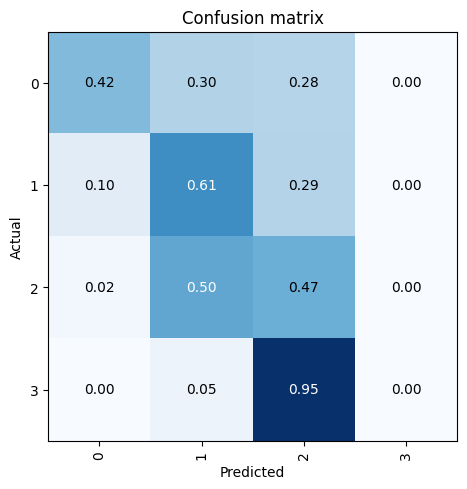

[I 2023-10-13 21:21:00,643] Trial 16 finished with value: 0.4356204121559665 and parameters: {'num_days': 28, 'sample_frac': 0.1, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 28, 'sample_frac': 0.1, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.891829,1.171574,0.488125,0.423473,00:49
1,0.807882,1.884623,0.406875,0.312053,00:49
2,0.793739,1.020363,0.495625,0.375665,00:50
3,0.769740,1.522635,0.447500,0.519930,00:48
4,0.747462,0.943043,0.550625,0.426075,00:48
5,0.713357,1.066427,0.520000,0.402758,00:48
6,0.679742,1.235814,0.523125,0.434036,00:48
7,0.661291,1.350887,0.455625,0.385894,00:48
8,0.657369,1.131622,0.558750,0.444841,00:48
9,0.613144,1.245199,0.525000,0.410796,00:48


No improvement since epoch 13: early stopping


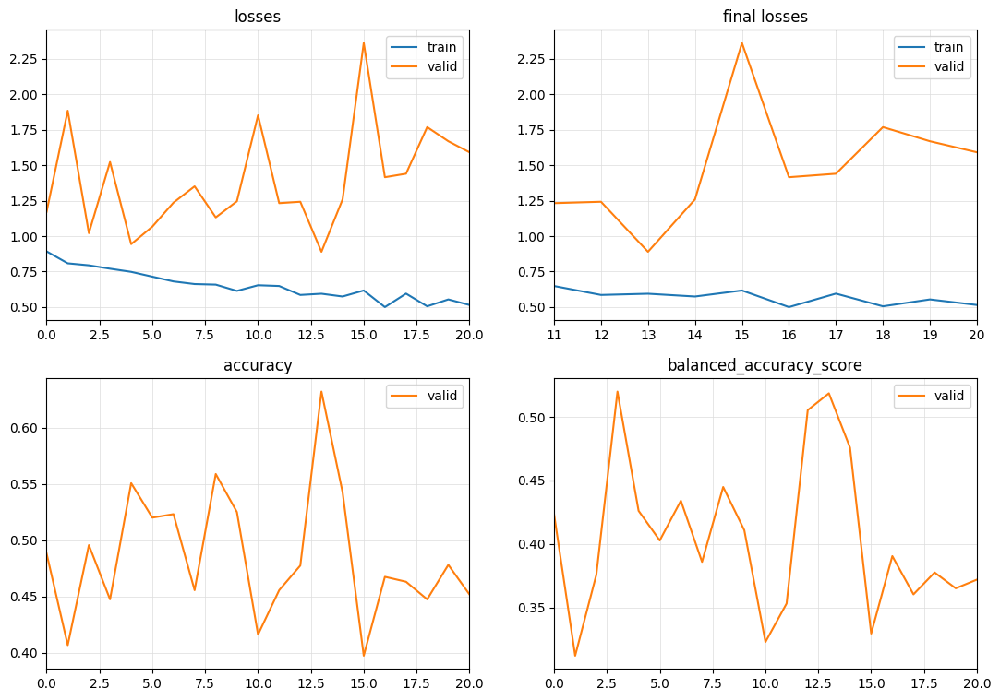

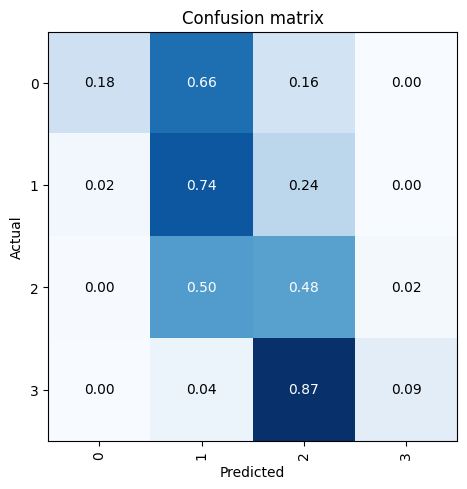

[I 2023-10-13 21:43:54,800] Trial 17 finished with value: 0.5199303369701481 and parameters: {'num_days': 28, 'sample_frac': 0.1, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 17 with value: 0.5199303369701481.


{'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.675197,1.372476,0.485000,0.375242,08:04
1,0.548581,1.445138,0.515938,0.407191,08:05
2,0.487177,1.007564,0.616813,0.530881,08:05
3,0.489789,1.111415,0.526312,0.472788,08:05
4,0.501053,1.704129,0.420312,0.354040,08:05
5,0.483694,1.334645,0.541313,0.456278,08:06
6,0.391924,1.334766,0.516500,0.483754,08:05
7,0.470748,1.123978,0.524750,0.468464,08:05
8,0.416208,1.475392,0.483938,0.422627,08:05
9,0.442738,1.232581,0.495750,0.422079,08:05


No improvement since epoch 2: early stopping


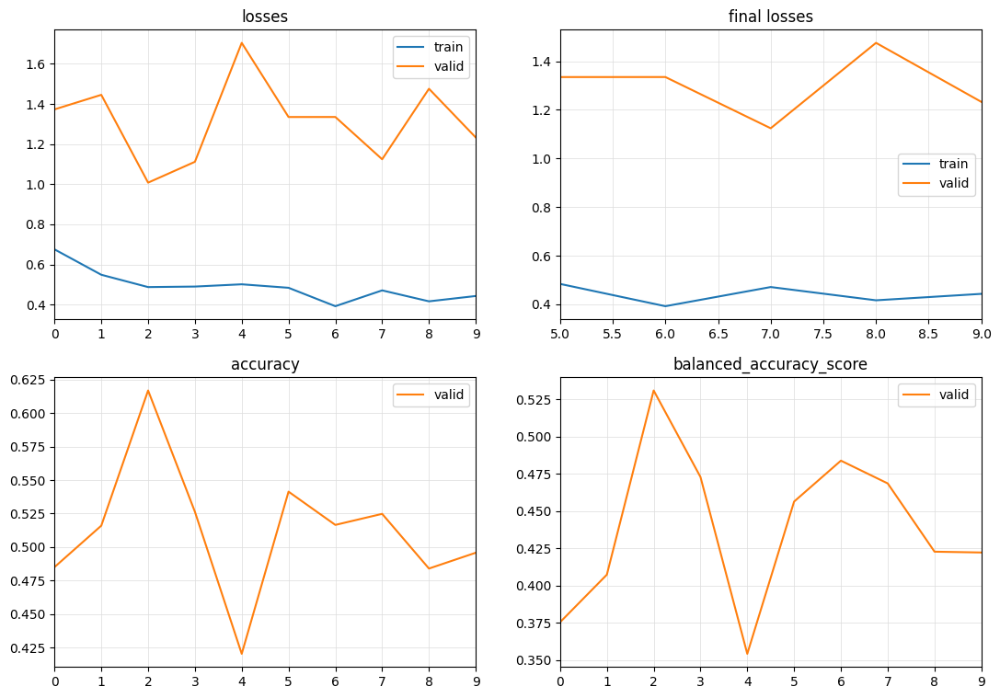

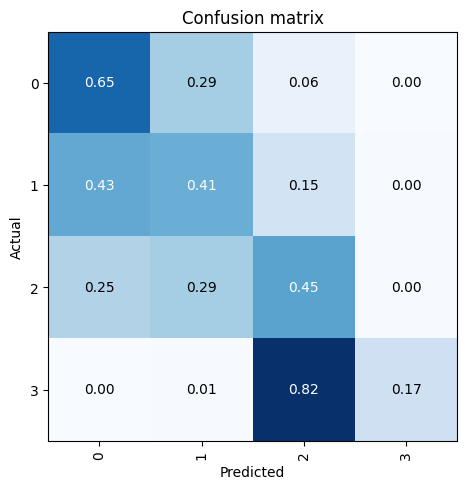

[I 2023-10-13 23:06:08,957] Trial 18 finished with value: 0.5308813818119389 and parameters: {'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 18 with value: 0.5308813818119389.


{'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.669574,1.551786,0.424313,0.356078,08:06
1,0.517892,1.169126,0.493813,0.428798,08:05
2,0.556778,1.142452,0.506000,0.420667,08:06
3,0.456324,1.306745,0.494938,0.428414,08:06
4,0.458438,2.274131,0.374375,0.350013,08:06
5,0.469600,1.357574,0.510188,0.412736,08:07
6,0.459936,1.213863,0.479313,0.407445,08:07
7,0.408826,2.019137,0.420625,0.325829,08:06
8,0.402828,2.188230,0.398625,0.469523,08:06
9,0.416233,2.027326,0.419562,0.369626,08:06


No improvement since epoch 12: early stopping


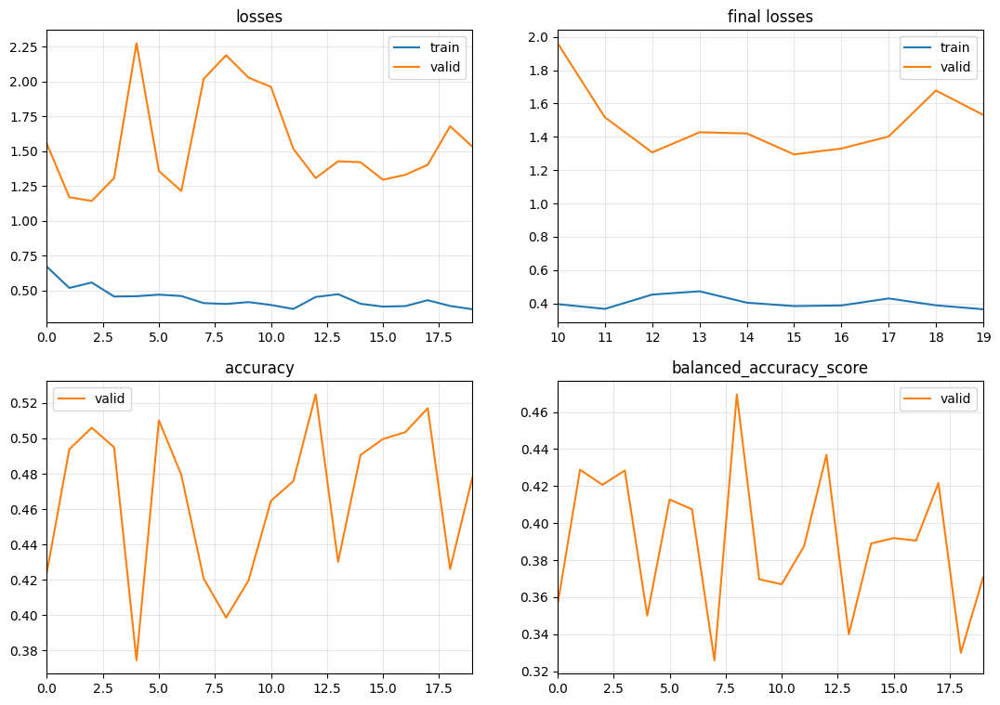

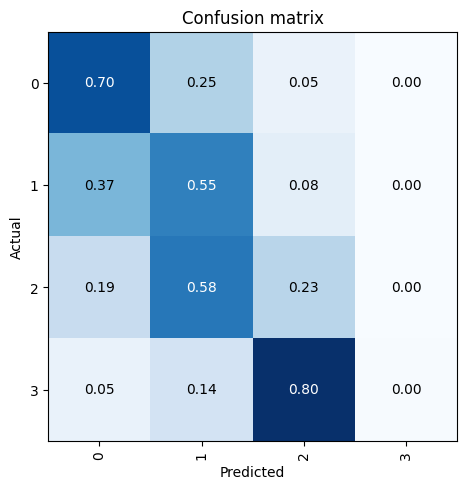

[I 2023-10-14 01:49:40,330] Trial 19 finished with value: 0.46952308981331914 and parameters: {'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 18 with value: 0.5308813818119389.


{'num_days': 84, 'sample_frac': 1.0, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.551790,1.376638,0.510375,0.394184,03:36
1,0.440469,2.389018,0.488250,0.377787,03:36
2,0.386331,4.203073,0.404125,0.465191,03:36
3,0.341304,2.616187,0.470625,0.364391,03:35
4,0.323953,2.242436,0.503500,0.390112,03:35
5,0.296397,2.584800,0.465125,0.378063,03:36
6,0.293138,1.831297,0.468375,0.423303,03:35
7,0.272271,3.650401,0.399250,0.312258,03:37


No improvement since epoch 0: early stopping


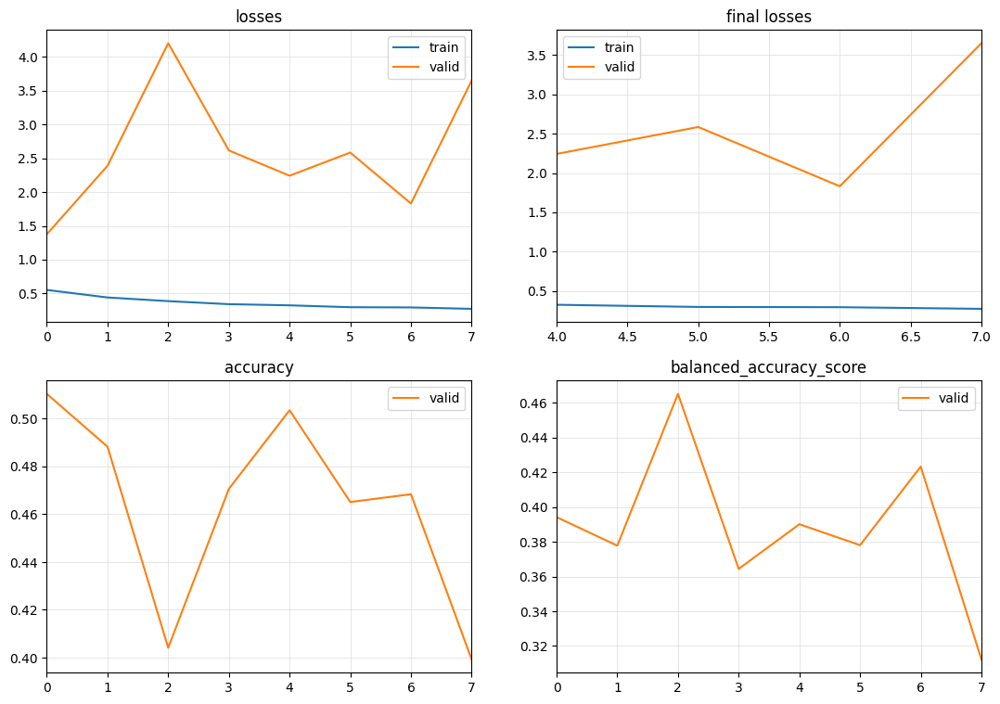

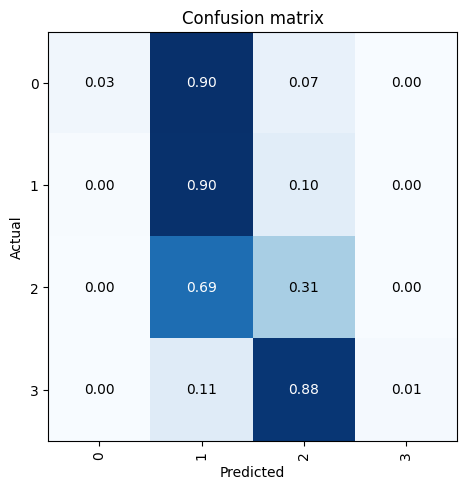

[I 2023-10-14 02:19:21,771] Trial 20 finished with value: 0.4651910113438077 and parameters: {'num_days': 84, 'sample_frac': 1.0, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 18 with value: 0.5308813818119389.


{'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.776526,1.325448,0.436875,0.339795,01:15
1,0.748312,1.052607,0.502500,0.390433,01:16
2,0.705753,1.167653,0.459375,0.364794,01:16
3,0.661400,0.996187,0.551250,0.427617,01:16
4,0.655073,1.064768,0.577187,0.453343,01:16
5,0.628204,1.072332,0.536563,0.424710,01:16
6,0.673730,1.237206,0.523125,0.415604,01:16
7,0.595550,1.173678,0.535625,0.434670,01:16
8,0.576442,1.054623,0.539688,0.447852,01:16
9,0.582382,1.248135,0.484688,0.398943,01:16


No improvement since epoch 4: early stopping


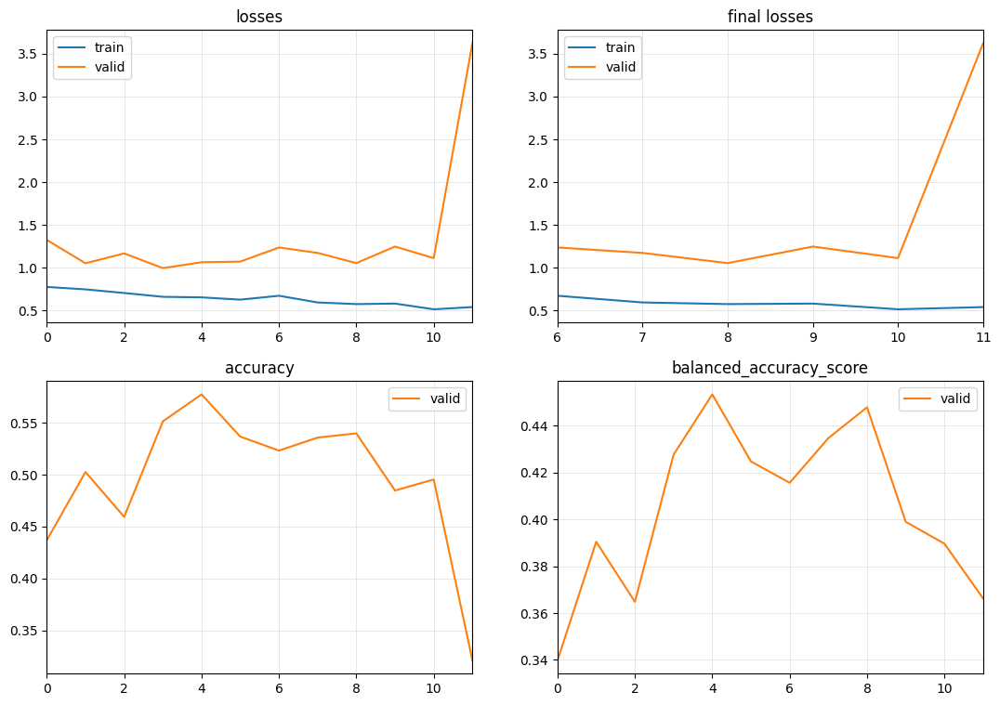

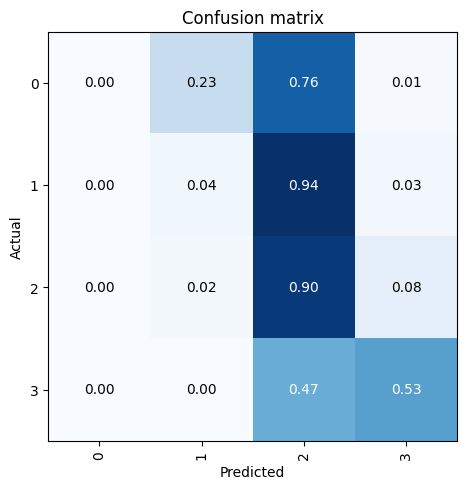

[I 2023-10-14 02:35:19,938] Trial 21 finished with value: 0.45334252938419606 and parameters: {'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 18 with value: 0.5308813818119389.


{'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.821929,0.929345,0.568438,0.447481,01:36
1,0.772626,1.242643,0.476875,0.372107,01:37
2,0.762840,1.563721,0.371875,0.288825,01:36
3,0.668325,1.145349,0.463125,0.361857,01:36
4,0.657649,1.436101,0.484062,0.369805,01:36
5,0.673354,1.190067,0.518438,0.446371,01:37
6,0.601127,2.026989,0.454375,0.352554,01:37
7,0.585542,1.226639,0.494687,0.382661,01:37


No improvement since epoch 0: early stopping


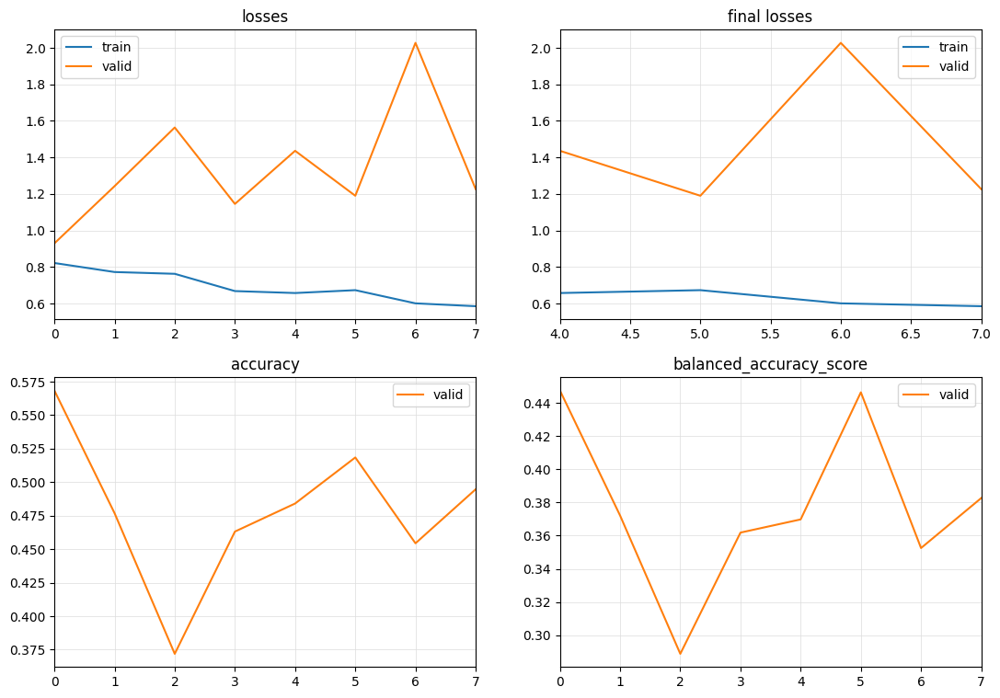

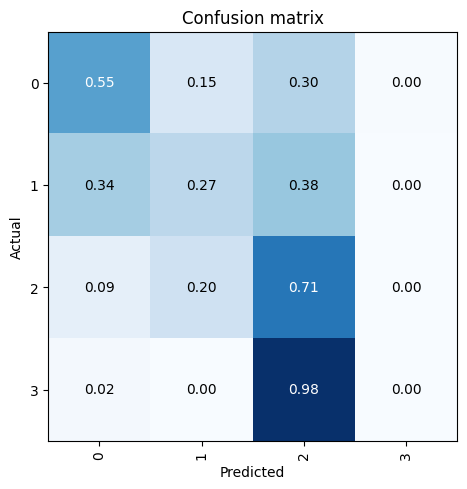

[I 2023-10-14 02:48:55,890] Trial 22 finished with value: 0.4474806008967056 and parameters: {'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 18 with value: 0.5308813818119389.


{'num_days': 28, 'sample_frac': 0.4, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.809581,1.294747,0.392188,0.307658,02:32
1,0.735585,1.385802,0.508906,0.392165,02:32
2,0.642506,1.046281,0.545937,0.543746,02:32
3,0.672149,1.255288,0.471719,0.364061,02:33
4,0.602402,1.353241,0.477344,0.380235,02:33
5,0.578316,1.145679,0.534688,0.516563,02:33
6,0.551081,1.083539,0.553906,0.589089,02:33
7,0.516264,1.780217,0.501094,0.387899,02:32
8,0.482580,1.866003,0.462969,0.365285,02:33
9,0.498984,1.490939,0.478125,0.419149,02:32


No improvement since epoch 6: early stopping


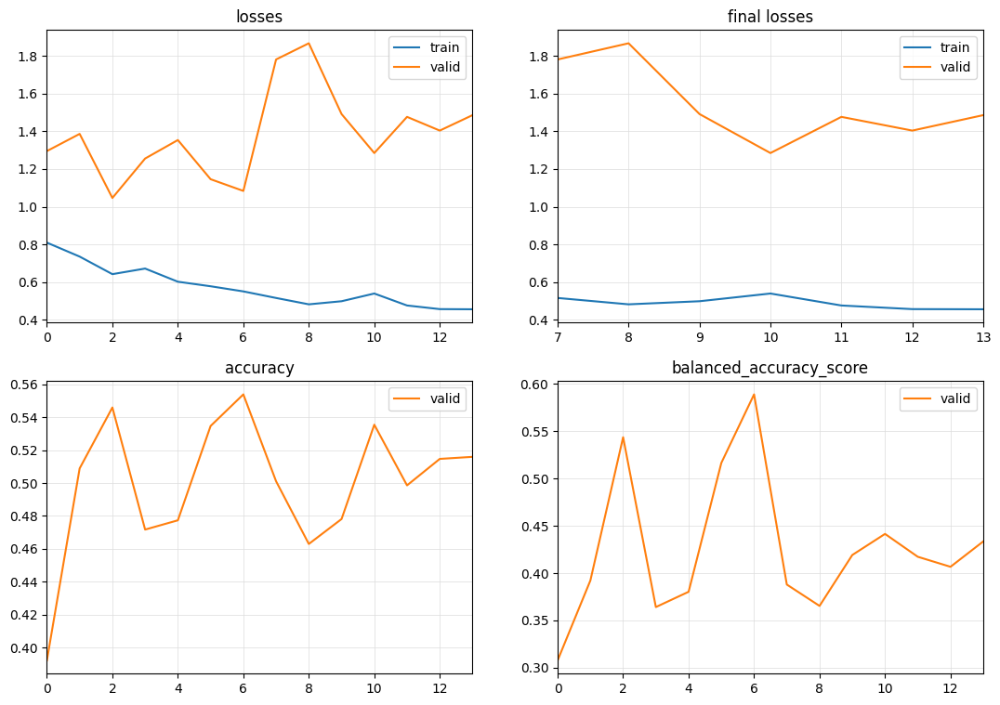

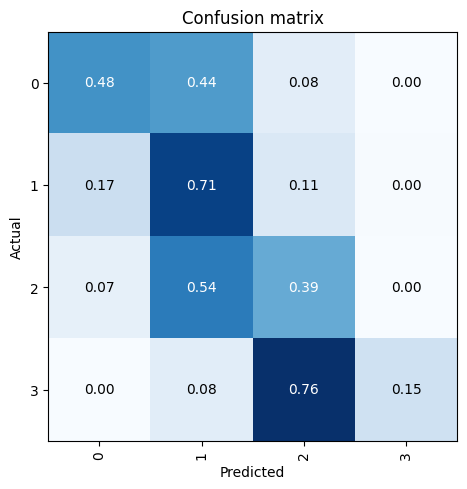

[I 2023-10-14 03:25:27,980] Trial 23 finished with value: 0.5890887407459792 and parameters: {'num_days': 28, 'sample_frac': 0.4, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 56, 'sample_frac': 0.6, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.699280,1.293043,0.481458,0.411093,04:50
1,0.607223,1.123829,0.531563,0.448647,04:50
2,0.504663,1.265625,0.480729,0.379447,04:50
3,0.391857,1.283110,0.458958,0.363677,04:50
4,0.370807,1.413833,0.496146,0.408534,04:50
5,0.310652,1.637029,0.497917,0.397424,04:50
6,0.319347,1.572995,0.493125,0.386931,04:50
7,0.266034,1.732772,0.474479,0.381122,04:50
8,0.254806,1.725747,0.471250,0.368137,04:50


No improvement since epoch 1: early stopping


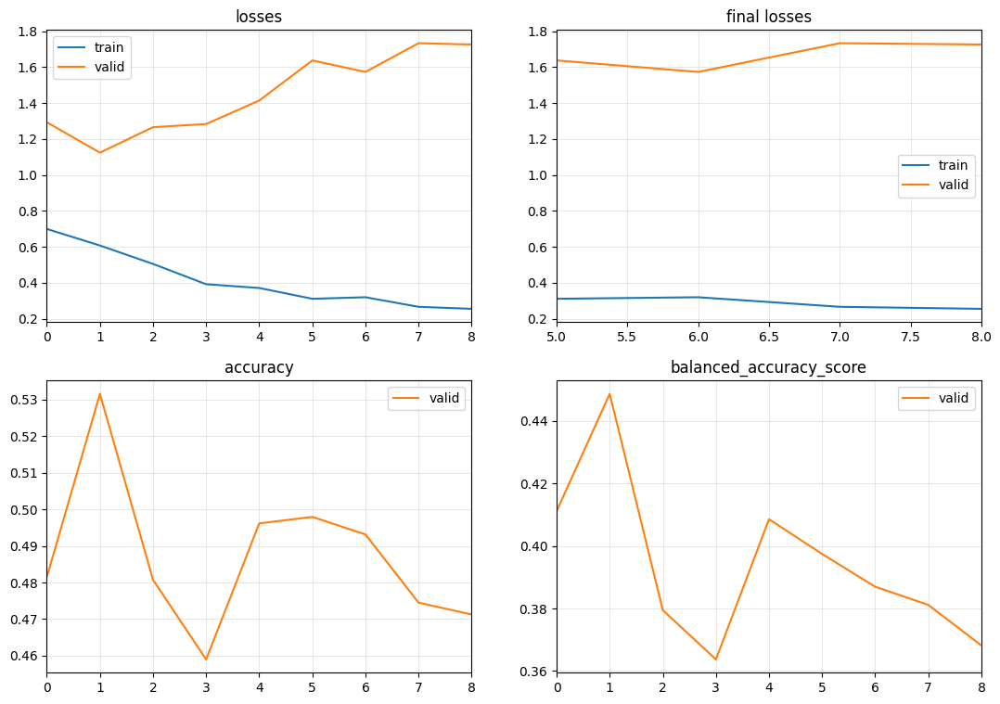

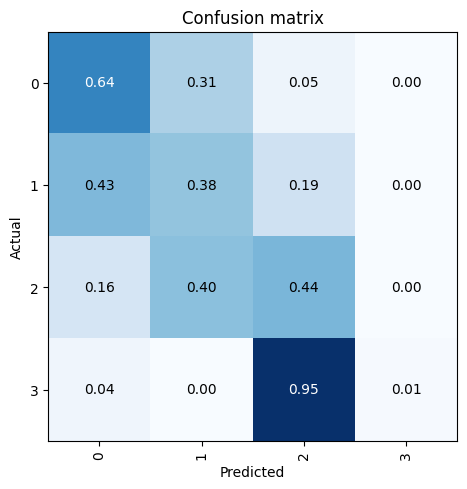

[I 2023-10-14 04:10:03,293] Trial 24 finished with value: 0.4486473836018464 and parameters: {'num_days': 56, 'sample_frac': 0.6, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.4, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.745827,1.756324,0.428438,0.338520,02:33
1,0.668291,0.952187,0.585469,0.481052,02:32
2,0.667539,1.414851,0.420625,0.432010,02:33
3,0.616790,1.035616,0.547031,0.435702,02:32
4,0.518277,0.999484,0.571563,0.451809,02:32
5,0.583685,1.549361,0.401250,0.317104,02:32
6,0.526030,1.473920,0.404687,0.321461,02:32
7,0.477763,1.601532,0.448594,0.346139,02:33
8,0.485250,1.933020,0.436719,0.335777,02:32


No improvement since epoch 1: early stopping


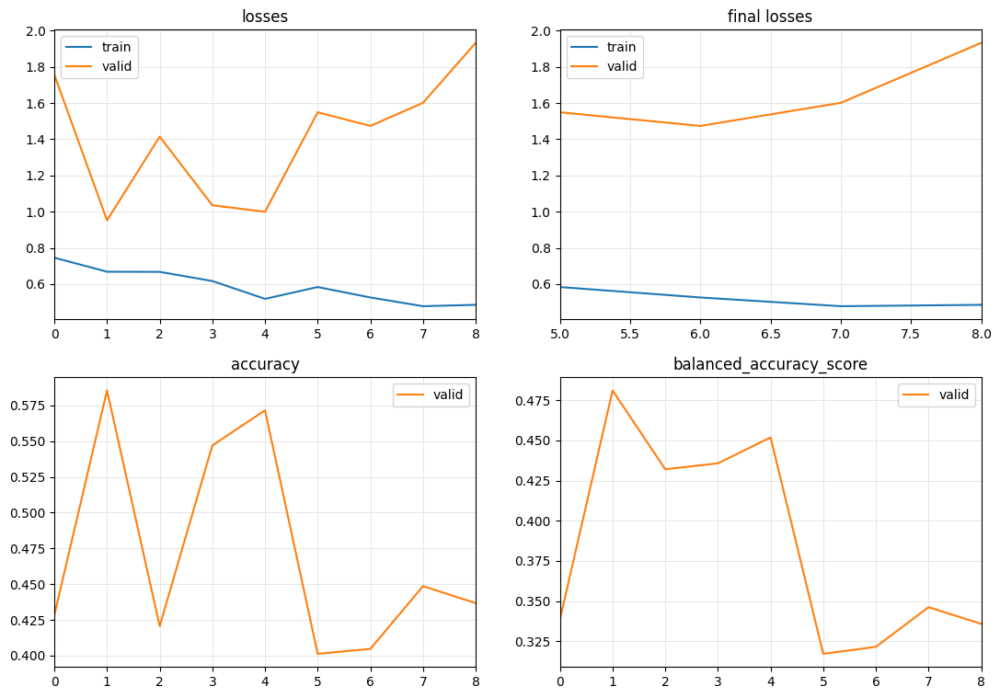

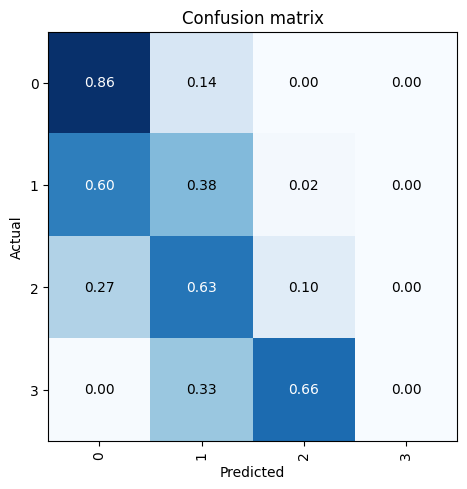

[I 2023-10-14 04:33:45,758] Trial 25 finished with value: 0.4810521236532234 and parameters: {'num_days': 28, 'sample_frac': 0.4, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.660569,1.608714,0.464028,0.416576,07:14
1,0.552917,1.092399,0.545278,0.422078,07:16
2,0.551525,1.784804,0.514306,0.397741,07:17
3,0.469587,1.289052,0.494444,0.396830,07:16
4,0.469412,1.438120,0.484028,0.525084,07:17
5,0.454709,1.376403,0.474861,0.470780,07:16
6,0.436898,1.179729,0.534861,0.510904,07:17
7,0.441364,1.445978,0.484861,0.498807,07:18
8,0.434734,1.706239,0.438264,0.348855,07:17


No improvement since epoch 1: early stopping


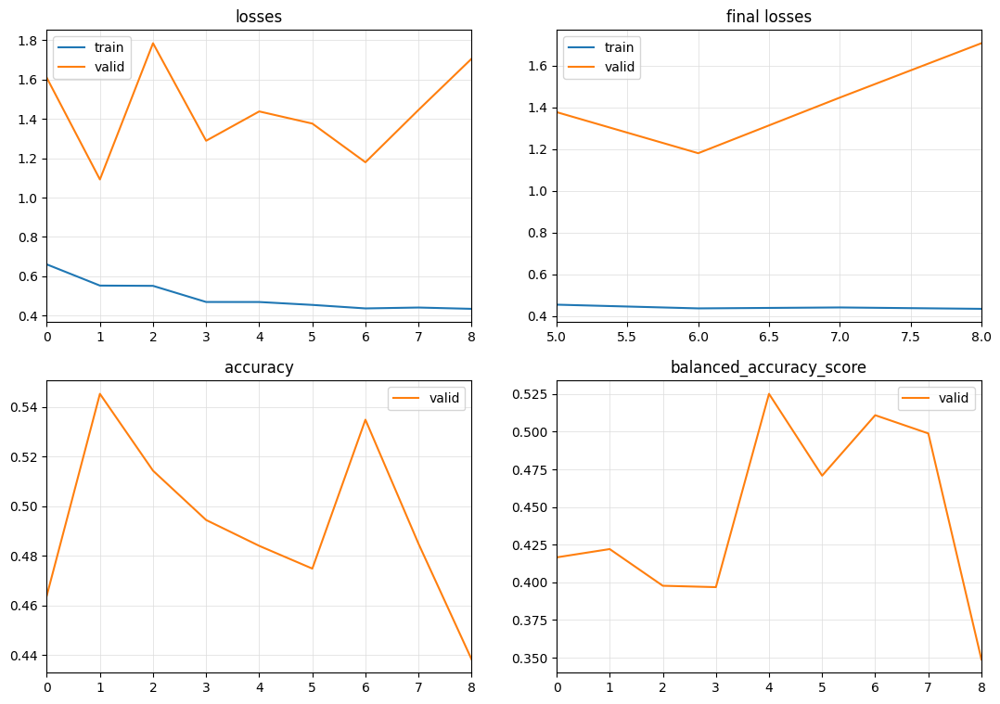

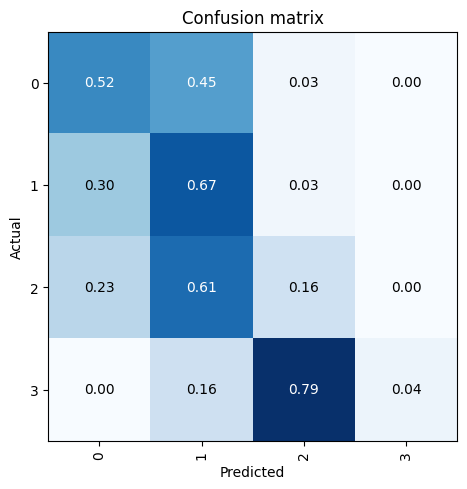

[I 2023-10-14 05:40:34,317] Trial 26 finished with value: 0.5250844472588974 and parameters: {'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.687100,1.472027,0.436250,0.343207,05:44
1,0.585243,1.378956,0.448333,0.394085,05:46
2,0.495883,1.369892,0.440417,0.396832,05:46
3,0.519452,1.796381,0.463472,0.359440,05:48
4,0.459588,1.577279,0.483056,0.375634,05:45
5,0.448939,2.080219,0.396597,0.332241,05:46
6,0.420937,1.942301,0.426458,0.329741,05:46
7,0.484125,1.573647,0.478958,0.395354,05:49
8,0.388081,2.340513,0.429444,0.332109,05:46
9,0.441305,1.371371,0.442500,0.374469,05:55


No improvement since epoch 4: early stopping


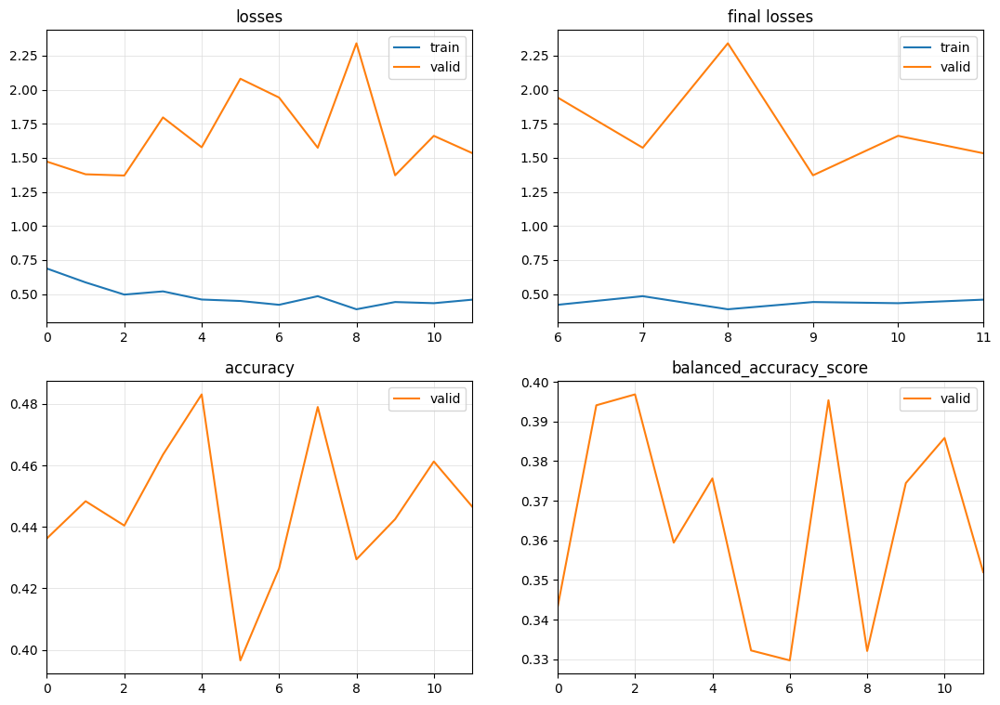

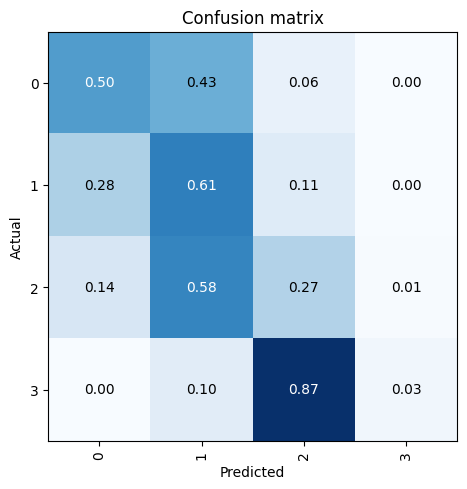

[I 2023-10-14 06:51:14,681] Trial 27 finished with value: 0.3968322237602898 and parameters: {'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.9, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.606518,3.214010,0.350764,0.281027,03:15
1,0.449459,4.588808,0.334722,0.450328,03:14
2,0.381914,3.972958,0.389444,0.372279,03:14
3,0.350161,1.676620,0.446597,0.361429,03:14
4,0.308885,2.277123,0.437778,0.349220,03:14
5,0.296698,3.063292,0.419861,0.330799,03:14
6,0.269726,1.927681,0.477083,0.410190,03:14
7,0.255067,2.063555,0.448681,0.361406,03:14
8,0.245403,3.189106,0.424514,0.395766,03:14
9,0.243649,2.208785,0.442083,0.397448,03:19


No improvement since epoch 6: early stopping


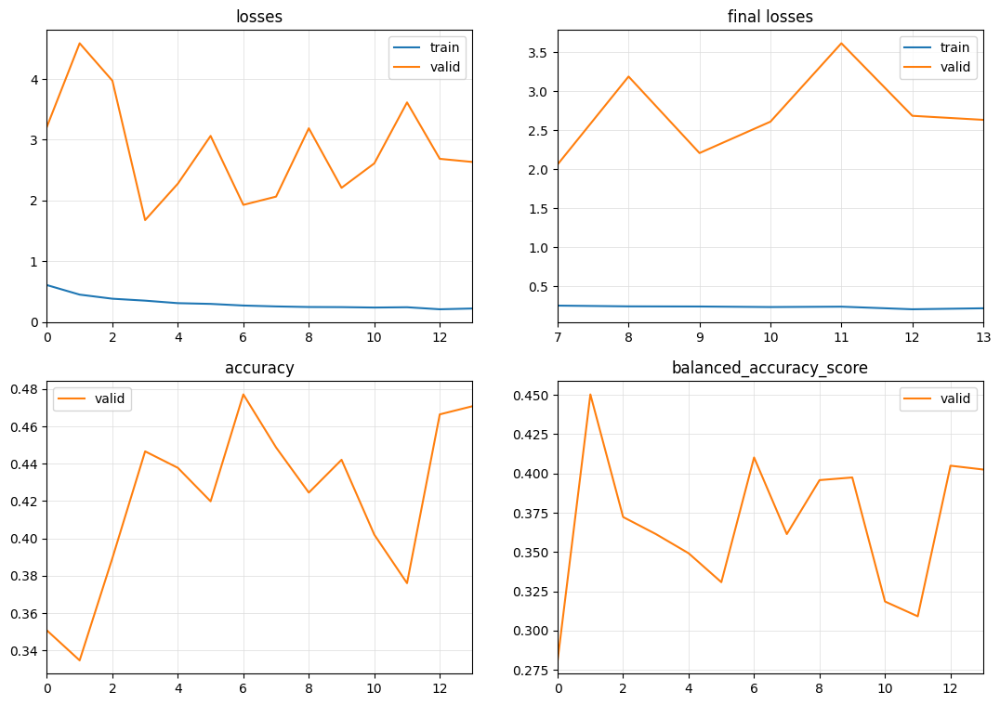

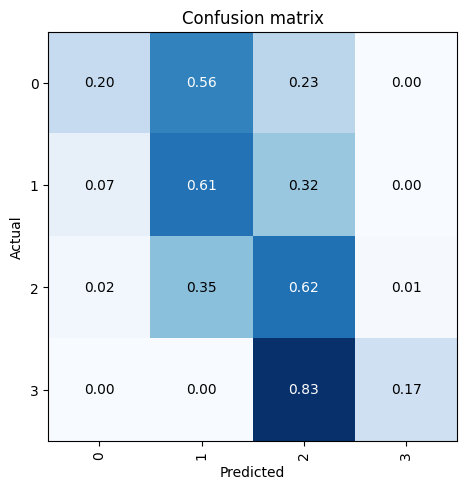

[I 2023-10-14 07:37:47,780] Trial 28 finished with value: 0.45032755175312 and parameters: {'num_days': 28, 'sample_frac': 0.9, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 84, 'sample_frac': 0.9, 'batch_size': 128, 'itp_depth': 6, 'learning_rate': 0.001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.537156,1.273889,0.449861,0.378946,01:38
1,0.389306,2.324756,0.397500,0.417668,01:38
2,0.326407,1.820788,0.497639,0.388350,01:38
3,0.280216,2.313534,0.400556,0.310158,01:38
4,0.264552,2.332558,0.457014,0.355174,01:38
5,0.234829,2.756741,0.391944,0.308838,01:38
6,0.217358,2.710199,0.450556,0.349843,01:38
7,0.203445,2.436218,0.451042,0.357625,01:38
8,0.187836,2.605871,0.417500,0.322923,01:38
9,0.180507,4.151682,0.362083,0.282803,01:38


No improvement since epoch 2: early stopping


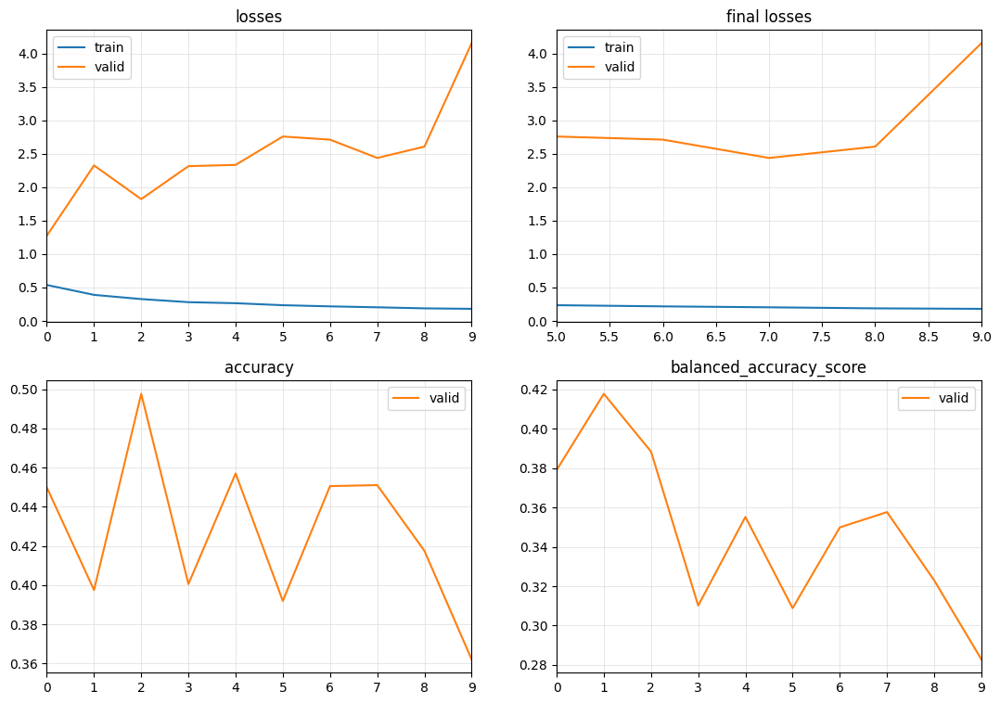

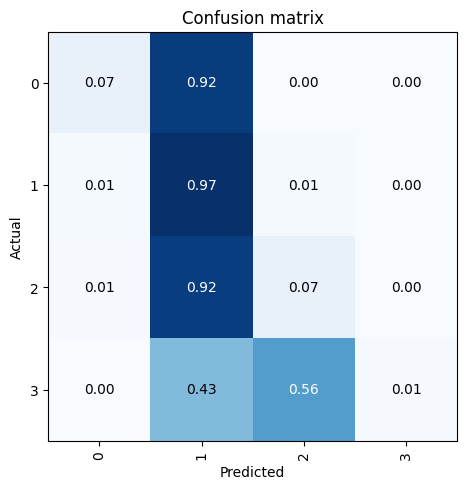

[I 2023-10-14 07:54:57,014] Trial 29 finished with value: 0.41766788217583345 and parameters: {'num_days': 84, 'sample_frac': 0.9, 'batch_size': 128, 'itp_depth': 6, 'learning_rate': 0.001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 56, 'sample_frac': 0.6, 'batch_size': 128, 'itp_depth': 12, 'learning_rate': 0.001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.578992,1.701065,0.467396,0.464229,02:00
1,0.446426,1.454042,0.422812,0.343328,02:00
2,0.381641,2.417127,0.482812,0.504110,02:00
3,0.330772,2.082296,0.389479,0.308846,02:00
4,0.291955,2.458016,0.490208,0.397850,02:00
5,0.267082,2.233756,0.426667,0.380512,02:00
6,0.236110,1.903302,0.465625,0.363829,02:00
7,0.221758,2.710974,0.405104,0.360613,02:00
8,0.212027,4.254533,0.387396,0.303789,02:00
9,0.195410,2.694497,0.422188,0.327477,02:00


No improvement since epoch 4: early stopping


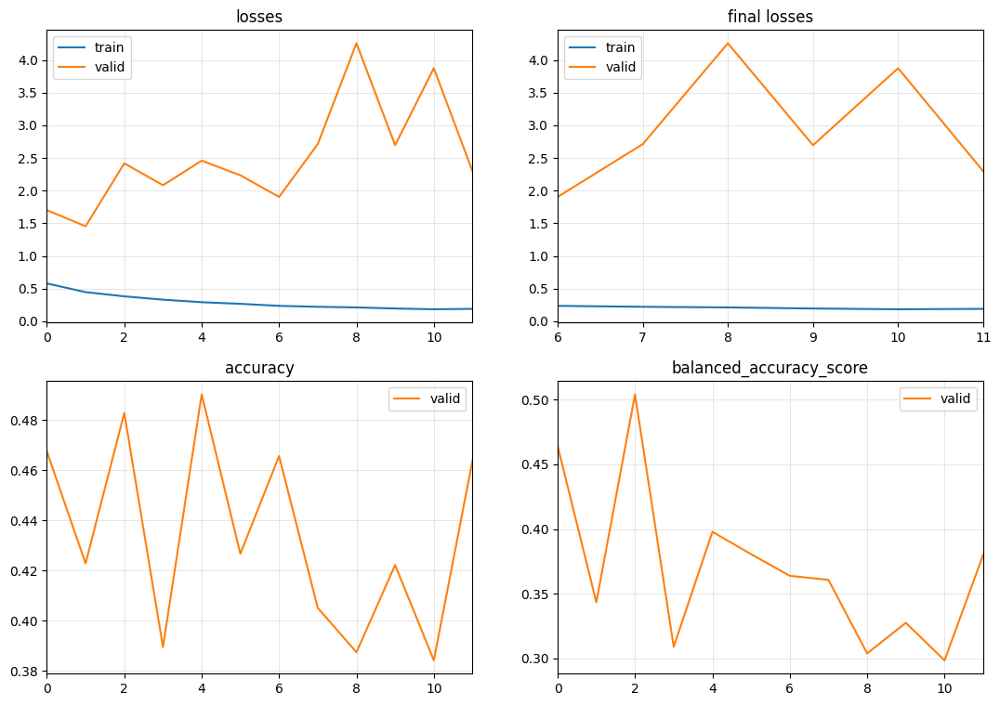

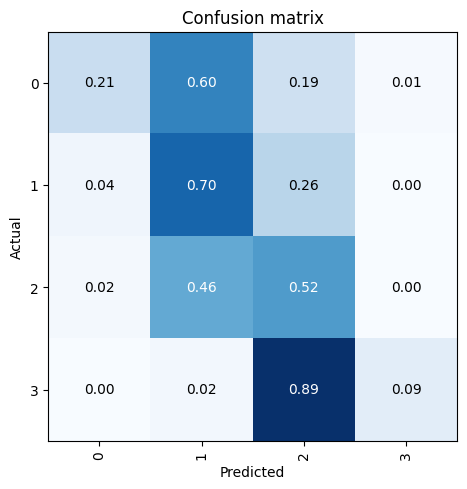

[I 2023-10-14 08:19:59,420] Trial 30 finished with value: 0.5041097946216648 and parameters: {'num_days': 56, 'sample_frac': 0.6, 'batch_size': 128, 'itp_depth': 12, 'learning_rate': 0.001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.639378,1.642076,0.466812,0.401009,08:06
1,0.535094,1.860491,0.409312,0.347646,08:06
2,0.501709,1.719250,0.505063,0.401474,08:06
3,0.451744,5.542218,0.427812,0.332617,08:06
4,0.505356,1.963423,0.466000,0.452601,08:19
5,0.470429,2.255895,0.438250,0.339499,08:06
6,0.399788,1.159148,0.531500,0.431319,08:06
7,0.466708,1.585388,0.414375,0.351962,08:06
8,0.420382,1.396757,0.463250,0.358518,08:07
9,0.434867,1.416301,0.480437,0.415177,08:07


No improvement since epoch 6: early stopping


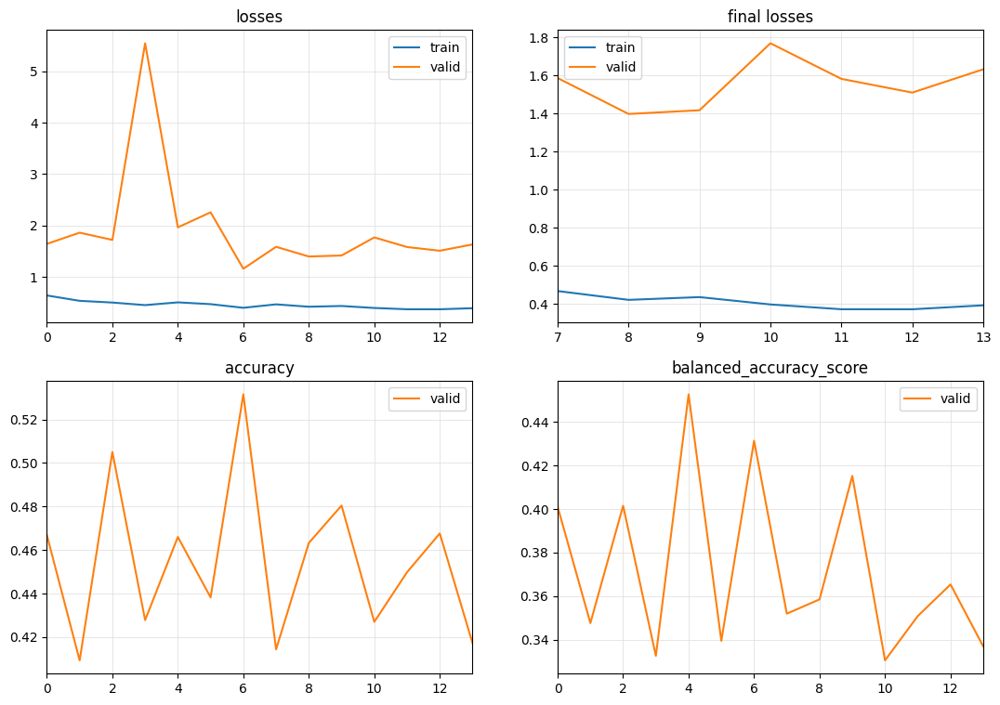

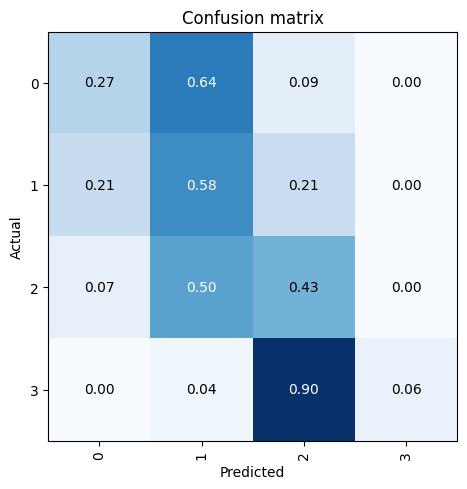

[I 2023-10-14 10:15:22,300] Trial 31 finished with value: 0.4526013593110102 and parameters: {'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.746221,1.138533,0.542708,0.482692,07:14
1,0.637722,1.304577,0.473403,0.450701,07:16
2,0.521392,3.100133,0.334097,0.257835,07:17
3,0.472575,13.384669,0.432986,0.395022,07:36
4,0.451832,1.183923,0.498056,0.405672,07:21
5,0.461198,1.532935,0.464167,0.363215,07:30
6,0.454315,1.959799,0.391181,0.302666,07:17
7,0.461624,2.310212,0.359306,0.277463,07:18


No improvement since epoch 0: early stopping


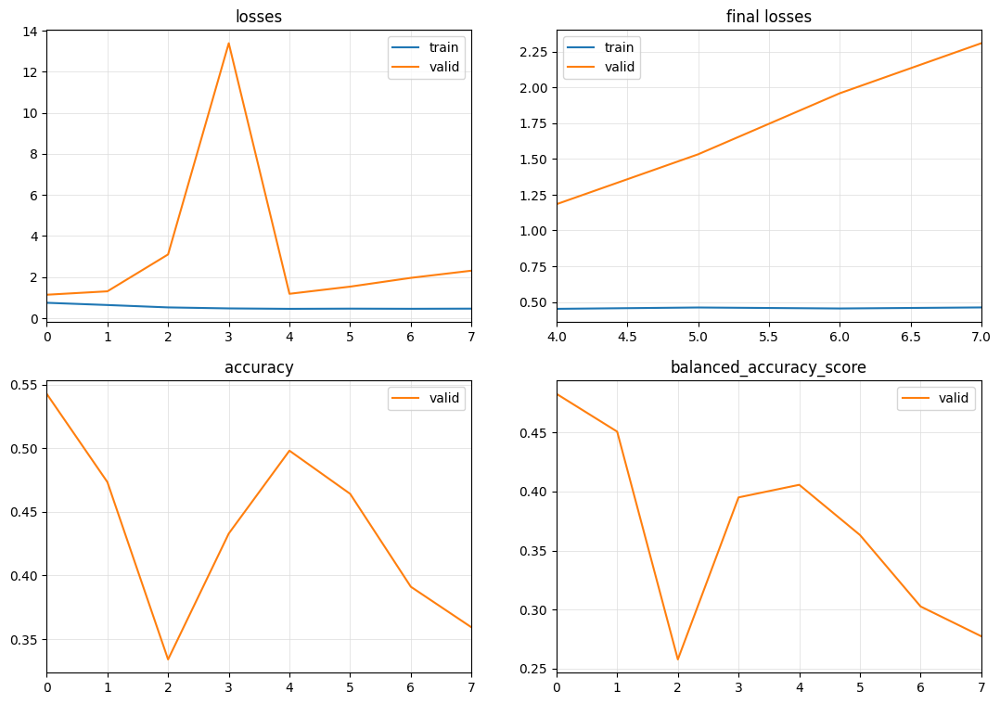

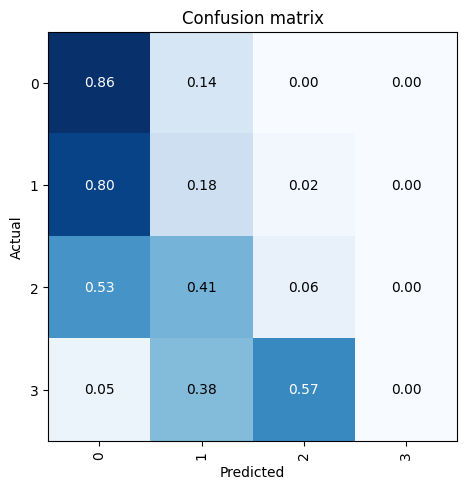

[I 2023-10-14 11:20:48,630] Trial 32 finished with value: 0.48269196608029563 and parameters: {'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.688848,1.185557,0.474922,0.370730,05:19
1,0.615813,1.500170,0.482031,0.374117,05:08
2,0.568484,1.165060,0.510156,0.501949,05:07
3,0.527858,1.542755,0.390391,0.303115,05:07
4,0.473343,1.375625,0.508828,0.438184,05:07
5,0.480435,1.945423,0.447031,0.390855,05:07
6,0.414812,1.518783,0.466016,0.408490,05:08
7,0.441908,2.415492,0.432266,0.334135,05:07
8,0.384737,1.294386,0.487031,0.398231,05:08
9,0.429110,1.724146,0.438281,0.352519,05:08


No improvement since epoch 2: early stopping


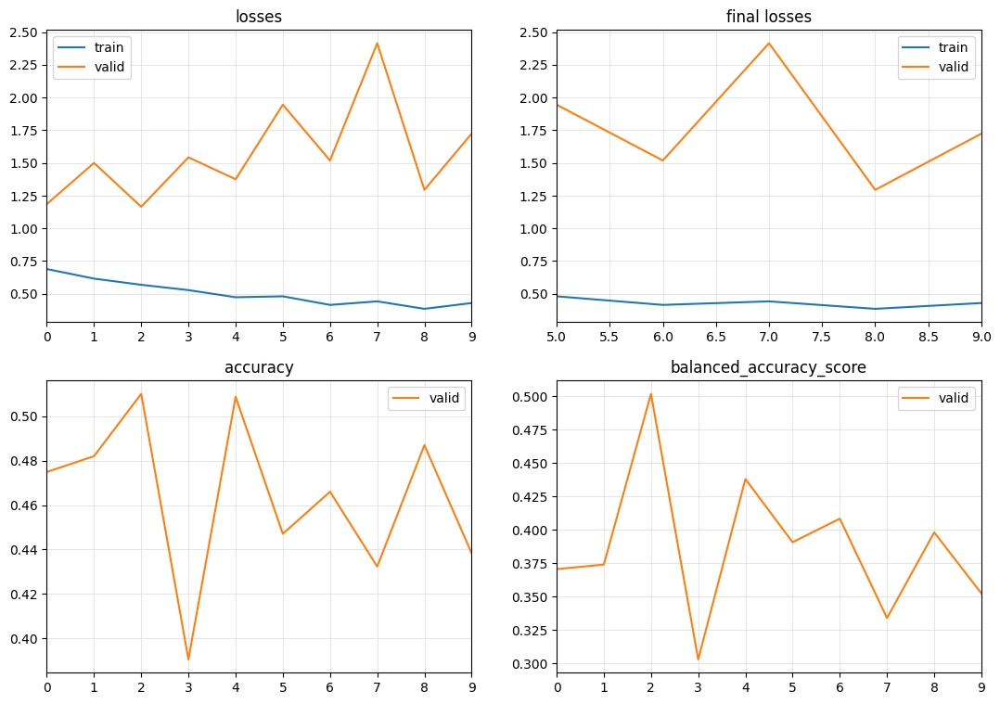

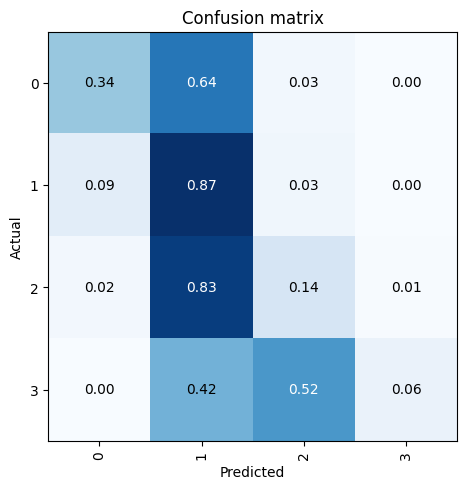

[I 2023-10-14 12:13:25,005] Trial 33 finished with value: 0.501948769014084 and parameters: {'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.4, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.615956,1.211466,0.476562,0.372582,03:14
1,0.438721,1.366973,0.473594,0.388504,03:14
2,0.395548,1.549428,0.409375,0.353328,03:14
3,0.382579,1.844641,0.405469,0.333808,03:14
4,0.316408,1.965955,0.380156,0.298664,03:15
5,0.276084,1.866434,0.385156,0.344869,03:14
6,0.270181,2.342125,0.412656,0.329059,03:14
7,0.236124,2.067000,0.366562,0.302754,03:19


No improvement since epoch 0: early stopping


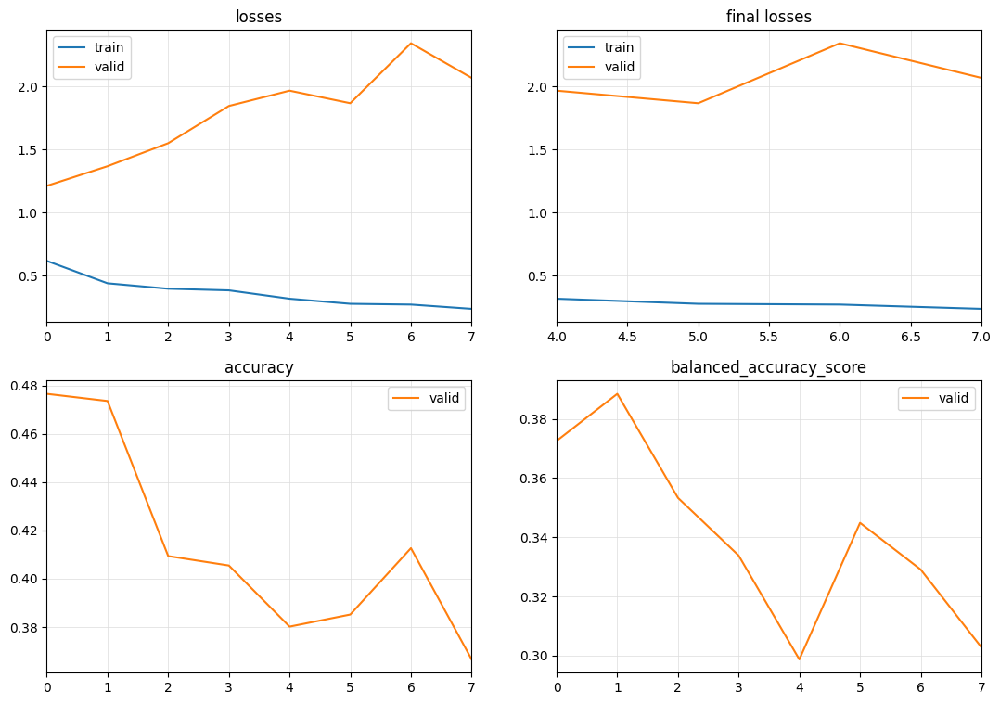

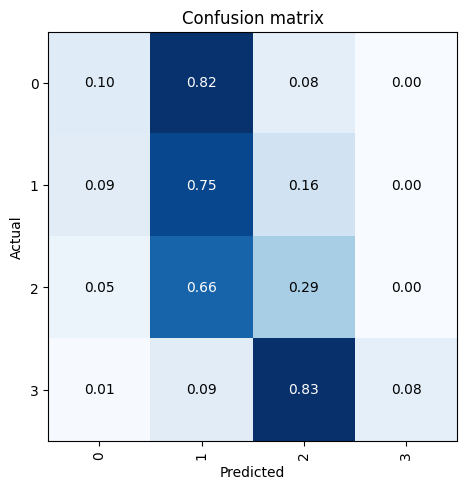

[I 2023-10-14 12:40:18,519] Trial 34 finished with value: 0.3885044347160893 and parameters: {'num_days': 28, 'sample_frac': 0.4, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.0001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.684360,1.833385,0.493203,0.579958,05:20
1,0.621002,0.955931,0.567187,0.439818,05:08
2,0.535637,1.144529,0.504922,0.433694,05:08
3,0.513243,1.102937,0.541016,0.533174,05:08
4,0.501637,1.457891,0.446094,0.381978,05:08
5,0.462914,1.424772,0.454922,0.377334,05:07
6,0.442900,1.165732,0.495391,0.432538,05:08
7,0.465059,2.081792,0.361406,0.293332,05:08
8,0.449271,1.531609,0.446484,0.355378,05:08


No improvement since epoch 1: early stopping


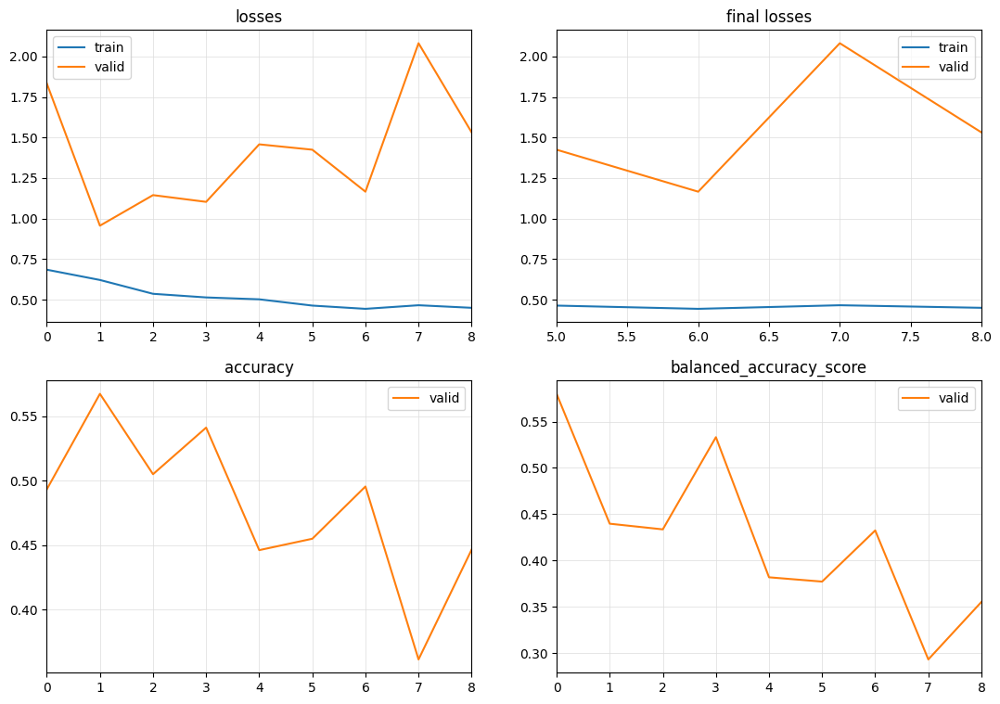

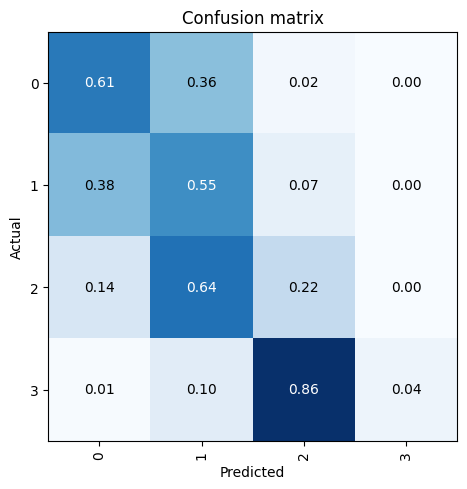

[I 2023-10-14 13:27:50,844] Trial 35 finished with value: 0.5799579944979235 and parameters: {'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 14, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.669161,2.315776,0.354453,0.277673,05:05
1,0.659025,1.154771,0.520156,0.403306,05:07
2,0.536119,1.376918,0.464531,0.367747,05:08
3,0.507401,1.102879,0.578672,0.468386,05:07
4,0.509197,2.206326,0.410156,0.317193,05:07
5,0.474091,1.906442,0.416484,0.347748,05:09
6,0.447786,1.608994,0.445703,0.380790,05:09
7,0.441447,2.224702,0.408984,0.447692,05:08
8,0.400731,1.192588,0.534609,0.425923,05:08
9,0.414492,1.230440,0.502266,0.406400,05:08


No improvement since epoch 3: early stopping


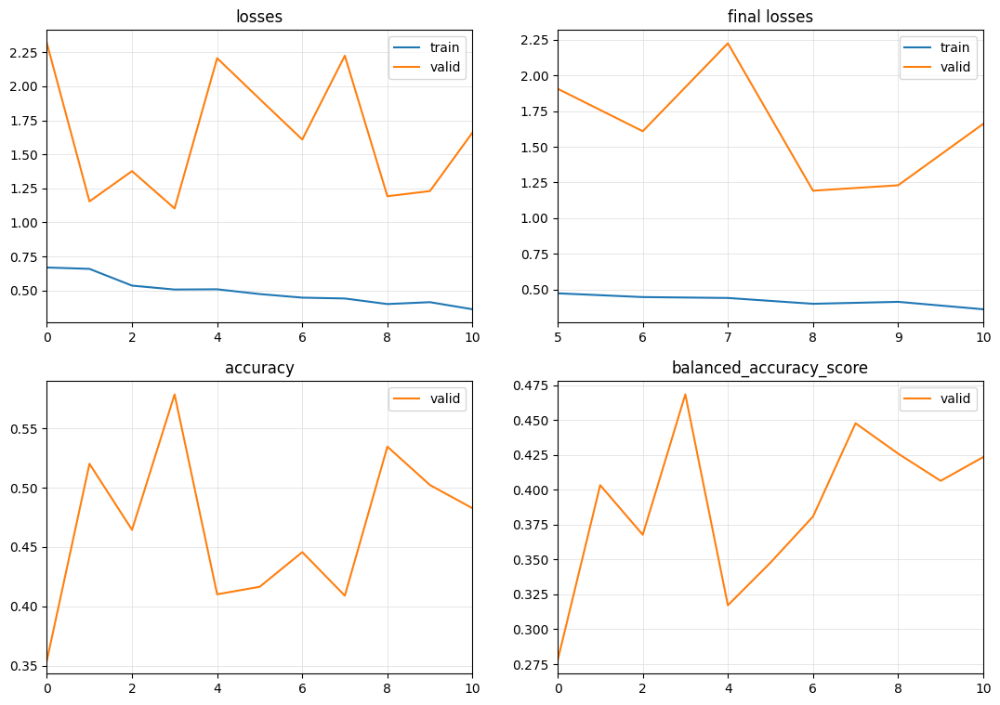

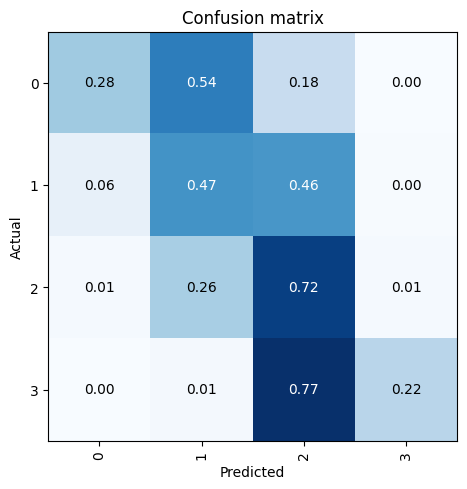

[I 2023-10-14 14:25:26,915] Trial 36 finished with value: 0.4683860648652234 and parameters: {'num_days': 14, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.7000000000000001, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.481509,1.457073,0.453125,0.351415,02:17
1,0.375410,1.857792,0.404464,0.316600,02:17
2,0.301113,1.595062,0.436250,0.338076,02:17
3,0.261611,2.258198,0.416429,0.324745,02:18
4,0.237150,2.217768,0.439018,0.340716,02:18
5,0.217889,1.778673,0.469286,0.364831,02:17
6,0.187773,1.847277,0.458839,0.367961,02:18
7,0.182140,2.326582,0.432679,0.341604,02:18
8,0.168913,2.677042,0.418036,0.324699,02:26
9,0.162426,2.302716,0.431964,0.335278,02:28


No improvement since epoch 5: early stopping


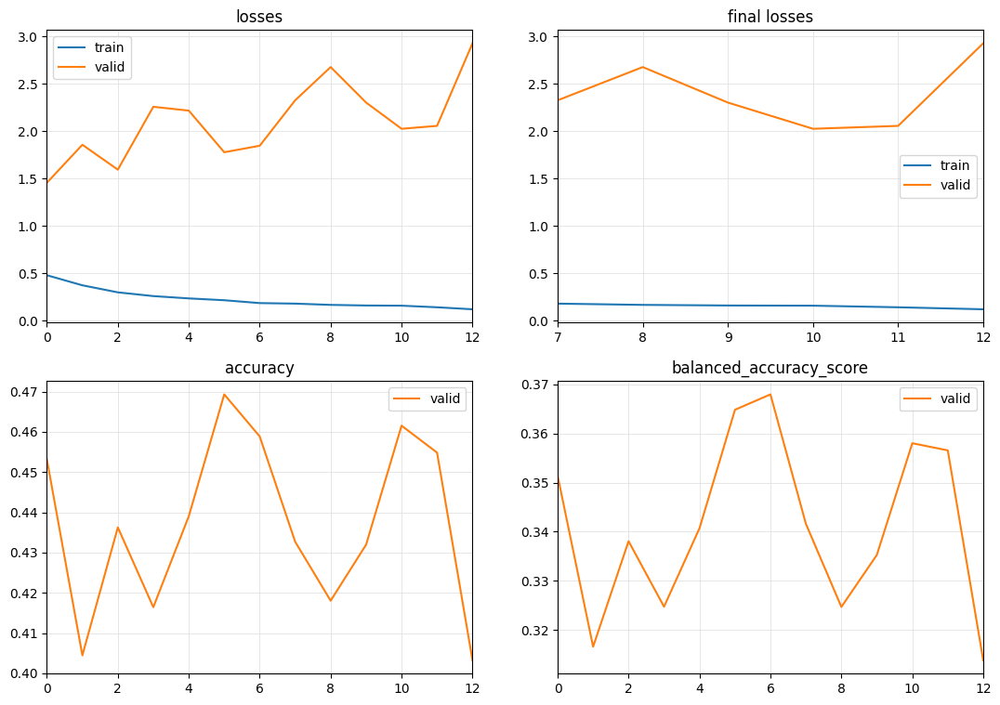

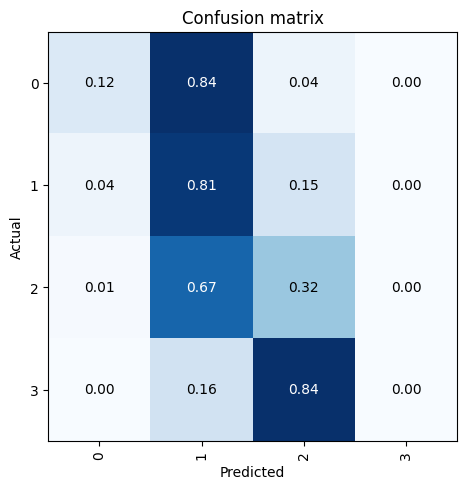

[I 2023-10-14 14:56:29,990] Trial 37 finished with value: 0.36796136281443287 and parameters: {'num_days': 28, 'sample_frac': 0.7000000000000001, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.0001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.706567,1.157167,0.501188,0.389684,04:42
1,0.594922,1.124515,0.537125,0.433020,04:43
2,0.527012,1.504062,0.464875,0.376306,04:42
3,0.475781,2.444412,0.354250,0.273652,04:44
4,0.437006,1.781060,0.420500,0.325273,04:44
5,0.466738,1.486202,0.438937,0.339438,04:43
6,0.394207,1.503452,0.440437,0.386639,04:44
7,0.429317,1.587357,0.389000,0.300862,04:43
8,0.392469,1.618490,0.468188,0.362928,04:43


No improvement since epoch 1: early stopping


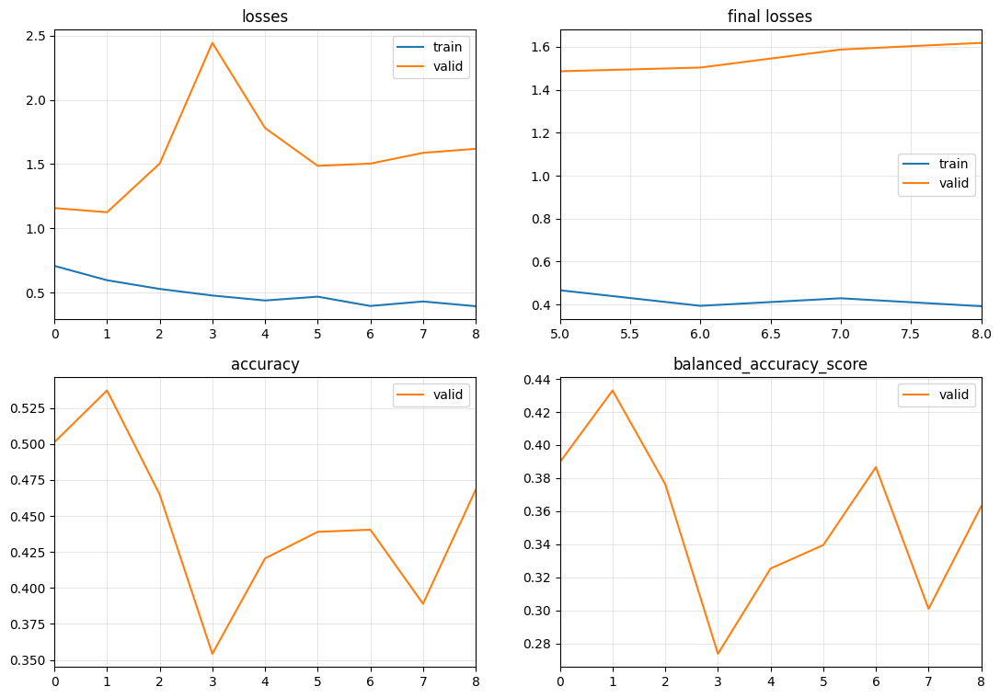

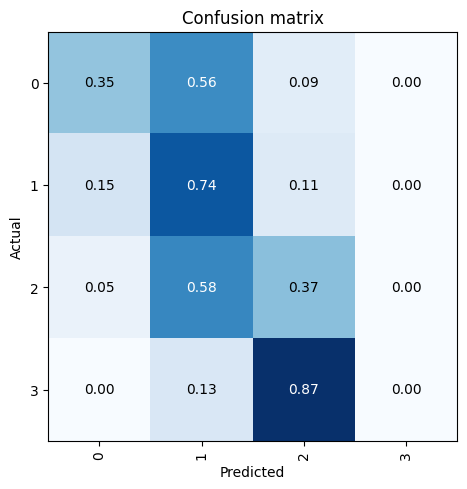

[I 2023-10-14 15:40:30,578] Trial 38 finished with value: 0.4330204299698051 and parameters: {'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 84, 'sample_frac': 0.8, 'batch_size': 128, 'itp_depth': 9, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.512352,1.414252,0.465859,0.360310,02:04
1,0.371024,1.590358,0.523750,0.405117,02:04
2,0.296649,1.990593,0.481406,0.372084,02:04
3,0.255534,2.732876,0.439531,0.353652,02:05
4,0.227090,1.682823,0.436641,0.337586,02:04
5,0.196160,2.105217,0.457109,0.353345,02:04
6,0.188207,2.315371,0.444219,0.343342,02:04
7,0.178146,1.796970,0.488281,0.377610,02:04
8,0.163358,1.981060,0.441719,0.341560,02:04


No improvement since epoch 1: early stopping


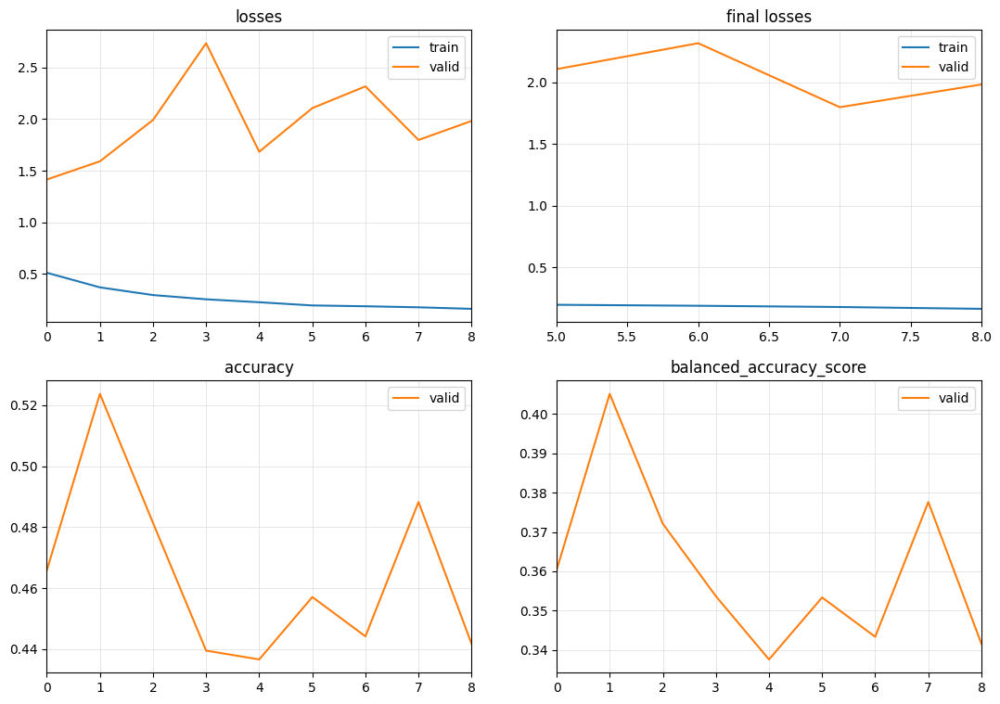

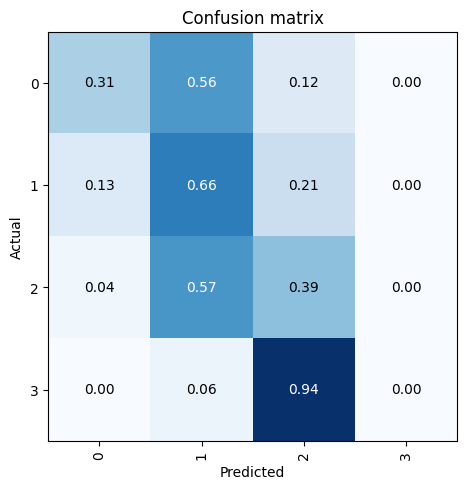

[I 2023-10-14 15:59:58,125] Trial 39 finished with value: 0.40511687333652696 and parameters: {'num_days': 84, 'sample_frac': 0.8, 'batch_size': 128, 'itp_depth': 9, 'learning_rate': 0.0001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 14, 'sample_frac': 0.9, 'batch_size': 32, 'itp_depth': 6, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.624937,1.236355,0.505139,0.389576,02:06
1,0.480303,1.708857,0.492917,0.384320,02:05
2,0.418983,1.609481,0.469306,0.364969,02:05
3,0.377911,2.195312,0.462083,0.377276,02:05
4,0.358939,2.588683,0.438056,0.340009,02:05
5,0.322912,2.268267,0.443125,0.365083,02:05
6,0.297000,2.004749,0.463403,0.363956,02:06
7,0.298534,2.261790,0.450764,0.372627,02:05


No improvement since epoch 0: early stopping


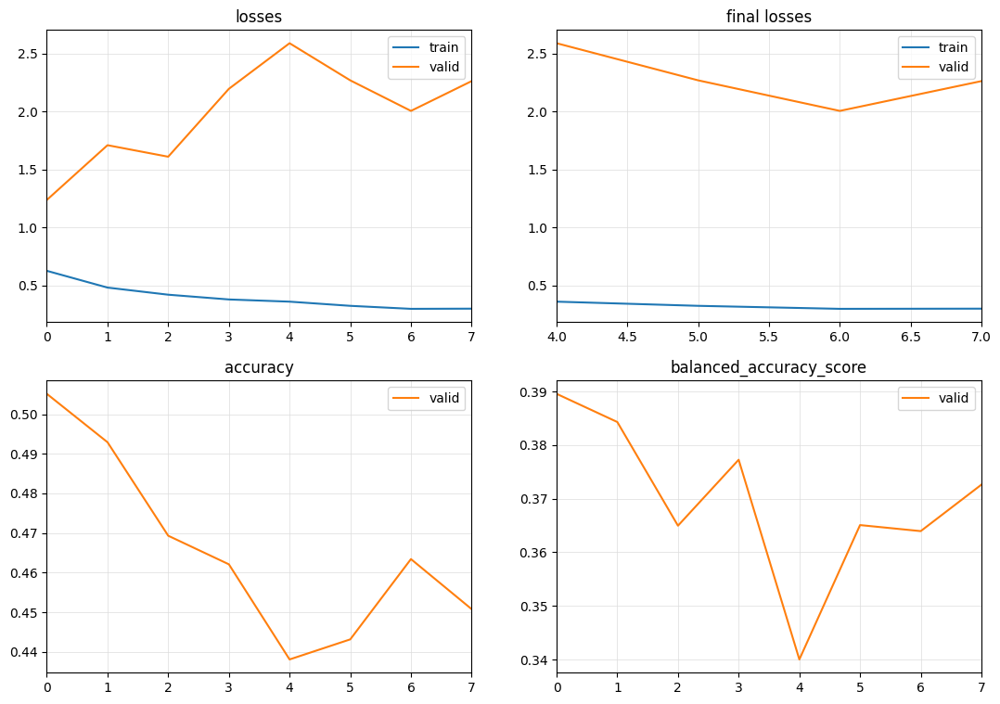

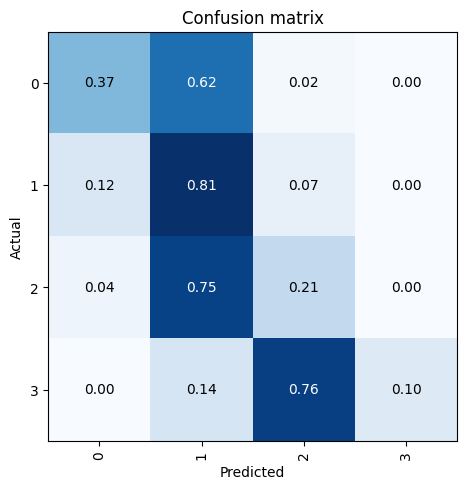

[I 2023-10-14 16:17:32,871] Trial 40 finished with value: 0.3895760496470193 and parameters: {'num_days': 14, 'sample_frac': 0.9, 'batch_size': 32, 'itp_depth': 6, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.7000000000000001, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.697420,1.362696,0.451071,0.406838,05:39
1,0.635405,1.376515,0.468661,0.363233,05:41
2,0.624466,1.124338,0.505446,0.461960,05:51
3,0.553630,1.319897,0.491607,0.451219,05:40
4,0.531642,4.265483,0.338661,0.261968,05:39
5,0.479607,1.585793,0.495000,0.414282,05:41
6,0.494375,1.624244,0.477143,0.391682,05:41
7,0.441547,1.551194,0.483929,0.480112,05:41
8,0.423825,1.378385,0.465536,0.390439,05:40
9,0.436622,1.548516,0.450446,0.352411,05:45


No improvement since epoch 2: early stopping


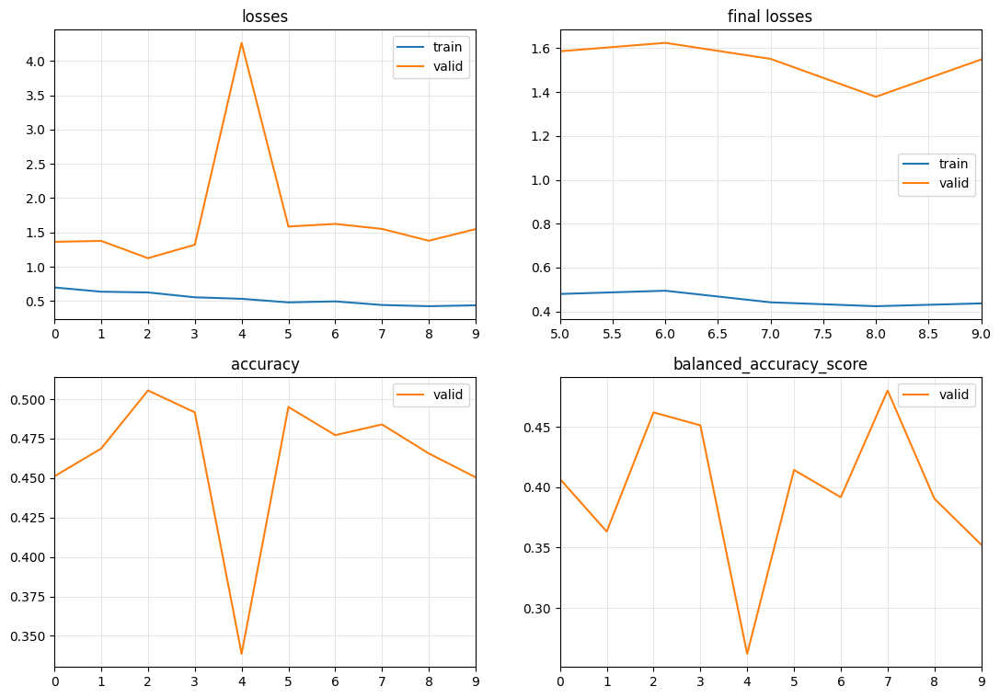

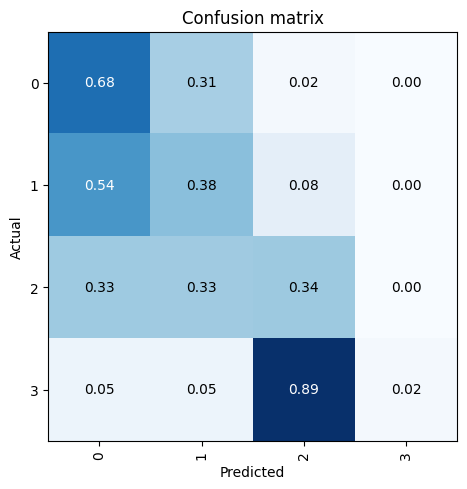

[I 2023-10-14 17:15:43,750] Trial 41 finished with value: 0.4801115410830161 and parameters: {'num_days': 28, 'sample_frac': 0.7000000000000001, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.5, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.790308,0.938180,0.573125,0.491955,03:24
1,0.591873,1.127700,0.530875,0.447007,03:12
2,0.607208,1.271354,0.477875,0.403468,03:11
3,0.552512,1.495809,0.471000,0.379664,03:11
4,0.524758,1.694965,0.426125,0.333858,03:12
5,0.475966,1.377015,0.455625,0.354959,03:12
6,0.469625,1.717955,0.416250,0.323677,03:11
7,0.431251,1.466284,0.459875,0.402228,03:12


No improvement since epoch 0: early stopping


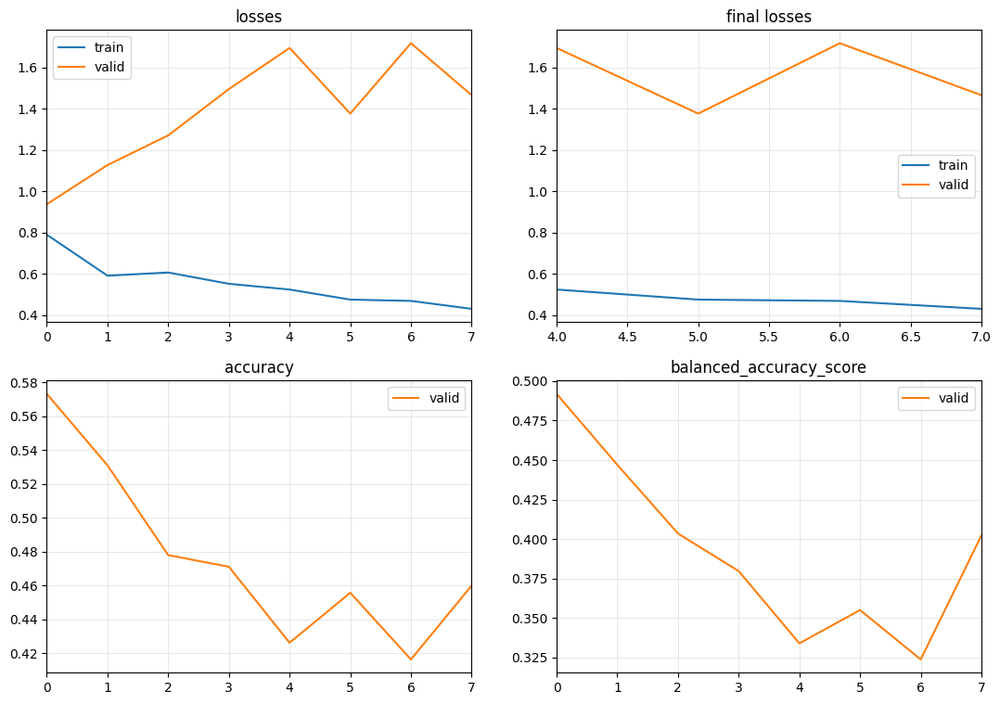

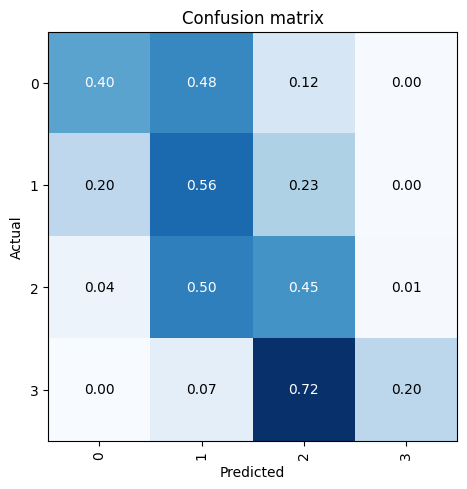

[I 2023-10-14 17:42:43,775] Trial 42 finished with value: 0.4919551126496564 and parameters: {'num_days': 28, 'sample_frac': 0.5, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.6, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.738349,1.422319,0.557187,0.504461,04:52
1,0.622104,1.231326,0.505208,0.388958,04:52
2,0.536645,1.506957,0.427604,0.329765,04:51
3,0.514425,1.246186,0.473021,0.400726,04:52
4,0.466632,1.886197,0.475313,0.381267,04:52
5,0.480700,1.156167,0.485938,0.425528,04:52
6,0.453388,1.384224,0.455417,0.369294,04:53
7,0.462324,1.303669,0.443958,0.352617,04:52


No improvement since epoch 0: early stopping


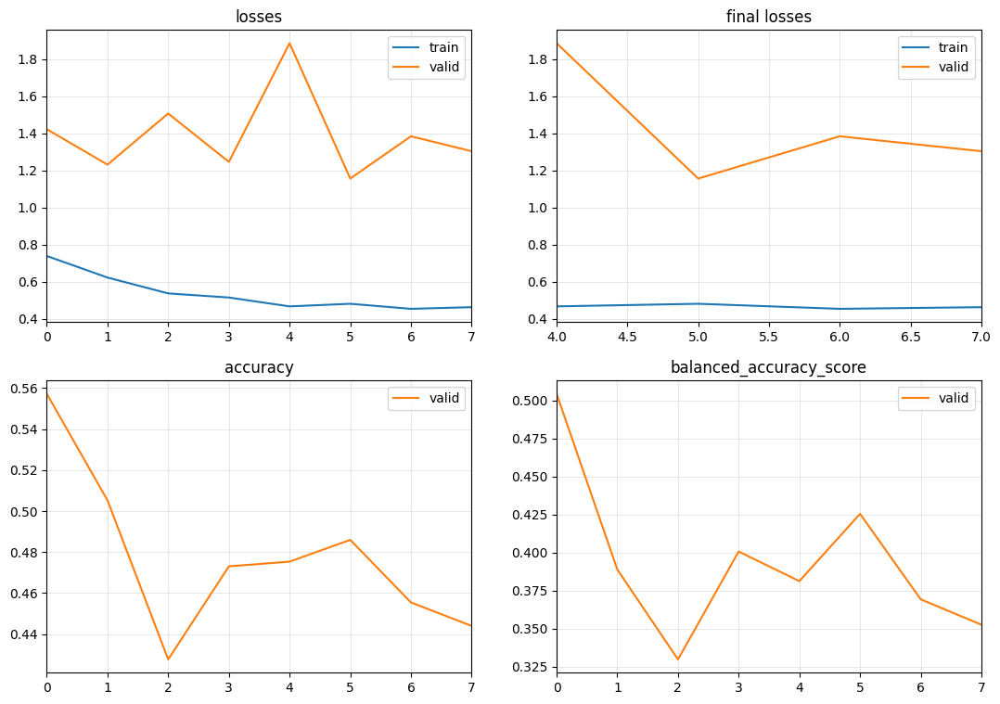

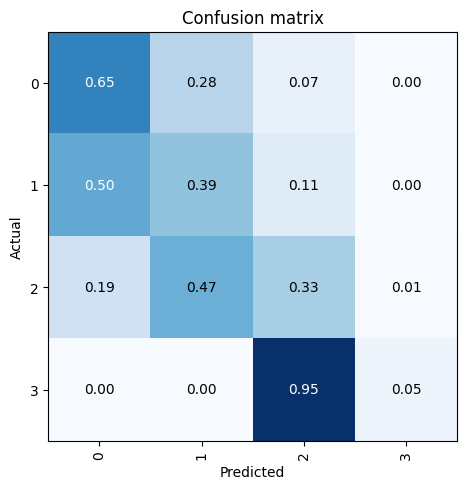

[I 2023-10-14 18:22:43,594] Trial 43 finished with value: 0.5044606174939202 and parameters: {'num_days': 28, 'sample_frac': 0.6, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.692736,1.171732,0.473062,0.365575,06:23
1,0.592522,1.190564,0.503563,0.413265,06:23
2,0.493547,1.401396,0.513875,0.438114,06:24
3,0.508132,1.470789,0.450812,0.366649,06:31
4,0.462619,1.420686,0.457625,0.428298,06:25
5,0.445526,1.640470,0.401875,0.333811,06:22
6,0.437320,1.254430,0.459812,0.378636,06:23
7,0.430224,1.921559,0.402938,0.328279,06:23
8,0.446220,1.365651,0.533000,0.433388,06:24
9,0.433120,1.509737,0.459437,0.376929,06:24


No improvement since epoch 8: early stopping


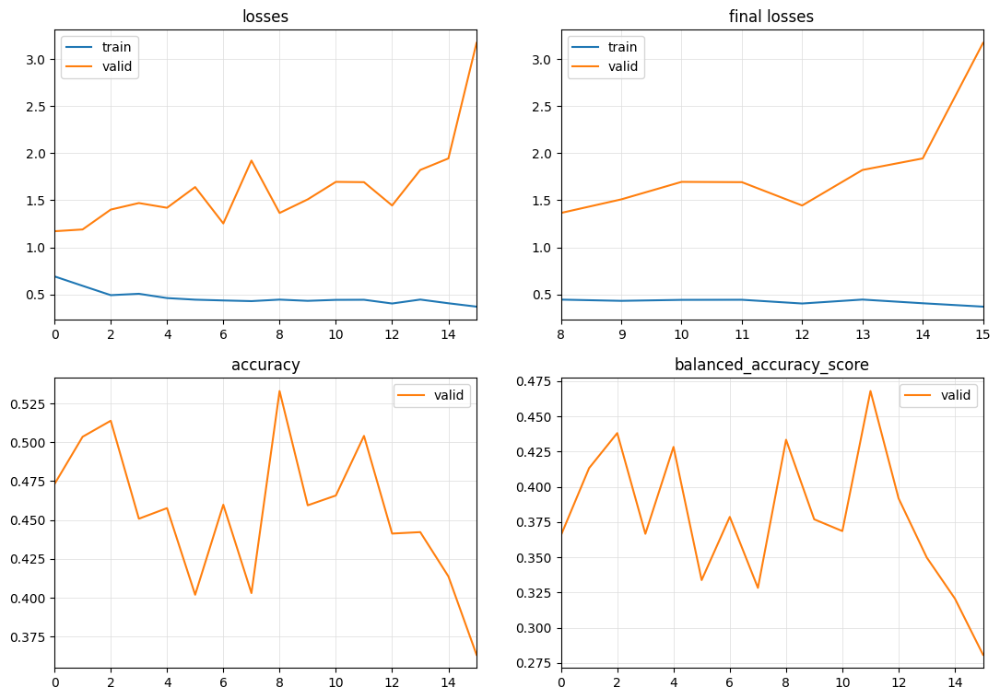

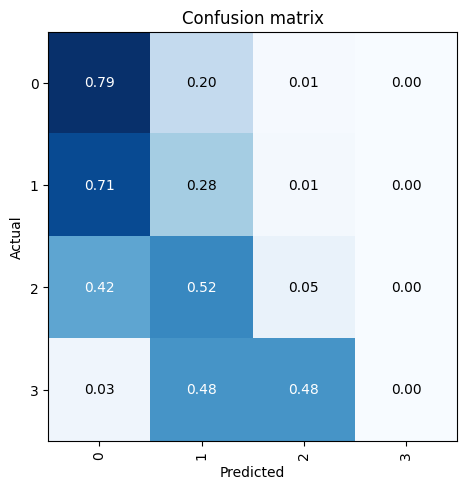

[I 2023-10-14 20:06:34,992] Trial 44 finished with value: 0.46795422434393974 and parameters: {'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.651298,1.127247,0.498750,0.441551,07:16
1,0.558618,1.151088,0.505347,0.405614,07:18
2,0.529296,1.356048,0.471597,0.376067,07:18
3,0.558975,1.138679,0.505833,0.403541,07:18
4,0.489645,1.461729,0.423194,0.347594,07:19
5,0.441458,1.848167,0.405903,0.324054,07:17
6,0.403162,1.477644,0.471944,0.364253,07:19
7,0.416822,2.836933,0.394583,0.306613,07:19
8,0.448105,1.927906,0.415069,0.319880,07:30


No improvement since epoch 1: early stopping


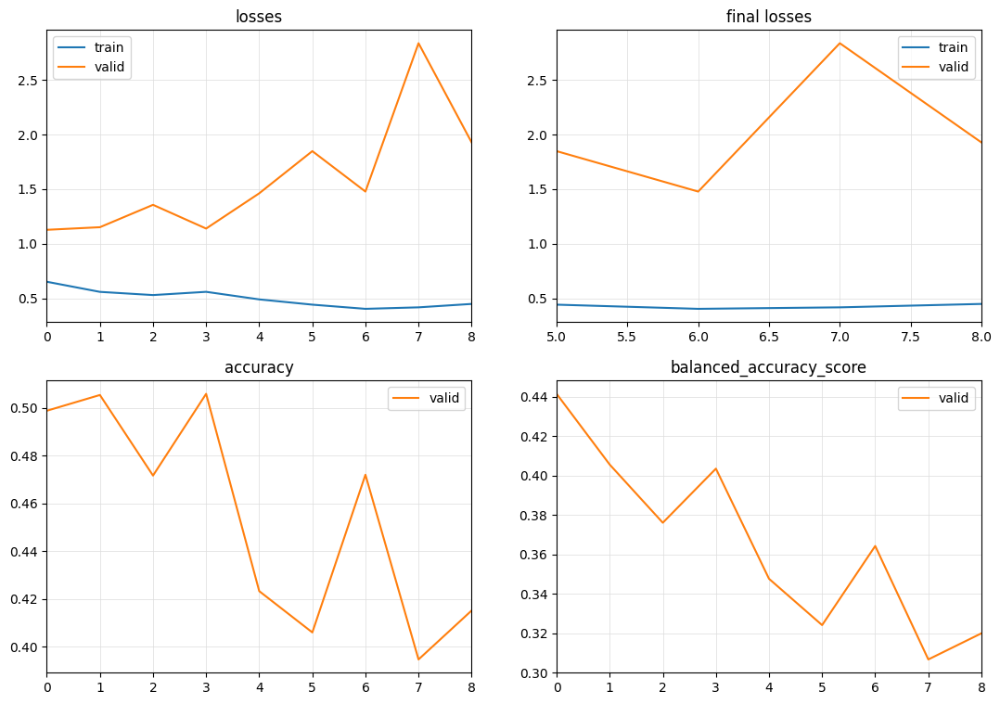

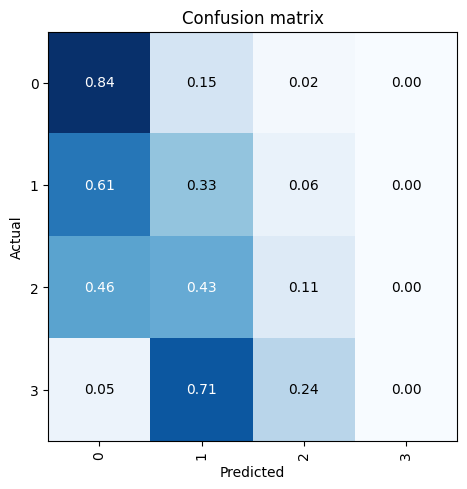

[I 2023-10-14 21:18:59,261] Trial 45 finished with value: 0.4415509929968153 and parameters: {'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 56, 'sample_frac': 0.5, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.619595,1.387897,0.424375,0.326572,01:49
1,0.480522,1.925339,0.457250,0.354610,01:48
2,0.413904,3.081821,0.375625,0.293222,01:48
3,0.356055,2.968216,0.413375,0.320994,01:48
4,0.313889,3.129990,0.401000,0.313708,01:48
5,0.290318,2.247638,0.463875,0.370161,01:48
6,0.272947,1.831910,0.474875,0.368151,01:48
7,0.238601,2.488786,0.446750,0.346418,01:48
8,0.237520,1.943684,0.484875,0.374993,01:48
9,0.214466,2.510587,0.445000,0.345843,01:48


No improvement since epoch 8: early stopping


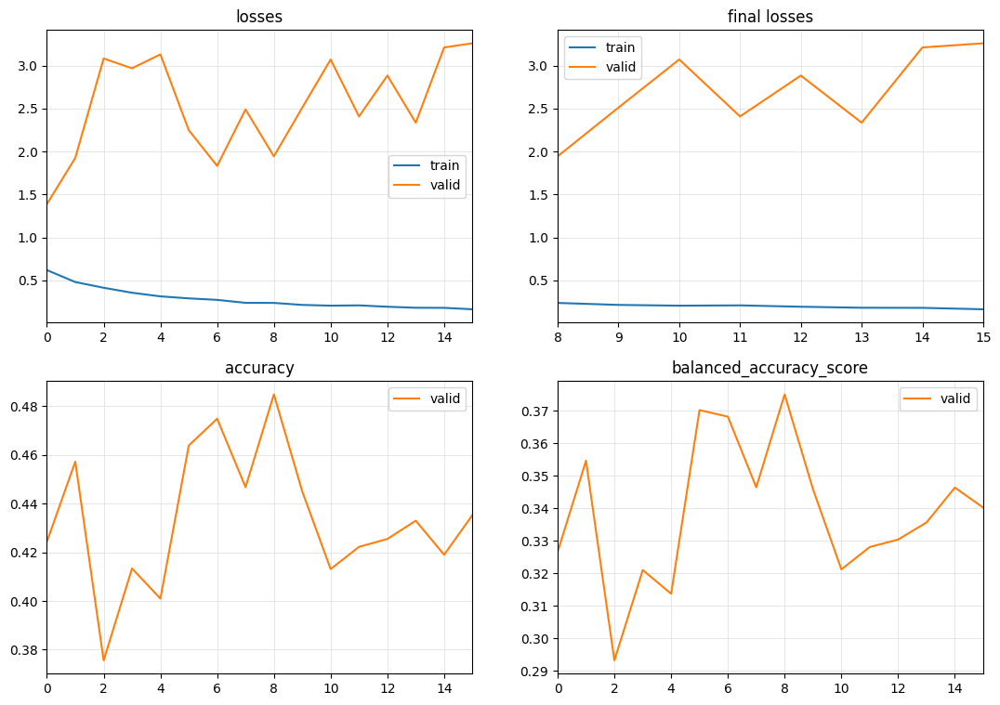

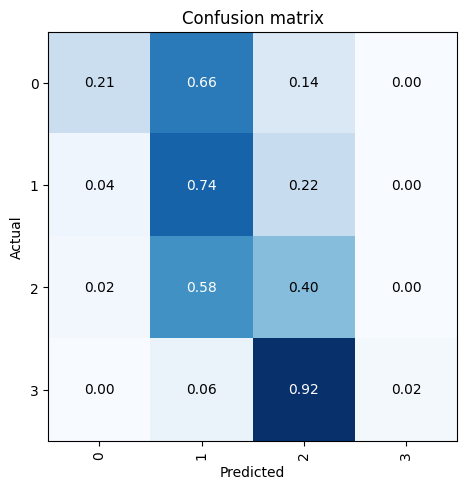

[I 2023-10-14 21:48:34,495] Trial 46 finished with value: 0.3749934823083553 and parameters: {'num_days': 56, 'sample_frac': 0.5, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.30000000000000004, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 1e-05}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.888183,1.131952,0.491250,0.381978,01:54
1,0.718761,1.085788,0.511875,0.397195,01:54
2,0.621754,1.161742,0.487083,0.377328,01:54
3,0.559862,1.103151,0.476250,0.368415,01:55
4,0.516383,1.147350,0.495000,0.388692,01:54
5,0.477149,1.226879,0.488333,0.392480,01:54
6,0.475989,1.244586,0.485208,0.404268,01:54
7,0.386996,1.351342,0.467917,0.374475,01:54
8,0.404002,1.378755,0.474792,0.396236,01:54


No improvement since epoch 1: early stopping


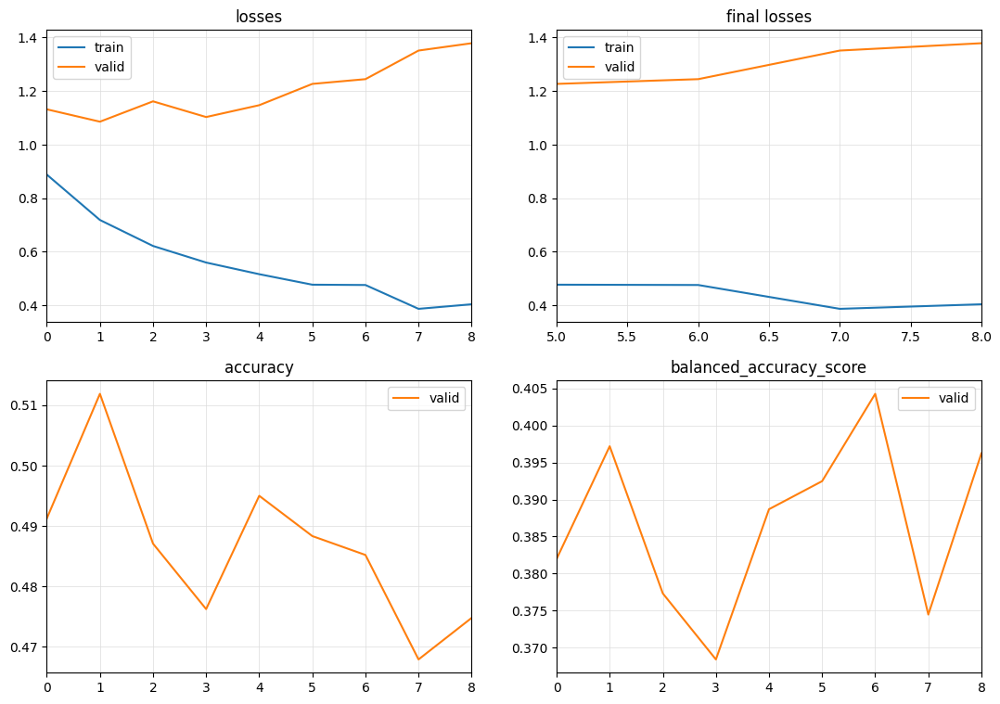

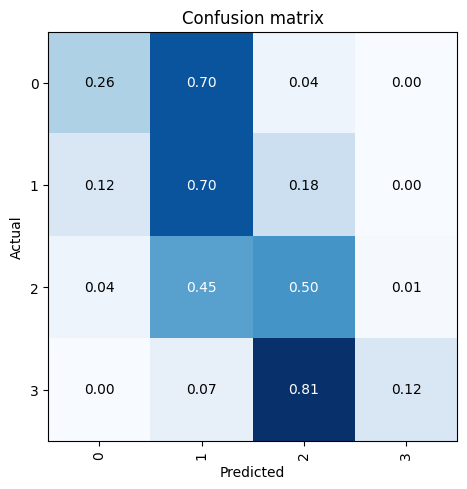

[I 2023-10-14 22:06:30,386] Trial 47 finished with value: 0.404268119998198 and parameters: {'num_days': 28, 'sample_frac': 0.30000000000000004, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 1e-05}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.761374,1.195699,0.441328,0.354153,03:46
1,0.598437,1.911953,0.430078,0.393284,03:47
2,0.533778,1.048536,0.551562,0.434506,03:46
3,0.546321,1.172097,0.535703,0.500215,03:46
4,0.509861,1.394405,0.455000,0.359244,03:46
5,0.481517,1.237020,0.511406,0.431539,03:46
6,0.453532,1.536114,0.424688,0.354551,03:47
7,0.443174,2.319609,0.416016,0.328932,03:44
8,0.434406,1.429539,0.469766,0.394048,03:44
9,0.424078,1.659072,0.413672,0.385204,03:47


No improvement since epoch 2: early stopping


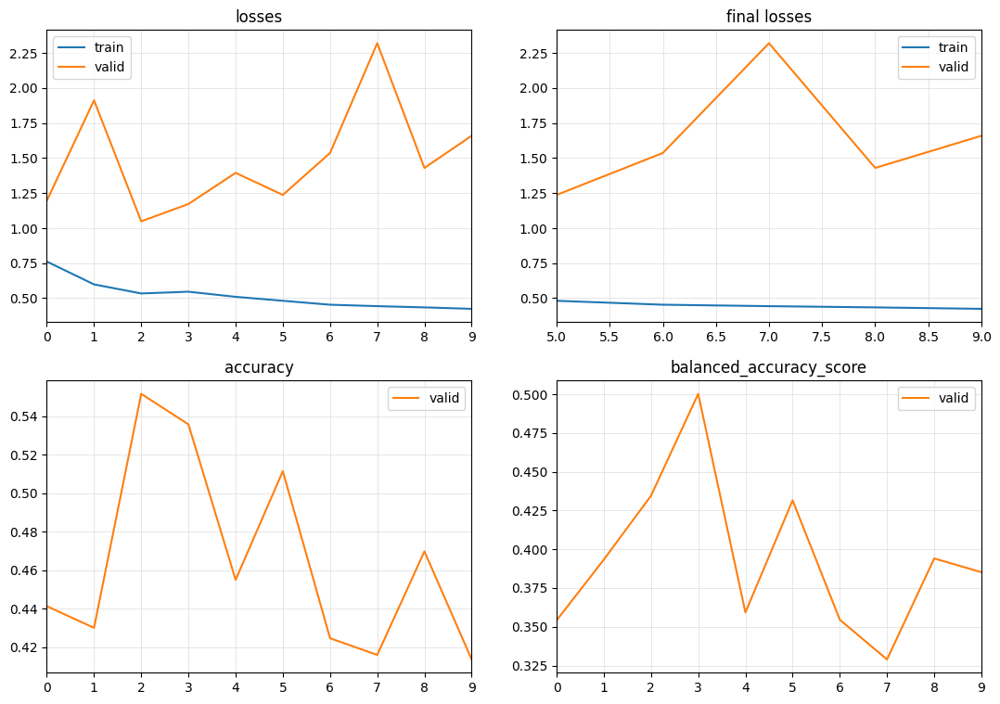

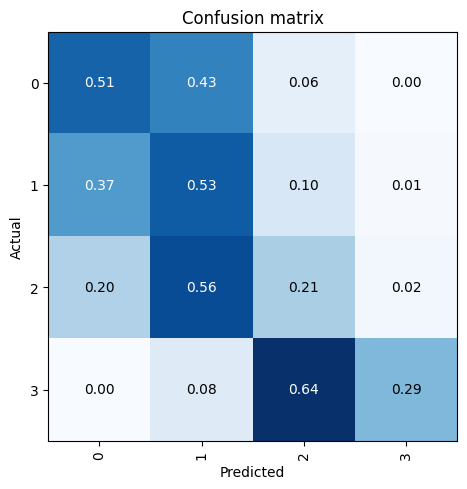

[I 2023-10-14 22:45:15,101] Trial 48 finished with value: 0.5002149284380603 and parameters: {'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 14, 'sample_frac': 1.0, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.554493,1.734491,0.474375,0.367360,03:14
1,0.481368,1.421960,0.477437,0.483535,03:15
2,0.384638,2.615484,0.425563,0.333747,03:15
3,0.368151,1.819435,0.421438,0.379868,03:15
4,0.344663,1.836415,0.439063,0.390990,03:15
5,0.327379,1.706538,0.427750,0.401120,03:15
6,0.296689,2.093585,0.435688,0.361960,03:15
7,0.300815,1.791416,0.455438,0.361947,03:15
8,0.283229,1.676903,0.468500,0.389432,03:15


No improvement since epoch 1: early stopping


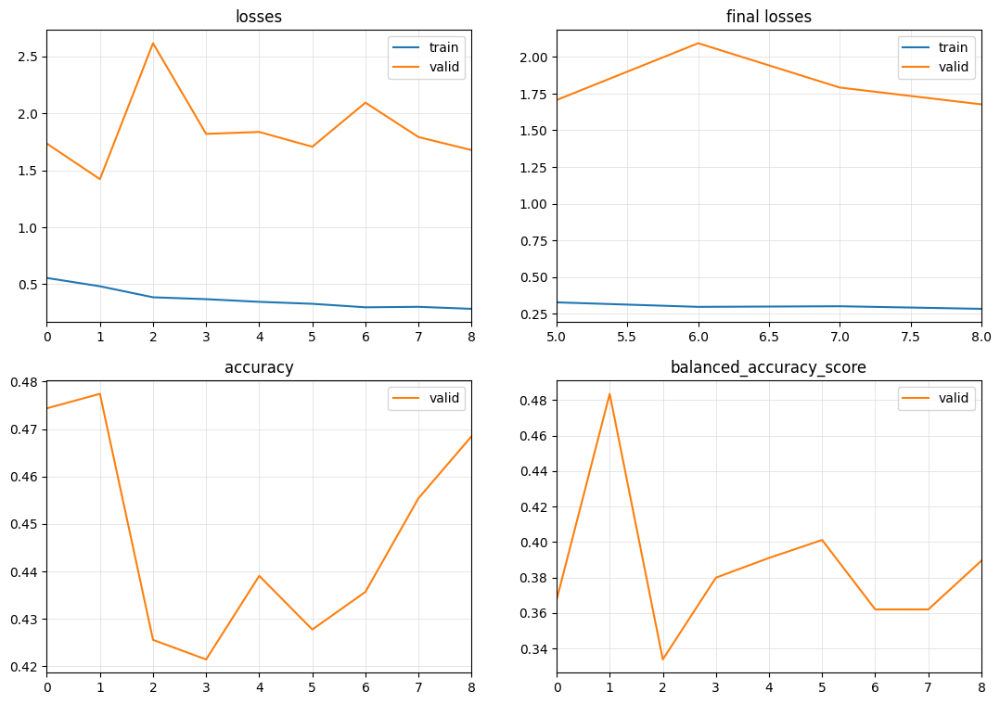

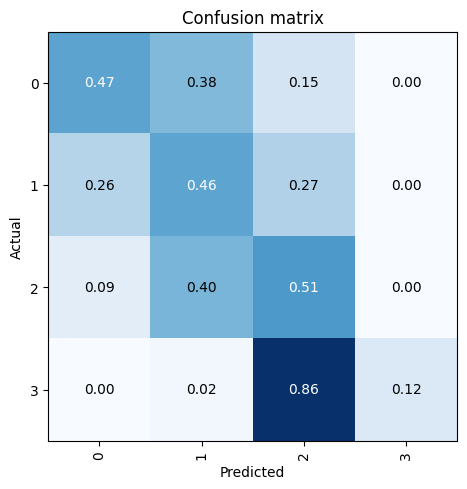

[I 2023-10-14 23:20:22,254] Trial 49 finished with value: 0.4835345274423787 and parameters: {'num_days': 14, 'sample_frac': 1.0, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


In [30]:
study = optuna.create_study(direction='maximize')#, sampler=optuna.samplers.NSGAIISampler())
#if exists("study.pkl"):
#   study = joblib.load("study.pkl")
    
#with bug to filter features instead of days
study.optimize(objective, n_trials=50)

In [ ]:
from optuna.visualization import plot_contour
from optuna.visualization import plot_edf
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice
#if exists("study.pkl"):
#   study = joblib.load("study.pkl")
plot_optimization_history(study)

## Top Values
Trial 289 finished with value: 0.617 and parameters: {'num_days': 28, 'batch_size': 8, 'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_depth': 6, 'itp_dropout_rate': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': 0.0024792334740007253}
        
Trial 454 finished with value: 0.616 and parameters: {'num_days': 28, 'batch_size': 8, 'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_depth': 9, 'itp_dropout_rate': 0.0, 'loss_func': 'None', 'learning_rate': 0.0024792334740007253}
        
Trial 161 finished with value: 0.609 and parameters: {'num_days': 84, 'batch_size': 8, 'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_depth': 9, 'itp_dropout_rate': 0.0, 'loss_func': 'None', 'learning_rate': 0.0006723398746247245}
        
Trial 26  finished with value: 0.611 and parameters: {'num_days': 84, 'batch_size': 8, 'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_depth': 6, 'itp_dropout_rate': 0.2, 'loss_func': 'None', 'learning_rate': 1.339568695002037e-05}

## TOp Values with Trend
{'model': 'InceptionTimePlus', 'itp_num_filters': 64, 'itp_depth': 6, 'itp_dropout_rate': 0.0, 'itp_ks': 50, 'loss_func': 'None', 'learning_rate': 5.313916392384214e-05, 'learner_callback': 'None', 'optimizer': 'AdamWD'}

{'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_depth': 9, 'itp_dropout_rate': 0.0, 'itp_ks': 20, 'loss_func': 'None', 'learning_rate': 0.0005038686183117699, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}

{'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_depth': 9, 'itp_dropout_rate': 0.0, 'itp_ks': 20, 'loss_func': 'None', 'learning_rate': 0.0008308573431574618, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}

In [ ]:
plot_contour(study, params=[''learner_callback', 'learning_rate''])

In [ ]:
?plot_contour

In [ ]:
plot_parallel_coordinate(study, params=['learning_rate', 'model'])

In [ ]:
plot_param_importances(study)

In [ ]:
splits

In [ ]:
?LSTMPlus

In [ ]:
splits, dls = utils.create_dls(X, y, feature_mins=np.asarray(feature_mins[filtered_feature_indexes]), 
                                   feature_maxs=np.asarray(feature_maxs[filtered_feature_indexes]), 
                                   splits=splits, sample_frac=1)

In [ ]:
#{'model': 'LSTM', 'hidden_size': 150, 'lstm_n_layers': 3, 
#'rnn_dropout': 0.8, 'bidirectional': False, 'lstm_fc_dropout': 0.6000000000000001, 
#'lstm_cell_type': 'GRU', 'loss_func': 'None', 'learning_rate': 0.001038746221962459,
#'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}
#new
#{'model': 'LSTM', 'hidden_size': 100, 'lstm_n_layers': 3, 
#'rnn_dropout': 0.6000000000000001, 'bidirectional': True, 'lstm_fc_dropout': 0.2,
#'lstm_cell_type': 'GRU', 'loss_func': 'None', 'learning_rate': 0.000167599474812371, 
#'learner_callback': 'None', 'optimizer': 'AdamWD'}
model = GRUPlus(dls.vars, dls.c, hidden_size=150, n_layers=3, rnn_dropout=.8, bidirectional=False, 
                fc_dropout=.6)
learn = Learner(dls, model, loss_func=None, opt_func=partial(Adam, decouple_wd=True),  metrics=accuracy, cbs=CutMix1d())   

In [ ]:
#{'model': 'InceptionTimePlus', 'itp_num_filters': 64, 'itp_depth': 6, 
#'itp_dropout_rate': 0.2, 'itp_ks': 40, 'loss_func': 'None', 
#'learning_rate': 0.0001258783818975996, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}

model = InceptionTimePlus(dls.vars, dls.c, nf=64, depth=6, conv_dropout=.2, ks=40 )
learn = Learner(dls, model, loss_func=None, opt_func=partial(Adam, decouple_wd=False),  metrics=accuracy, cbs=IntraClassCutMix1d())   

In [ ]:
#optimum for 30k samples {'arch': 'InceptionTimePlus', 'bottleneck': True, 'coord': False, 'depth': 3, 'dropout': 0.0, 'ks': 60, 'lr': 0.001, 'num_filters': 64}
#for 180k samples 72 features {'arch': 'InceptionTimePlus', 'bottleneck': True, 'coord': False, 'depth': 6, 'dropout': 0.8, 'ks': 5, 'loss': 'LabelSmoothingCrossEntropy', 'lr': 0.01, 'num_filters': 32}
#{'arch': 'InceptionTimePlus', 'bottleneck': True, 'coord': False, 'depth': 6, 'dropout': 0.8, 'ks': 5, 'loss': 'LabelSmoothingCrossEntropy', 'lr': 0.001, 'num_filters': 64}
dls = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64], batch_tfms=batch_tfms, num_workers=12, inplace=False)
model = InceptionTimePlus(dls.vars, dls.c, bottleneck=True, coord=False, ks=5, conv_dropout=.8, depth=6, nf=32)
learn = Learner(dls, model, loss_func=LabelSmoothingCrossEntropy(), metrics=accuracy)   

In [ ]:
learn.lr_find()

In [ ]:
learn.fit(200, lr=.001, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.001, patience=1)])

In [ ]:
learn.feature_importance()

In [ ]:
#small dset
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)
conf_matrix = interp.plot_confusion_matrix(normalize=False)

In [ ]:
learn.fit(200, lr=0.0001, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.001, patience=7)])

In [ ]:
#large dset, 77.6% at hidden_size: 350
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)
conf_matrix = interp.plot_confusion_matrix(normalize=False)

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
models = []
for i in range(5):
    model = None
    dls = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64], batch_tfms=batch_tfms, num_workers=12, inplace=False)
    model = TST(dls.vars, dls.c, dls.len, d_ff=512, d_k=64, d_model=128, d_v=64, dropout=.7, fc_dropout=.1, n_heads=16, n_layers=4)
    learn = Learner(dls, model, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=accuracy,  cbs=ShowGraphCallback2())
    learn.fit_one_cycle(25, lr_max=1e-4, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.001, patience=3)])
    interp = ClassificationInterpretation.from_learner(learn)
    conf_matrix = interp.plot_confusion_matrix(normalize=True)
    print(str(accuracy_local(interp)))
    models.append(model)
    

In [ ]:
y[splits_2[1]]

In [ ]:
ys = []
ys[0] = models[0]

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

In [ ]:
#30 days, 50% samples , 74 features
learn.fit_one_cycle(25, lr_max=1e-4, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.001, patience=5)])#, SaveModelCallback(every_epoch=True)])


In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

In [ ]:
X_valid = learn.dls.valid.dataset[:100][0].data
y_valid = learn.dls.valid.dataset[:100][1].data.numpy()

In [ ]:
X_valid.dtype

In [ ]:
sys.getsizeof(X_valid)

In [ ]:
learn.dls.valid.splits

In [ ]:
X_valid.shape

In [ ]:
y_valid.numpy()

In [ ]:
metrics = [mn for mn in learn.recorder.metric_names if mn not in ['epoch', 'train_loss', 'valid_loss', 'time']]

In [ ]:
key_metric_idx=0
if len(metrics) == 0 or key_metric_idx is None:
    metric_name = learner.loss_func.__class__.__name__
    key_metric_idx = None
else:
    metric_name = metrics[key_metric_idx]
    metric = learn.recorder.metrics[key_metric_idx].func
print(f'Selected metric: {metric_name}')

In [ ]:
feature_names = pd.read_csv(ml_path + '/FeatureLabels_' + file_label + '.csv')
feature_names = feature_names['0'].sort_values().values

In [ ]:
if feature_names is None:
    feature_names = [f"var_{i}" for i in range(X_valid.shape[1])]

In [ ]:
results = []
print('Computing feature importance...')

COLS = ['BASELINE'] + list(feature_names)

In [ ]:
len(dls.valid.dataset.tls[0]._splits)

In [ ]:
dls.valid.dataset[0:10][0].data.shape

In [ ]:
X_valid[:, k-1].clone()

In [ ]:
k = 5
random_state=23
if k>0:
    save_feat = X_valid[:, k-1].clone()
    X_valid[:, k-1] = random_shuffle(X_valid[:, k-1].flatten(), random_state=random_state).reshape(X_valid[:, k-1].shape)
if key_metric_idx is None:
    value = learn.get_X_preds(X_valid, y_valid, with_loss=True)[-1].mean().item()
else:
    output = learn.get_X_preds(X_valid, y_valid)
    value = metric(output[0], output[1]).item()
    print(f"{k:3} feature: {COLS[k]:20} {metric_name}: {value:8.6f}")
    results.append([COLS[k], value])
if k>0:
    X_valid[:, k-1] = save_feat
    del save_feat; gc.collect()

In [ ]:
??learn.dls.valid.new_dl

In [ ]:
from __future__ import print_function
from sys import getsizeof, stderr
from itertools import chain
from collections import deque
try:
    from reprlib import repr
except ImportError:
    pass

def total_size(o, handlers={}, verbose=False):
    """ Returns the approximate memory footprint an object and all of its contents.

    Automatically finds the contents of the following builtin containers and
    their subclasses:  tuple, list, deque, dict, set and frozenset.
    To search other containers, add handlers to iterate over their contents:

        handlers = {SomeContainerClass: iter,
                    OtherContainerClass: OtherContainerClass.get_elements}

    """
    dict_handler = lambda d: chain.from_iterable(d.items())
    all_handlers = {tuple: iter,
                    list: iter,
                    deque: iter,
                    dict: dict_handler,
                    set: iter,
                    frozenset: iter,
                   }
    all_handlers.update(handlers)     # user handlers take precedence
    seen = set()                      # track which object id's have already been seen
    default_size = getsizeof(0)       # estimate sizeof object without __sizeof__

    def sizeof(o):
        if id(o) in seen:       # do not double count the same object
            return 0
        seen.add(id(o))
        s = getsizeof(o, default_size)

        if verbose:
            print(s, type(o), repr(o), file=stderr)

        for typ, handler in all_handlers.items():
            if isinstance(o, typ):
                s += sum(map(sizeof, handler(o)))
                break
        return s

    return sizeof(o)



In [ ]:
del dl; gc.collect()

In [ ]:
bs=64
with_input=False
with_decoded=True
with_loss=False
dl = learn.dls.valid.new_dl(X_valid, y=y_valid)
if bs: setattr(dl, "bs", bs)
else: assert dl.bs, "you need to pass a bs != 0"
output = list(learn.get_preds(dl=dl, with_input=with_input, with_decoded=with_decoded, with_loss=with_loss, reorder=False))
if with_decoded and len(learn.dls.tls) >= 2 and hasattr(learn.dls.tls[-1], "tfms") and hasattr(learn.dls.tls[-1].tfms, "decodes"):
    output[2 + with_input] = learn.dls.tls[-1].tfms.decode(output[2 + with_input])


In [ ]:
learn.dls.tls[-1]

In [ ]:
output = learn.get_X_preds(X_valid, y_valid)

In [ ]:
import sys

In [ ]:
total_size(learn)

In [ ]:
total_size(dl)

In [ ]:
total_size(output)

In [ ]:
total_size(X_valid)

In [ ]:
total_size(results)

In [ ]:
total_size(value)

In [ ]:
results

In [ ]:
gc.collect()

In [ ]:
b = dls.valid.one_batch()



In [ ]:
dsets.valid

In [ ]:
probas, target, preds  = learn.get_preds(dl=dls.valid, with_input=False, with_loss=False, with_decoded=True, act=None)

In [ ]:
X[splits_2[1]].shape

In [ ]:
dls.bs

In [ ]:
learn.feature_importance(X[splits_2[1]], y[splits_2[1]])

In [ ]:
for i in range(75):
    print(str(i))
    probas, target, preds = learn.get_X_preds(X[splits_2[1]], y[splits_2[1]])

In [ ]:
import gc
gc.collect()

In [ ]:
#60000 samples 0 dropout
learn.fit_one_cycle(25, lr_max=1e-4, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.01, patience=5)])#, SaveModelCallback(every_epoch=True)])
learn.recorder.plot_metrics()
interp = ClassificationInterpretation.from_learner(learn)
#conf_matrix = interp.plot_confusion_matrix(normalize=True)

print(accuracy_local(interp))

In [ ]:
conf_matrix = interp.plot_confusion_matrix(normalize=True)

In [ ]:
#60000 samples
learn.fit_one_cycle(25, lr_max=1e-3, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.01, patience=3)])#, SaveModelCallback(every_epoch=True)])
learn.recorder.plot_metrics()
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

print(accuracy_local(interp))

In [ ]:
torch.cuda.empty_cache()

In [ ]:
learn.fit_one_cycle(5, lr_max=1e-2)#, cbs=EarlyStoppingCallback(monitor='accuracy', min_delta=0.1, patience=5))
learn.recorder.plot_metrics()
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

print(accuracy_local(interp))

In [ ]:
ordered_label_errors.shape

In [ ]:
[[x for x in splits_2[0] if x not in ordered_label_errors], splits_2[1]]

In [ ]:
batch_tfms = [TSStandardize(by_var=True), Nan2Value()]
clf = TSClassifier(X, y, splits=[[x for x in splits_2[0] if x not in ordered_label_errors], splits_2[1]], arch=InceptionTimePlus, batch_tfms=batch_tfms, metrics=accuracy, cbs=ShowGraph(), verbose=True)
clf.fit_one_cycle(3, 1e-2)

In [ ]:
interp = ClassificationInterpretation.from_learner(clf)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

In [ ]:
feature_names = pd.read_csv(ml_path + '/FeatureLabels_' + file_label + '.csv')
feature_names = feature_names['0'].sort_values().values

In [ ]:
feature_names.shape

In [ ]:
X.shape

In [ ]:
import xarray as xr

In [ ]:
da = xr.DataArray(X, dims=['sample','feature', 'timestep'], coords=[range(0,12000),feature_names,range(0,180)])

In [ ]:
feature_names

In [ ]:
filtered_feature_indexes

In [ ]:
avg_features = [x for x in feature_names if 'avg' in x ]

In [ ]:
many_level_features = ['ABSV', 'HGT']

In [ ]:
filtered_features

In [ ]:
feature = ['WEASD_surface_max', 'SNOD_surface_max', 'UGRD_30M0mbaboveground_max', 'VGRD_30M0mbaboveground_max', 'TMP_surface_min', 'HGT_surface_min', 'VVEL_150mb_avg', 'APCP_surface_sum', 'ACPCP_surface_sum', 'WATR_surface_sum']
small_feature_indexes = [list(feature_names).index(x) for x in feature]

In [ ]:
da.sel(feature='SNOD_surface_avg', sample=4).plot()

In [ ]:
da.sel(feature='APCP_surface_sum', sample=range(0,100)).plot()

In [ ]:
y.shape


In [ ]:
#X, y, splits = get_classification_data('ECG200', split_data=False)

In [ ]:
X.shape

In [ ]:
da.sel(feature=feature, timestep=timestep).values.reshape(6500,len(feature),len(timestep))[splits_2[0][8]][7]

In [ ]:
timestep=range(0,180)
feature = ['WEASD_surface_max', 'SNOD_surface_max', 'UGRD_30M0mbaboveground_max', 'VGRD_30M0mbaboveground_max', 'TMP_surface_min', 'HGT_surface_min', 'VVEL_150mb_avg', 'APCP_surface_sum', 'ACPCP_surface_sum', 'WATR_surface_sum']
bad_features = ['PRES_surface_max', 'TSOIL_1M2mbelowground_max', 'TMP_surface_min', 'RH_2maboveground_max']
tfms = [None, [Categorize()]]
X = da.sel(feature=feature, timestep=timestep).values.reshape(12000,len(feature),len(timestep))
dsets2 = TSDatasets(X, y, tfms=tfms, splits=splits_2, inplace=True)
#create the dataloader
dls2 = TSDataLoaders.from_dsets(dsets2.train, dsets2.valid, bs=[64], batch_tfms=[TSStandardize(by_var=True), Nan2Value()], num_workers=0)

In [ ]:
ts_features = get_ts_features(np.nan_to_num(X), y, n_jobs=20)

In [ ]:
ts_features.shape

In [ ]:
dls2.train.show_batch()

In [ ]:
dls2.valid.show_batch()

In [ ]:
??get_ts_features

In [ ]:
#TST: 30: .29
#TST: 80: .2
#TST: 180: .4

#Try TST
model = InceptionTimePlus(dls2.vars, dls2.c, dls2.len)#, res_dropout=.3, fc_dropout=.8)
#config = {'res_dropout':.3, 'fc_dropout':.8}
learn = Learner(dls2, model, loss_func=LabelSmoothingCrossEntropy(), metrics=[RocAuc(), accuracy],  cbs=ShowGraphCallback2())
#learn = TSClassifier( y, splits=splits_3, arch=TST, arch_config=config, batch_tfms=[TSStandardize(), Nan2Value()], metrics=accuracy, cbs=ShowGraph(), verbose=True)
#learn.fit_one_cycle(10, 1e-4)

In [ ]:
learn.lr_find()

In [ ]:
learn.fit_one_cycle(10, 1e-4)

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

print(accuracy_local(interp))


In [ ]:
from captum.attr import IntegratedGradients
from captum.attr import LayerConductance
from captum.attr import NeuronConductance

In [ ]:
net = learn.model.cpu()

In [ ]:
b = dls.one_batch()

In [ ]:
test_input_tensor = b[0].type(torch.FloatTensor)

In [ ]:
test_labels = b[1].cpu().data.numpy()

In [ ]:
out_probs = net(test_input_tensor).detach().cpu().numpy()
out_classes = np.argmax(out_probs, axis=1)
train_accuracy = sum(out_classes == test_labels) / len(test_labels)
print("Accuracy:", train_accuracy )

In [ ]:
mlflow.log_metric('Train Accuracy', train_accuracy)

In [ ]:
ig = IntegratedGradients(net)

In [ ]:
#test_input_tensor.requires_grad_()
attr, delta = ig.attribute(test_input_tensor,target=1, return_convergence_delta=True)
attr = attr.detach().numpy()

In [ ]:
feature_names = feature_names[feature_filter]

In [ ]:
# Helper method to print importances and visualize distribution
def visualize_importances(feature_names, importances, title="Average Feature Importances", plot=True, axis_title="Features"):
    pd.DataFrame(zip(feature_names, np.mean(importances, axis=(0,2)))).sort_values(1, ascending=False)[:25].plot.barh(x=0, y=1)

visualize_importances(feature_names, attr)

In [ ]:
top_features =  pd.DataFrame(zip(feature_names, np.mean(attr, axis=(0,2))), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)

In [ ]:
top_features.to_csv('../Scratch/Notebooks/' + '/FeatureImportances.csv')

In [ ]:
top_features = pd.read_csv('../Scratch/Notebooks/' + '/FeatureImportances.csv')

In [ ]:
orig_X = X

In [ ]:
orig_feature_means = feature_means

In [ ]:
orig_feature_std = feature_std

In [ ]:
mlflow.end_run()

In [ ]:
feature_filter = top_features[:100].index

In [ ]:
X = orig_X[:, feature_filter, :]
feature_means = orig_feature_means[feature_filter]
feature_std = orig_feature_std[feature_filter]

In [ ]:
fill_values = torch.zeros_like(TSTensor(X))
for i in range(0,X.shape[1]):
    fill_values[:,i,:] = torch.full_like(TSTensor(X[:,i,:]), feature_means[i])
        
X_noNan = torch.where(torch.isnan(TSTensor(X)), fill_values, TSTensor(X))

In [ ]:
X_noNan[:,:,-30:].shape